In [ ]:
import os
import random
import subprocess
import time
from copy import deepcopy

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib.collections import LineCollection
from sklearn.metrics import mean_absolute_error, r2_score
from torch import Tensor
from torch_geometric.data import Data
from tqdm import tqdm

import lammps_scripts
import network
from graph_utils import (
    LJInteractionParams,
    compute_angle_indices,
    compute_angles,
    get_correct_edge_vec,
    prepare_traj,
)
from itpo_weights import DatasetType
from lammps_scripts import CompressionSimulation
from PPredictor import Model as PPredictorModel
from torch_simulator_wLJ_64 import DifferentiableCompression64
from training_utils import freeze_normalizer
from utils import (
    build_velocity_graph_correction,
    calc_p_ratio_box,
    calc_p_ratio_box_tensor,
    draw_graph,
    draw_two_graphs,
    get_correct_edge_attr,
    load_and_split_dataset,
    to_f32,
    visualize_nu_disribution,
)


### Load Data

Loading data with max simulation length of 200...


test  data: 100%|██████████| 125/125 [00:04<00:00, 29.48it/s]



Preparing data...


test  data: 100%|██████████| 125/125 [00:05<00:00, 24.53it/s]



Train data: 250 sims.
Val data:   125 sims.
Test data:  125 sims.


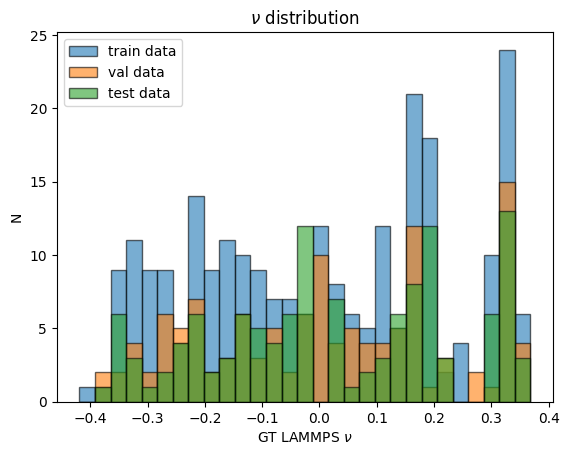

In [2]:
poisson_buckets = [
    {"max": 0.1, "count": 300},               # P < 0.1
    {"min": 0.1, "max": 0.2, "count": 100},   # 0.1 <= P < 0.2
    {"min": 0.2, "count": 100}                # P >= 0.2
]

dataset_type = DatasetType.NodeOptimized

train_files, val_files, test_files = load_and_split_dataset(
    # registry_path="./data_mini/data_registry_mini.csv",
    registry_path="./data/data_registry.csv",
    # registry_path="./data_reid_with_angles/data_registry.csv",
    target_data_type=dataset_type,
    possion_buckets=poisson_buckets,
    split_ratios=(0.5, 0.25, 0.25),
    seed=42
)

# Load actual data
data = {
    'train': {},
    'val' : {},
    'test' : {},
}

max_sim_len = 200
print(f"Loading data with max simulation length of {max_sim_len}...")
# stride = 5
# print(f"Loading data with additional stride of {stride}.")
for key in data:
    if key == 'train':
        data[key] = [torch.load(file, weights_only=False)[:max_sim_len] for file in tqdm(train_files, desc=f"{key:<5} data")]
        # data[key] = [torch.load(file, weights_only=False)[::stride] for file in tqdm(train_files, desc=f"{key:<5} data")]
    elif key == 'val':
        data[key] = [torch.load(file, weights_only=False)[:max_sim_len] for file in tqdm(val_files, desc=f"{key:<5} data")]
        # data[key] = [torch.load(file, weights_only=False)[::stride] for file in tqdm(val_files, desc=f"{key:<5} data")]
    elif key == 'test':
        data[key] = [torch.load(file, weights_only=False)[:max_sim_len] for file in tqdm(test_files, desc=f"{key:<5} data")]
        # data[key] = [torch.load(file, weights_only=False)[::stride] for file in tqdm(test_files, desc=f"{key:<5} data")]
    else:
        raise ValueError(f"Unexpected key in data dictionary: {key}. ")

print("\nPreparing data...")
for data_type, sims in data.items():
    prepared = []
    for sim in tqdm(sims, desc=f"{data_type:<5} data"):
        lj_params = LJInteractionParams(0.01, 1.0, 1.122) if dataset_type is DatasetType.LJNoisy else None
        prepared_sim = prepare_traj(sim, lj_params, calc_angles=False)
        prepared.append(prepared_sim)
    data[data_type] = prepared

print(f"\nTrain data: {len(data['train'])} sims.")
print(f"Val data:   {len(data['val'])} sims.")
print(f"Test data:  {len(data['test'])} sims.")

visualize_nu_disribution(data)


### Training GNN Poisson's ratio predictor

#### Initialize predictor model

In [10]:
total_velocity = False
history = 10
mp_layers = 2
mlp = 3
hidden_size = 128
device = "cuda"

init_graph = build_velocity_graph_correction(
    input_graphs=[data['train'][0][i].cpu().detach() for i in range(history + 1)],
    total_velocity=total_velocity,
    panic_at_positions=False
).to(device)

predictor_model = PPredictorModel(init_graph, hidden_size, mp_layers, mlp, device).to(device)


#### Training loop

Here we train on a portion of training data with high Poisson's ratio, either $\nu > 0.1$ or $\nu > 0.2$.

In [11]:
model_save_directory = os.path.join("./ppredictor_models_h10", f"{dataset_type}", "OST")
if not os.path.exists(model_save_directory):
    os.makedirs(model_save_directory, exist_ok=True)

epochs = 300
freeze_norm_epoch = 5
train_sims = 200
val_sims = 200
train_limit = 15
accumulation_steps = 10
learning_rate = 1e-3
gamma = 0.995

# To what strain we want to predict the P ratio
target_strain = 0.005

# Limit training data to high Poisson's ratio simulation
poisson_threshold = 0.1
training_data = [sim for sim in data['train'] if calc_p_ratio_box_tensor(sim) >= poisson_threshold][:train_sims]
print(f"Using {len(training_data)} simulations with Poisson's ratio >= {poisson_threshold} for training. ")

# training_data = data['train'][:train_sims]
# print(f"Using {len(training_data)} simulations with full range of Poisson's ratios for training. ")

# Validation data can be full Poisson's ratio range

optimizer = torch.optim.Adam(predictor_model.parameters(), lr=learning_rate, weight_decay=0.0)
lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma, last_epoch=-1)

optimizer.zero_grad()
for epoch in range(epochs):
    t_start = time.perf_counter()

    if epoch == freeze_norm_epoch:
        predictor_model.node_normalizer.frozen = True
        predictor_model.edge_normalizer.frozen = True
        predictor_model.output_normalizer.frozen = True

    total_loss = 0
    total_val_loss = 0
    train_samples = 0
    val_samples = 0

    predictor_model.train()
    for i ,sim in enumerate(training_data):

        indices = [step for step in range(history + 1)]
        input_graphs_raw = [sim[k].detach().cpu() for k in indices]

        # Construct input graph
        input_graph = build_velocity_graph_correction(input_graphs_raw, total_velocity, panic_at_positions=False).to(device)

        # Compute target Poisson's ratio
        total_sim_strain = (sim[0].box_tensor[0] - sim[-1].box_tensor[0]) / sim[0].box_tensor[0]
        target_strain_index = int((target_strain / total_sim_strain) * len(sim))
        target_pratio = calc_p_ratio_box_tensor(sim, target_strain_index).to(device)

        # Forward and Loss
        model_output = predictor_model(input_graph, is_training=True)
        prediction_loss = predictor_model.pratio_loss(model_output, target_pratio, is_training=True)

        # Backward (scaled for accumulation)
        loss_for_backward = prediction_loss / accumulation_steps
        loss_for_backward.backward()

        # Track loss for all samples (using the unscaled loss for accurate reporting)
        total_loss += prediction_loss.item()
        train_samples += 1

        # Optimization
        if (i + 1) % accumulation_steps == 0:
            torch.nn.utils.clip_grad_norm_(predictor_model.parameters(), max_norm=1.0)
            optimizer.step()
            optimizer.zero_grad()

    # After the training loop finishes:
    if train_samples % accumulation_steps != 0:
        torch.nn.utils.clip_grad_norm_(predictor_model.parameters(), max_norm=1.0)
        optimizer.step()
        optimizer.zero_grad()

    # Validation
    with torch.no_grad():
        predictor_model.eval()
        for val_sim in data['val'][:val_sims]:

            indices = [step for step in range(history + 1)]
            input_graphs_raw = [val_sim[k].detach().cpu() for k in indices]

            # Construct input graph
            input_graph = build_velocity_graph_correction(input_graphs_raw, total_velocity, panic_at_positions=False).to(device) 

            # Compute target Poisson's ratio
            total_sim_strain = (val_sim[0].box_tensor[0] - val_sim[-1].box_tensor[0]) / val_sim[0].box_tensor[0]
            target_strain_index = int((target_strain / total_sim_strain) * len(val_sim))
            target_pratio = calc_p_ratio_box_tensor(val_sim, target_strain_index).to(device)

            # Forward and Loss
            model_output = predictor_model(input_graph, is_training=False)
            val_loss = predictor_model.pratio_loss(model_output, target_pratio, is_training=False)

            # Collect metrics
            total_val_loss += val_loss.item()
            val_samples += 1

    lr_scheduler.step()

    # Statistics
    avg_train_loss = total_loss / train_samples
    avg_val_loss = total_val_loss / val_samples

    # Save model
    if epoch % 1 == 0:
        predictor_model.save_checkpoint(os.path.join(model_save_directory, f"checkpoint_epoch_{epoch}.pt"))

    t_stop = time.perf_counter()
    print(
        f"Epoch {epoch + 1:>3} | "
        f"Train Loss: {avg_train_loss:.3e} | "
        f"Val Loss: {avg_val_loss:.3e} | "
        f"Time: {t_stop - t_start:.2f} s"
    )

predictor_model.save_checkpoint(os.path.join(model_save_directory, f"model_h{history}_nl{mp_layers}_mlp{mlp}_epochs{epochs}.pt"))


Using 99 simulations with Poisson's ratio >= 0.1 for training. 


/home/sergey/work/gnn/GNNInverseDesign/.venv/lib/python3.12/site-packages/torch/_inductor/compile_fx.py:322: UserWarning: TensorFloat32 tensor cores for float32 matrix multiplication available but not enabled. Consider setting `torch.set_float32_matmul_precision('high')` for better performance.
  warnings.warn(
W0712 13:16:23.446000 363562 torch/_inductor/utils.py:1731] [12/2] Not enough SMs to use max_autotune_gemm mode


Epoch   1 | Train Loss: 1.128e+00 | Val Loss: 7.378e+00 | Time: 7.23 s
Epoch   2 | Train Loss: 3.416e-01 | Val Loss: 1.537e+00 | Time: 0.52 s
Epoch   3 | Train Loss: 4.361e-01 | Val Loss: 4.433e+00 | Time: 0.50 s
Epoch   4 | Train Loss: 1.188e-01 | Val Loss: 4.542e+00 | Time: 0.52 s
Epoch   5 | Train Loss: 3.514e-01 | Val Loss: 4.977e+00 | Time: 0.49 s
Epoch   6 | Train Loss: 1.446e-01 | Val Loss: 3.826e+00 | Time: 0.64 s
Epoch   7 | Train Loss: 1.468e-01 | Val Loss: 6.701e+00 | Time: 0.48 s
Epoch   8 | Train Loss: 1.533e-01 | Val Loss: 3.720e+00 | Time: 0.47 s
Epoch   9 | Train Loss: 5.341e-02 | Val Loss: 5.531e+00 | Time: 0.47 s
Epoch  10 | Train Loss: 8.008e-02 | Val Loss: 5.433e+00 | Time: 0.49 s
Epoch  11 | Train Loss: 1.152e-01 | Val Loss: 4.075e+00 | Time: 0.47 s
Epoch  12 | Train Loss: 8.679e-02 | Val Loss: 5.392e+00 | Time: 0.48 s
Epoch  13 | Train Loss: 6.248e-02 | Val Loss: 5.179e+00 | Time: 0.49 s
Epoch  14 | Train Loss: 5.423e-02 | Val Loss: 3.999e+00 | Time: 0.49 s
Epoch 

### Testing Predictor

In [6]:
total_velocity = False
history = 0
mp_layers = 2
mlp = 3
hidden_size = 128
device = "cuda"

init_graph = build_velocity_graph_correction(
    input_graphs=[data['train'][0][i].cpu().detach() for i in range(history + 1)],
    total_velocity=total_velocity,
    panic_at_positions=False
).to(device)

models = {}
full_v = "_full_v" if total_velocity else ""
for epoch in range(0, 300, 5):
    predictor_model = PPredictorModel(init_graph, hidden_size, mp_layers, mlp, device).to(device)
    predictor_model.load_checkpoint(f"ppredictor_models_h{history}{full_v}/node_optimized/OST/checkpoint_epoch_{epoch}.pt")
    predictor_model = freeze_normalizer(predictor_model)
    models[epoch] = predictor_model

Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_0.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_5.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_10.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_15.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_20.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_25.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_30.pt
Successfully loaded and migrated LEGACY checkpoint from ppredictor_models_h0/node_optimized/OST/checkpoint_epoch_35.pt
Successfully loaded and migrated LEGACY checkpoint

In [7]:
eval_dataset = []
test_data = data['test']
target_strain = 0.005

# 1. Pre-compute inputs and targets ONCE to save time
for sim in test_data:
    # Target Strain Index
    total_sim_strain = (sim[0].box_tensor[0] - sim[-1].box_tensor[0]) / sim[0].box_tensor[0]
    if total_sim_strain <= 1e-6:
        target_strain_index = 0
    else:
        raw_index = int((target_strain / total_sim_strain) * len(sim))
        target_strain_index = min(max(raw_index, 0), len(sim) - 1)
        
    # Ground Truth
    gt_pratio_tensor = calc_p_ratio_box_tensor(sim, target_strain_index)
    gt_pratio = gt_pratio_tensor.item()

    # Input Graph
    indices = [step for step in range(history + 1)]
    input_graphs_raw = [sim[k].to(device) for k in indices]
    input_graph = build_velocity_graph_correction(input_graphs_raw, total_velocity, panic_at_positions=False).to(device)
    
    eval_dataset.append((input_graph, gt_pratio))

Best R2:    0.577
Best epoch: 105


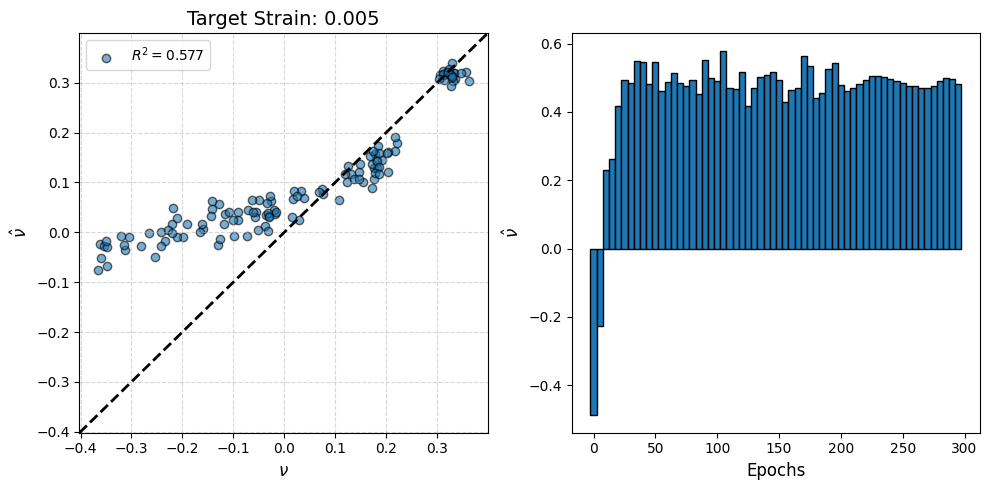

In [8]:
pred_pratios = {}
r2_scores = {}
mae_scores = {}
for epoch, predictor_model in models.items():
    predictor_model.eval()

    # Collect results here
    pred_pratios[epoch] = []
    gt_p_ratios = []
    with torch.no_grad():
        for input_graph, gt_p_ratio in eval_dataset:

            normalized_pred = predictor_model(input_graph, is_training=False)
            physical_pred = predictor_model.output_normalizer.inverse(normalized_pred)

            pred_pratios[epoch].append(physical_pred.item())
            gt_p_ratios.append(gt_p_ratio)

    r2 = r2_score(gt_p_ratios, pred_pratios[epoch])
    mae = mean_absolute_error(gt_p_ratios, pred_pratios[epoch])

    r2_scores[epoch] = r2
    mae_scores[epoch] = mae

# find best model
best_r2 = float("-inf")
best_epoch = 0
for epoch, r2 in r2_scores.items():
    if r2 > best_r2:
        best_r2 = r2
        best_epoch = epoch

print(f"Best R2:    {best_r2:.3f}")
print(f"Best epoch: {best_epoch}")
best_model = models[epoch]

# --- Plotting ---
fig, ax  = plt.subplots(1, 2, figsize=(10, 5), layout='tight')

# Scatter plot of predictions vs ground truth
gt_pratios = np.array([p for g, p in eval_dataset ])
best_pratios = pred_pratios[best_epoch]
ax[0].scatter(gt_pratios, best_pratios, alpha=0.6, edgecolors='k', label=f'$R^2 = {r2_score(gt_pratios, best_pratios):.3f}$')

# Plot the ideal y=x diagonal line
min_val = min(np.min(gt_pratios), np.min(best_pratios))
max_val = max(np.max(gt_pratios), np.max(best_pratios))

# Add a little padding to the line
padding = (max_val - min_val) * 0.05
lims = [min_val - padding, max_val + padding]

ax[0].plot(lims, lims, linestyle='--', color='black', lw=2)

# Formatting the plot
ax[0].set_title(f"Target Strain: {target_strain}", fontsize=14)
ax[0].set_xlabel(r"$\nu$", fontsize=12)
ax[0].set_ylabel(r"$\hat{\nu}$", fontsize=12)
ax[0].set_xlim(lims)
ax[0].set_ylim(lims)
ax[0].grid(True, linestyle='--', alpha=0.5)
ax[0].legend()

epochs = []
values = []
for epoch, value in r2_scores.items():
    epochs.append(epoch)
    values.append(value)
ax[1].bar(epochs, values, width=5, ec='black')
ax[1].set_ylabel(r"$\hat{\nu}$", fontsize=12)
ax[1].set_xlabel("Epochs", fontsize=12)

plt.show()

Initial Poisson's ratio at 0.005 strain: 0.3224937319755554.
Epoch:   0 | p loss: 4.032e-01 | dist loss: 0.000e+00 | angle loss: 2.341e-22 | rmsd: 0.000 | rmsd loss: 0.000 | curr p: 0.335


/tmp/ipykernel_48090/3231430693.py:130: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  p_loss = torch.nn.functional.mse_loss(pred_pratio, p_target)


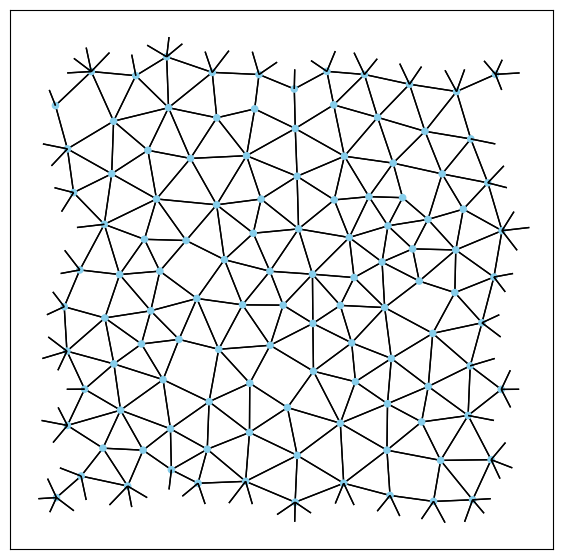

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

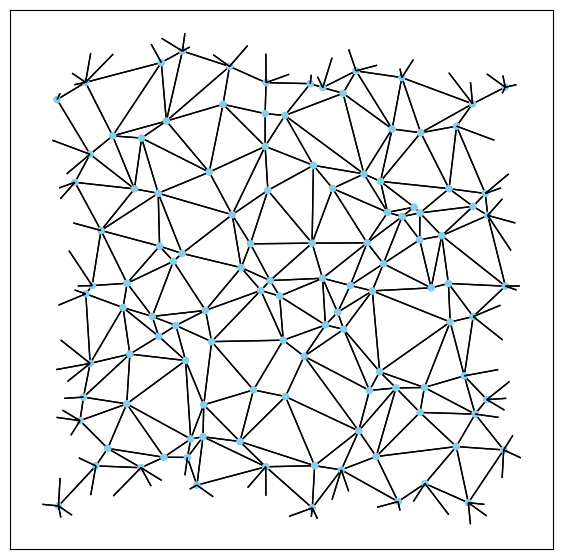

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.413e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.082e-04 | angle loss: 8.589e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.793e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.902e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.914e-05 | angle loss: 1.252e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.205e-05 | angle loss: 2.708e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.084e-04 | rmsd: 0.265 | rmsd loss: 0.000

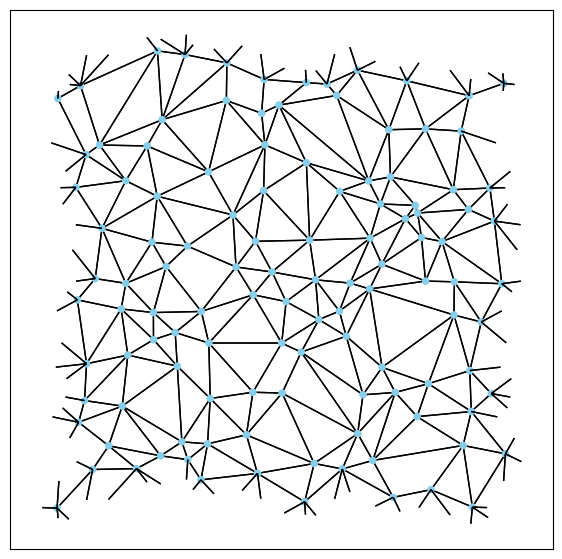

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.173e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.843e-02 | dist loss: 2.877e-05 | angle loss: 7.618e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.272e-04 | angle loss: 3.046e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.189e-02 | dist loss: 1.150e-03 | angle loss: 4.146e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.637e-02 | dist loss: 5.630e-03 | angle loss: 2.911e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.305e-02 | dist loss: 7.006e-03 | angle loss: 8.307e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.150e-02 | dist loss: 3.851e-03 | angle loss: 2.694e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.210e-02 | dist loss: 2.401e-03 | angle loss: 1.113e-03 | rmsd: 0.243 | rmsd loss:

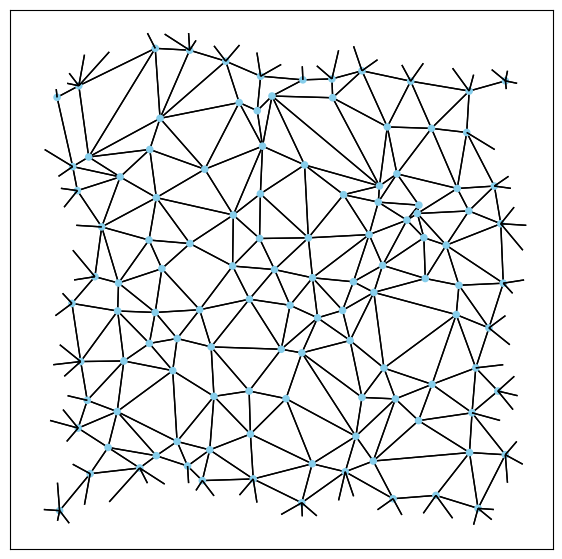

Epoch:  31 | p loss: 6.161e-02 | dist loss: 5.720e-03 | angle loss: 1.001e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.725e-02 | dist loss: 1.010e-02 | angle loss: 3.008e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.588e-02 | dist loss: 8.268e-03 | angle loss: 1.058e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.859e-02 | dist loss: 3.020e-03 | angle loss: 4.250e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.116e-02 | dist loss: 8.690e-04 | angle loss: 1.571e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.816e-02 | dist loss: 1.364e-03 | angle loss: 4.769e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.106e-02 | dist loss: 4.691e-03 | angle loss: 3.981e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.532e-02 | dist loss: 9.690e-03 | angle loss: 4.132e-04 | rmsd: 0.266 | rmsd loss:

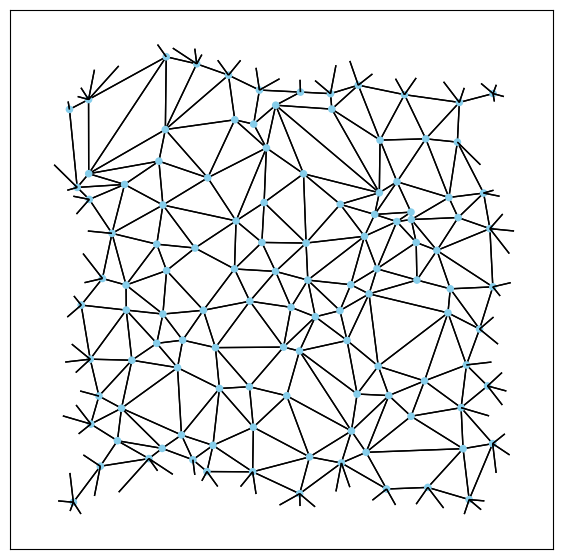

Epoch:  41 | p loss: 4.644e-02 | dist loss: 2.816e-03 | angle loss: 8.252e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.084
Epoch:  42 | p loss: 4.508e-02 | dist loss: 2.494e-03 | angle loss: 3.286e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.088
Epoch:  43 | p loss: 4.105e-02 | dist loss: 4.386e-03 | angle loss: 1.517e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.097
Epoch:  44 | p loss: 3.467e-02 | dist loss: 9.548e-03 | angle loss: 9.388e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  45 | p loss: 3.171e-02 | dist loss: 1.335e-02 | angle loss: 4.427e-04 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.122
Epoch:  46 | p loss: 3.168e-02 | dist loss: 1.090e-02 | angle loss: 5.554e-01 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.122
Epoch:  47 | p loss: 3.300e-02 | dist loss: 8.870e-03 | angle loss: 2.710e-04 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: -0.118
Epoch:  48 | p loss: 3.647e-02 | dist loss: 5.485e-03 | angle loss: 2.525e-04 | rmsd: 0.290 | rmsd loss:

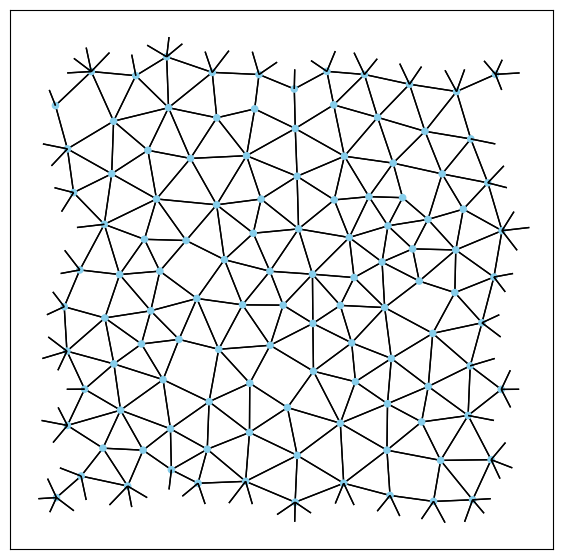

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

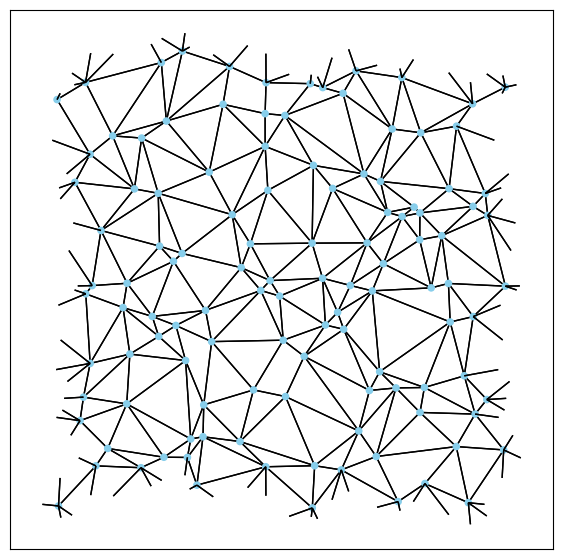

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.085e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.793e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.907e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.917e-05 | angle loss: 1.252e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.211e-05 | angle loss: 2.709e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.082e-04 | rmsd: 0.265 | rmsd loss: 0.000

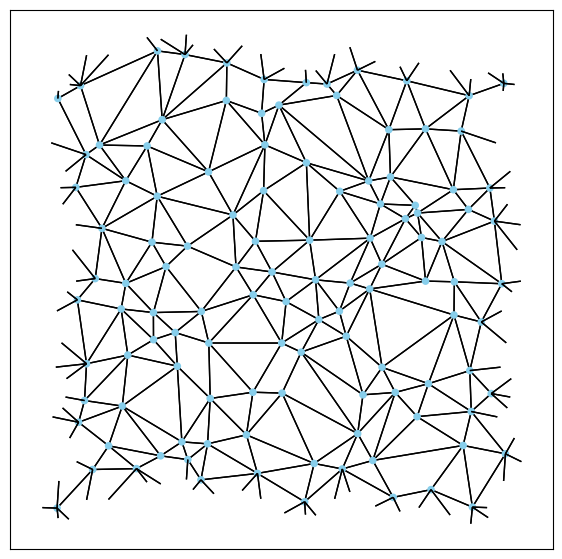

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.179e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.842e-02 | dist loss: 2.931e-05 | angle loss: 7.653e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.216e-04 | angle loss: 3.020e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.188e-02 | dist loss: 1.150e-03 | angle loss: 4.177e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.635e-02 | dist loss: 5.630e-03 | angle loss: 2.950e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.302e-02 | dist loss: 7.006e-03 | angle loss: 8.407e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.146e-02 | dist loss: 3.851e-03 | angle loss: 2.761e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.208e-02 | dist loss: 2.391e-03 | angle loss: 1.129e-03 | rmsd: 0.243 | rmsd loss:

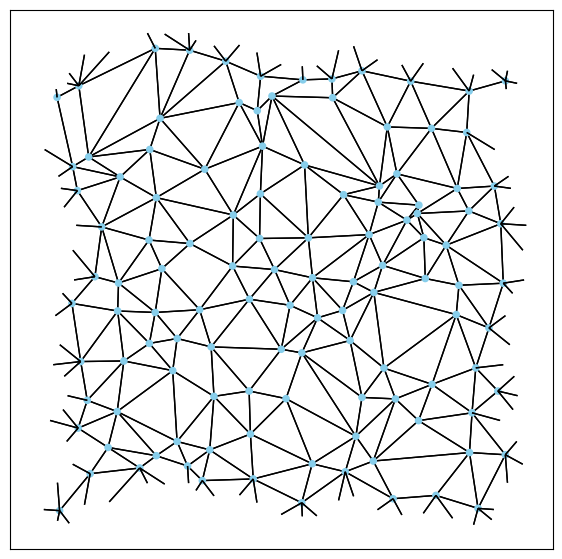

Epoch:  31 | p loss: 6.164e-02 | dist loss: 5.717e-03 | angle loss: 1.019e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.728e-02 | dist loss: 1.010e-02 | angle loss: 3.126e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.588e-02 | dist loss: 8.432e-03 | angle loss: 9.392e-05 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.846e-02 | dist loss: 3.166e-03 | angle loss: 3.688e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.091e-02 | dist loss: 9.491e-04 | angle loss: 1.652e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.800e-02 | dist loss: 1.445e-03 | angle loss: 4.717e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.106e-02 | dist loss: 4.792e-03 | angle loss: 3.781e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.543e-02 | dist loss: 9.743e-03 | angle loss: 3.963e-04 | rmsd: 0.266 | rmsd loss:

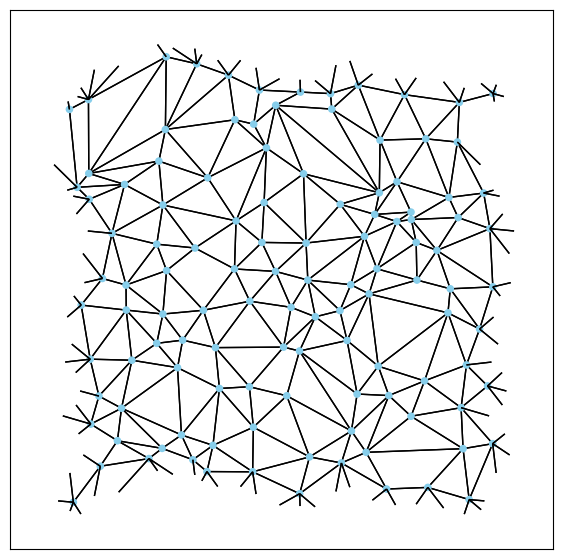

Epoch:  41 | p loss: 4.686e-02 | dist loss: 2.722e-03 | angle loss: 7.384e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.084
Epoch:  42 | p loss: 4.538e-02 | dist loss: 2.423e-03 | angle loss: 2.886e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.087
Epoch:  43 | p loss: 4.087e-02 | dist loss: 4.469e-03 | angle loss: 1.526e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.098
Epoch:  44 | p loss: 3.427e-02 | dist loss: 9.834e-03 | angle loss: 8.856e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.115
Epoch:  45 | p loss: 3.123e-02 | dist loss: 1.378e-02 | angle loss: 4.252e-04 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.123
Epoch:  46 | p loss: 3.106e-02 | dist loss: 1.123e-02 | angle loss: 5.787e-01 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.124
Epoch:  47 | p loss: 3.233e-02 | dist loss: 9.116e-03 | angle loss: 2.306e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.120
Epoch:  48 | p loss: 3.586e-02 | dist loss: 5.569e-03 | angle loss: 4.517e-04 | rmsd: 0.291 | rmsd loss:

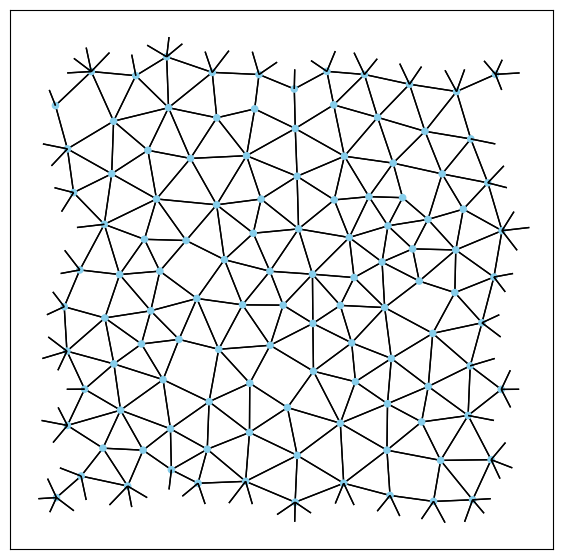

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

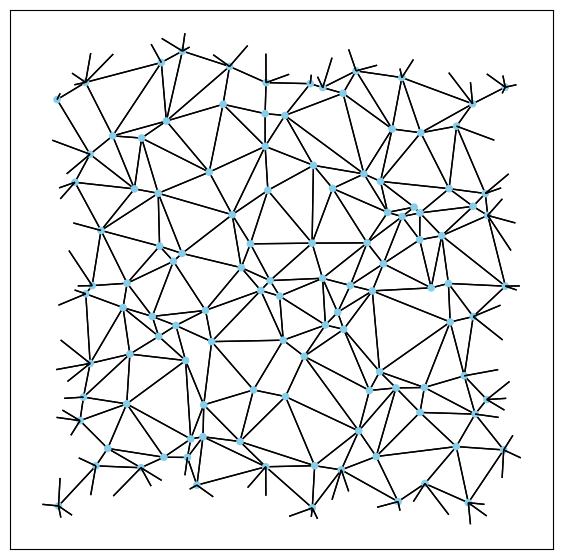

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.085e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.793e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.907e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.919e-05 | angle loss: 1.253e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.207e-05 | angle loss: 2.710e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.089e-04 | rmsd: 0.265 | rmsd loss: 0.000

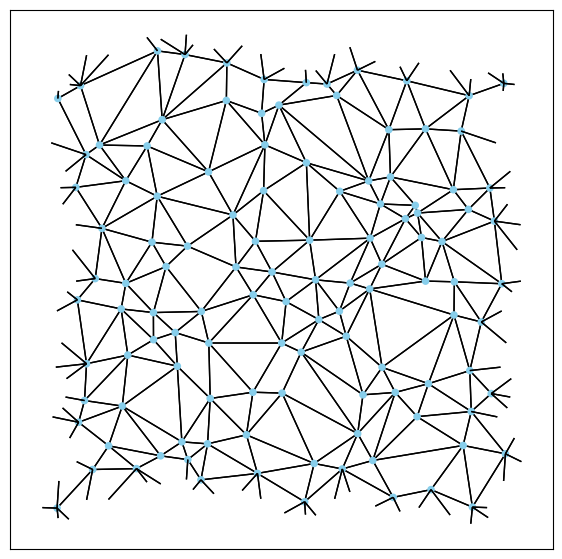

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.171e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.843e-02 | dist loss: 2.817e-05 | angle loss: 7.606e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.321e-04 | angle loss: 3.079e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.190e-02 | dist loss: 1.150e-03 | angle loss: 4.121e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.639e-02 | dist loss: 5.631e-03 | angle loss: 2.874e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.308e-02 | dist loss: 7.007e-03 | angle loss: 8.205e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.152e-02 | dist loss: 3.853e-03 | angle loss: 2.629e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.213e-02 | dist loss: 2.391e-03 | angle loss: 1.093e-03 | rmsd: 0.243 | rmsd loss:

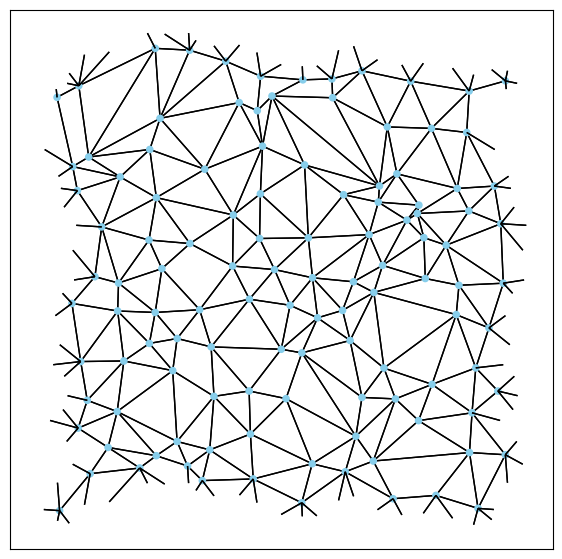

Epoch:  31 | p loss: 6.152e-02 | dist loss: 5.774e-03 | angle loss: 1.023e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.722e-02 | dist loss: 1.008e-02 | angle loss: 3.107e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.582e-02 | dist loss: 8.316e-03 | angle loss: 1.178e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.850e-02 | dist loss: 3.065e-03 | angle loss: 4.635e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.110e-02 | dist loss: 8.927e-04 | angle loss: 1.463e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.808e-02 | dist loss: 1.390e-03 | angle loss: 4.777e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.094e-02 | dist loss: 4.730e-03 | angle loss: 3.893e-04 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.518e-02 | dist loss: 9.717e-03 | angle loss: 4.201e-04 | rmsd: 0.266 | rmsd loss:

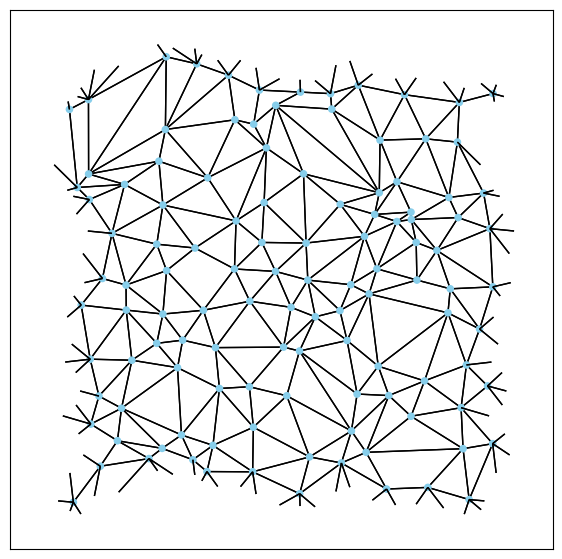

Epoch:  41 | p loss: 4.624e-02 | dist loss: 2.760e-03 | angle loss: 1.063e-03 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.085
Epoch:  42 | p loss: 4.510e-02 | dist loss: 2.420e-03 | angle loss: 3.087e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.088
Epoch:  43 | p loss: 4.106e-02 | dist loss: 4.287e-03 | angle loss: 1.471e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.097
Epoch:  44 | p loss: 3.485e-02 | dist loss: 9.018e-03 | angle loss: 9.228e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.113
Epoch:  45 | p loss: 3.188e-02 | dist loss: 1.230e-02 | angle loss: 8.557e-04 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.121
Epoch:  46 | p loss: 3.255e-02 | dist loss: 9.844e-03 | angle loss: 4.567e-04 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.120
Epoch:  47 | p loss: 3.564e-02 | dist loss: 5.965e-03 | angle loss: 1.869e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.111
Epoch:  48 | p loss: 3.651e-02 | dist loss: 4.824e-03 | angle loss: 3.100e-04 | rmsd: 0.291 | rmsd loss:

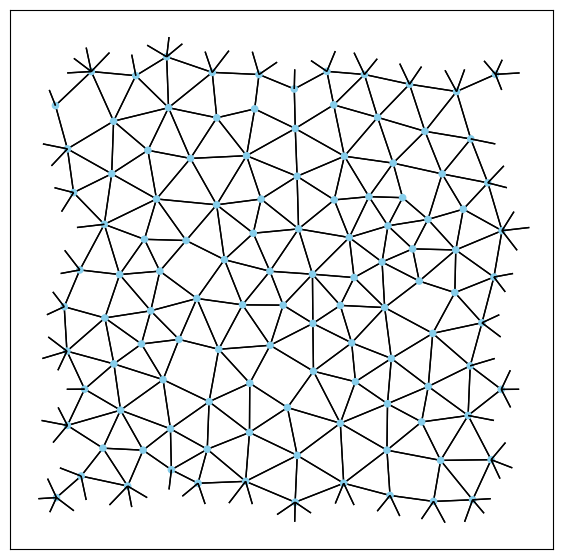

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.626e-01 | rmsd: 0.253 | rmsd loss: 0.000 

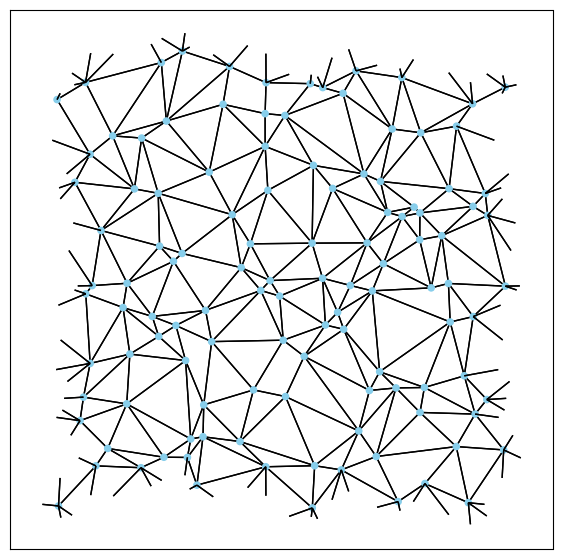

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.075e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.797e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.368e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.986e-02 | dist loss: 3.896e-03 | angle loss: 3.522e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.906e-05 | angle loss: 1.253e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.203e-05 | angle loss: 2.708e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.403e-03 | angle loss: 3.073e-04 | rmsd: 0.265 | rmsd loss: 0.000

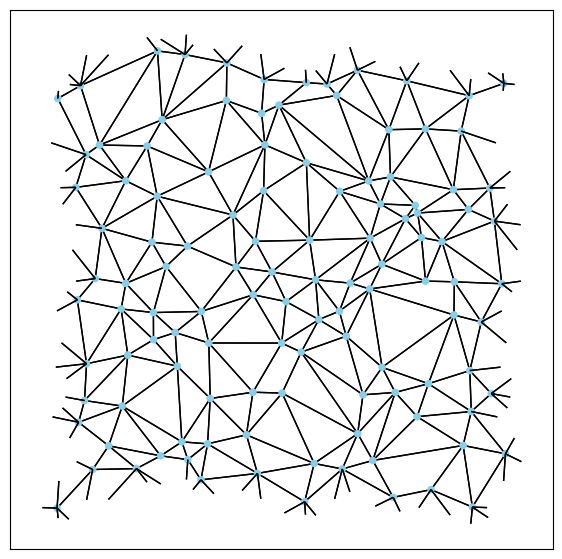

Epoch:  21 | p loss: 8.659e-02 | dist loss: 1.508e-03 | angle loss: 2.202e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.841e-02 | dist loss: 3.153e-05 | angle loss: 7.782e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.007e-04 | angle loss: 2.922e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.185e-02 | dist loss: 1.150e-03 | angle loss: 4.290e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.629e-02 | dist loss: 5.628e-03 | angle loss: 3.098e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.293e-02 | dist loss: 7.003e-03 | angle loss: 8.806e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.136e-02 | dist loss: 3.848e-03 | angle loss: 3.028e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.198e-02 | dist loss: 2.407e-03 | angle loss: 1.172e-03 | rmsd: 0.243 | rmsd loss:

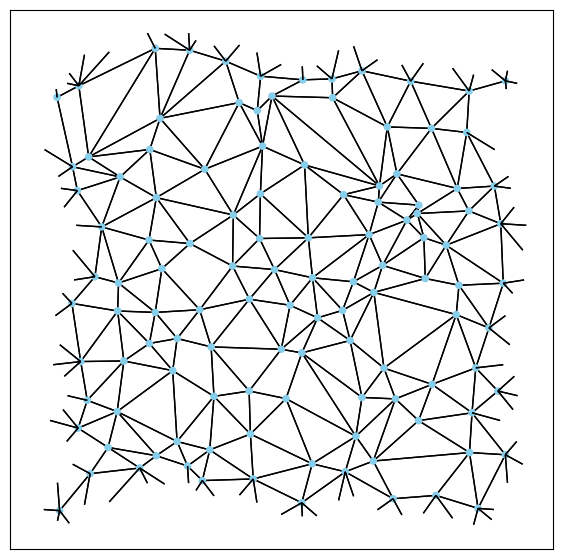

Epoch:  31 | p loss: 6.164e-02 | dist loss: 5.759e-03 | angle loss: 1.007e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.734e-02 | dist loss: 1.019e-02 | angle loss: 3.040e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.601e-02 | dist loss: 8.376e-03 | angle loss: 7.125e-05 | rmsd: 0.253 | rmsd loss: 0.000 | curr p: -0.063
Epoch:  34 | p loss: 5.868e-02 | dist loss: 3.076e-03 | angle loss: 2.508e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.110e-02 | dist loss: 8.908e-04 | angle loss: 1.712e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.816e-02 | dist loss: 1.371e-03 | angle loss: 5.308e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.116e-02 | dist loss: 4.668e-03 | angle loss: 3.917e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.550e-02 | dist loss: 9.561e-03 | angle loss: 3.873e-04 | rmsd: 0.266 | rmsd loss:

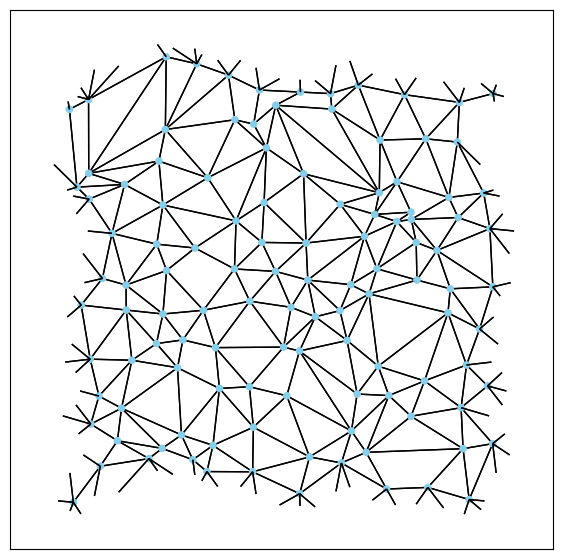

Epoch:  41 | p loss: 4.442e-02 | dist loss: 4.103e-03 | angle loss: 7.638e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.089
Epoch:  42 | p loss: 4.256e-02 | dist loss: 4.059e-03 | angle loss: 2.657e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.094
Epoch:  43 | p loss: 3.768e-02 | dist loss: 6.704e-03 | angle loss: 1.579e-03 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: -0.106
Epoch:  44 | p loss: 3.526e-02 | dist loss: 8.539e-03 | angle loss: 8.865e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.112
Epoch:  45 | p loss: 3.424e-02 | dist loss: 8.407e-03 | angle loss: 4.026e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: -0.115
Epoch:  46 | p loss: 3.510e-02 | dist loss: 6.467e-03 | angle loss: 3.271e-01 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.113
Epoch:  47 | p loss: 3.706e-02 | dist loss: 4.932e-03 | angle loss: 2.475e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.107
Epoch:  48 | p loss: 3.588e-02 | dist loss: 5.522e-03 | angle loss: 4.643e-04 | rmsd: 0.290 | rmsd loss:

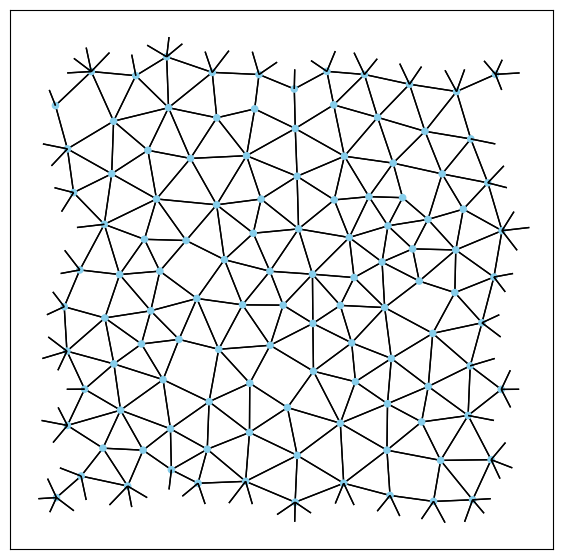

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

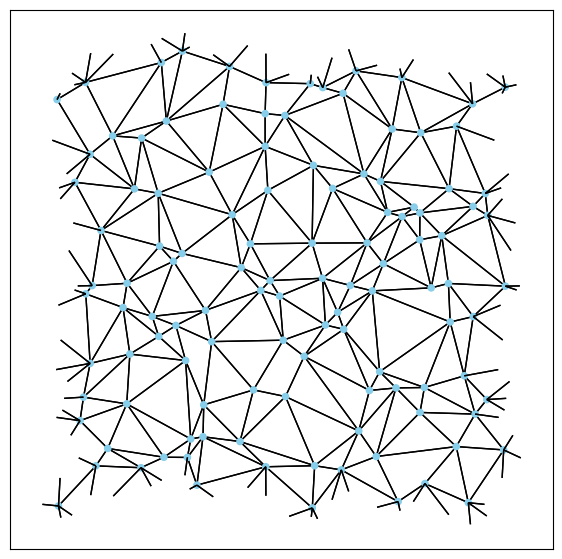

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.085e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.792e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.906e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.919e-05 | angle loss: 1.252e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.213e-05 | angle loss: 2.709e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.080e-04 | rmsd: 0.265 | rmsd loss: 0.000

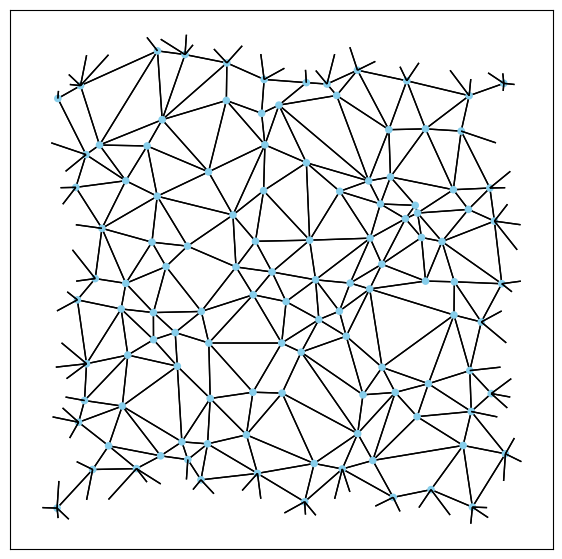

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.184e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.842e-02 | dist loss: 2.973e-05 | angle loss: 7.679e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.173e-04 | angle loss: 2.999e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.187e-02 | dist loss: 1.150e-03 | angle loss: 4.200e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.634e-02 | dist loss: 5.630e-03 | angle loss: 2.980e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.300e-02 | dist loss: 7.006e-03 | angle loss: 8.491e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.144e-02 | dist loss: 3.851e-03 | angle loss: 2.814e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.206e-02 | dist loss: 2.391e-03 | angle loss: 1.141e-03 | rmsd: 0.243 | rmsd loss:

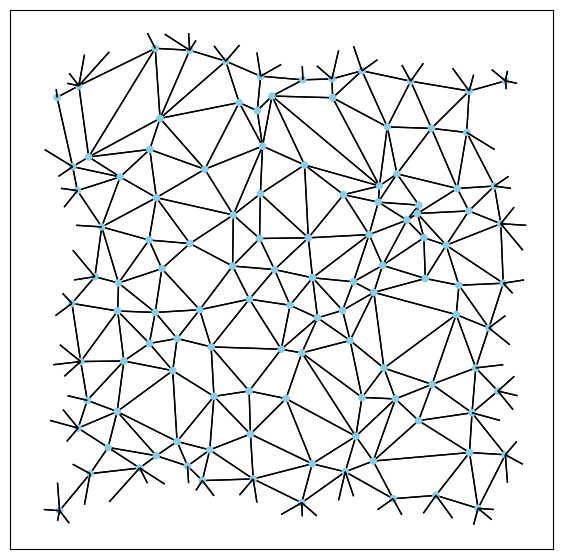

Epoch:  31 | p loss: 6.165e-02 | dist loss: 5.716e-03 | angle loss: 1.021e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.731e-02 | dist loss: 1.010e-02 | angle loss: 3.137e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.591e-02 | dist loss: 8.451e-03 | angle loss: 8.685e-05 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.848e-02 | dist loss: 3.184e-03 | angle loss: 3.343e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.088e-02 | dist loss: 9.593e-04 | angle loss: 1.699e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.799e-02 | dist loss: 1.456e-03 | angle loss: 4.732e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.105e-02 | dist loss: 4.806e-03 | angle loss: 3.643e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.543e-02 | dist loss: 9.752e-03 | angle loss: 3.845e-04 | rmsd: 0.266 | rmsd loss:

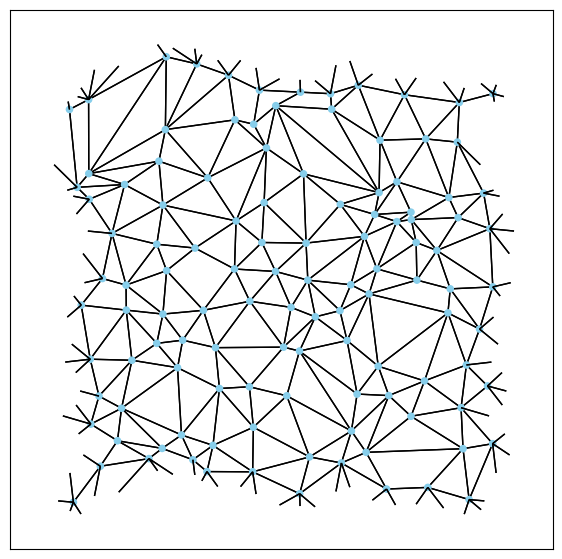

Epoch:  41 | p loss: 4.681e-02 | dist loss: 2.619e-03 | angle loss: 9.243e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.084
Epoch:  42 | p loss: 4.565e-02 | dist loss: 2.253e-03 | angle loss: 3.164e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.086
Epoch:  43 | p loss: 4.149e-02 | dist loss: 4.089e-03 | angle loss: 1.942e-03 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: -0.096
Epoch:  44 | p loss: 3.511e-02 | dist loss: 8.826e-03 | angle loss: 1.190e-03 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.113
Epoch:  45 | p loss: 3.204e-02 | dist loss: 1.223e-02 | angle loss: 4.050e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: -0.121
Epoch:  46 | p loss: 3.214e-02 | dist loss: 9.922e-03 | angle loss: 8.587e-01 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: -0.121
Epoch:  47 | p loss: 3.333e-02 | dist loss: 8.012e-03 | angle loss: 2.644e-04 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: -0.117
Epoch:  48 | p loss: 3.688e-02 | dist loss: 4.980e-03 | angle loss: 4.342e-04 | rmsd: 0.289 | rmsd loss:

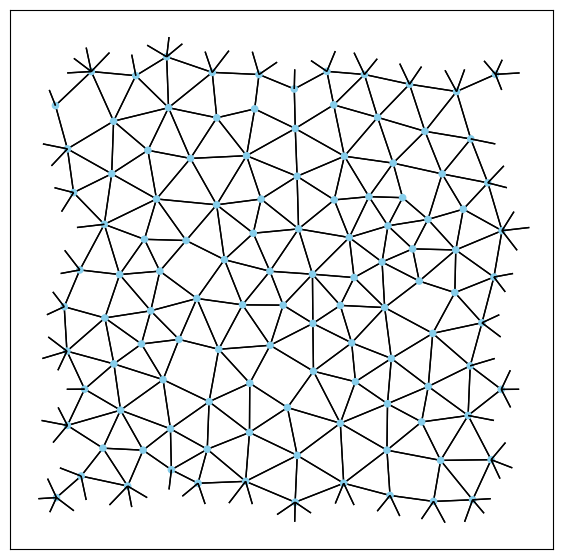

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

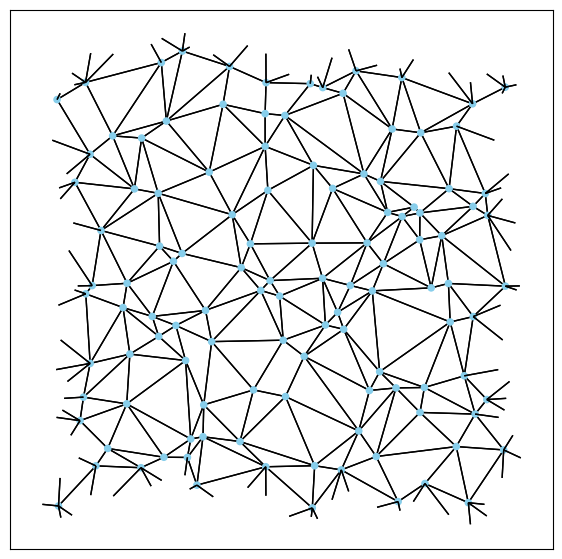

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.085e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.793e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.907e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.918e-05 | angle loss: 1.253e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.206e-05 | angle loss: 2.710e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.090e-04 | rmsd: 0.265 | rmsd loss: 0.000

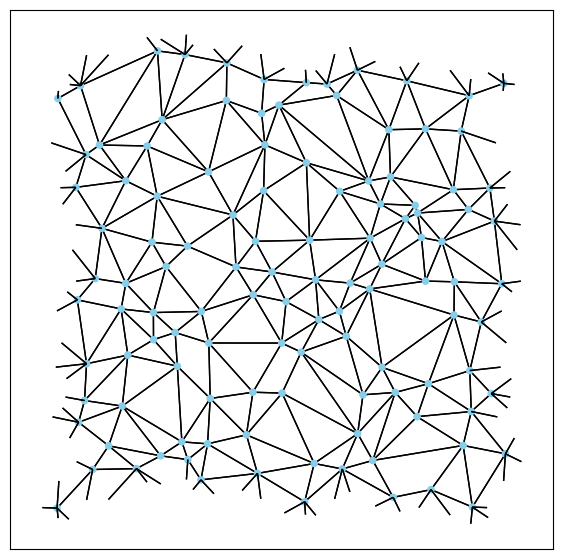

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.168e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.843e-02 | dist loss: 2.791e-05 | angle loss: 7.590e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.348e-04 | angle loss: 3.092e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.190e-02 | dist loss: 1.151e-03 | angle loss: 4.107e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.640e-02 | dist loss: 5.631e-03 | angle loss: 2.858e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.309e-02 | dist loss: 7.008e-03 | angle loss: 8.164e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.154e-02 | dist loss: 3.853e-03 | angle loss: 2.601e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.214e-02 | dist loss: 2.390e-03 | angle loss: 1.083e-03 | rmsd: 0.243 | rmsd loss:

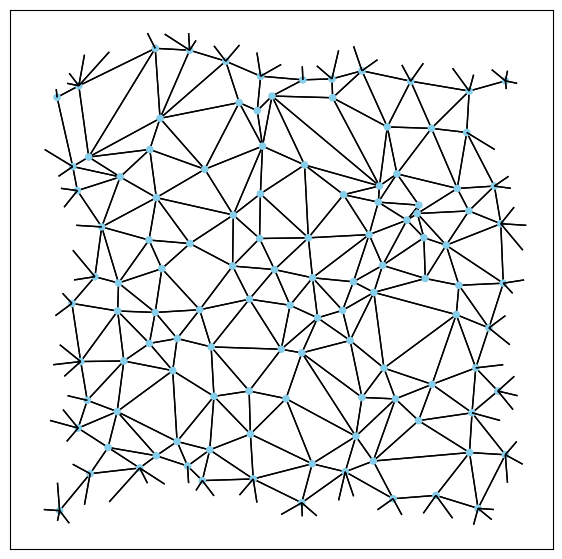

Epoch:  31 | p loss: 6.151e-02 | dist loss: 5.775e-03 | angle loss: 1.024e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.720e-02 | dist loss: 1.008e-02 | angle loss: 3.105e-03 | rmsd: 0.252 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.580e-02 | dist loss: 8.307e-03 | angle loss: 1.244e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.849e-02 | dist loss: 3.058e-03 | angle loss: 4.834e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.111e-02 | dist loss: 8.883e-04 | angle loss: 1.422e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.808e-02 | dist loss: 1.385e-03 | angle loss: 4.758e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.091e-02 | dist loss: 4.722e-03 | angle loss: 3.936e-04 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.513e-02 | dist loss: 9.709e-03 | angle loss: 4.260e-04 | rmsd: 0.266 | rmsd loss:

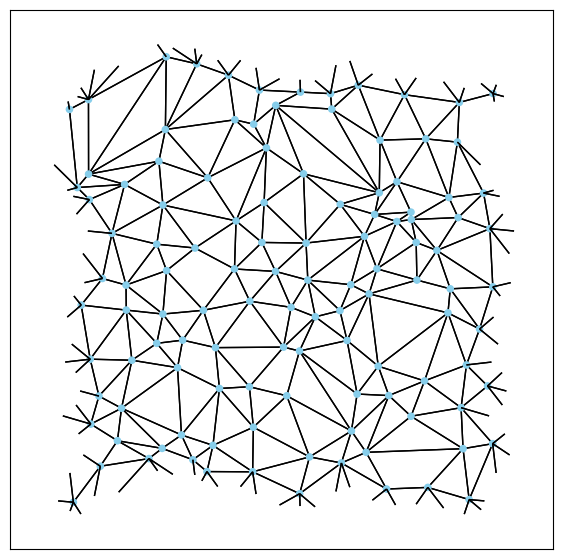

Epoch:  41 | p loss: 4.615e-02 | dist loss: 2.756e-03 | angle loss: 1.182e-03 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.085
Epoch:  42 | p loss: 4.511e-02 | dist loss: 2.408e-03 | angle loss: 2.794e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.088
Epoch:  43 | p loss: 4.096e-02 | dist loss: 4.271e-03 | angle loss: 1.510e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.098
Epoch:  44 | p loss: 3.461e-02 | dist loss: 8.979e-03 | angle loss: 9.388e-04 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  45 | p loss: 3.152e-02 | dist loss: 1.221e-02 | angle loss: 2.128e-03 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.122
Epoch:  46 | p loss: 3.197e-02 | dist loss: 1.067e-02 | angle loss: 2.320e-04 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.121
Epoch:  47 | p loss: 3.442e-02 | dist loss: 7.045e-03 | angle loss: 5.536e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  48 | p loss: 3.582e-02 | dist loss: 5.676e-03 | angle loss: 5.579e-04 | rmsd: 0.290 | rmsd loss:

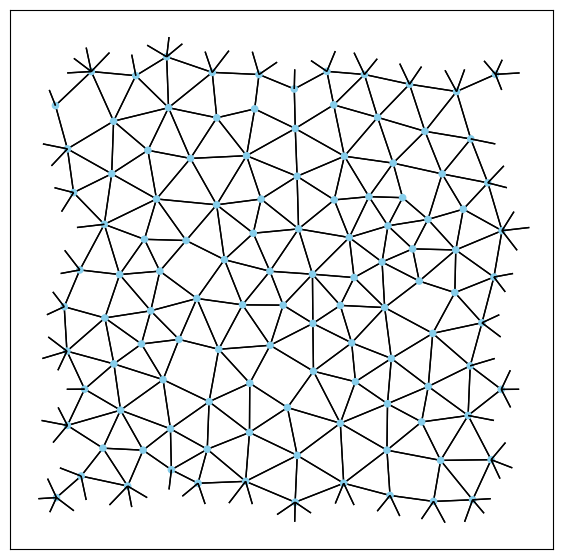

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

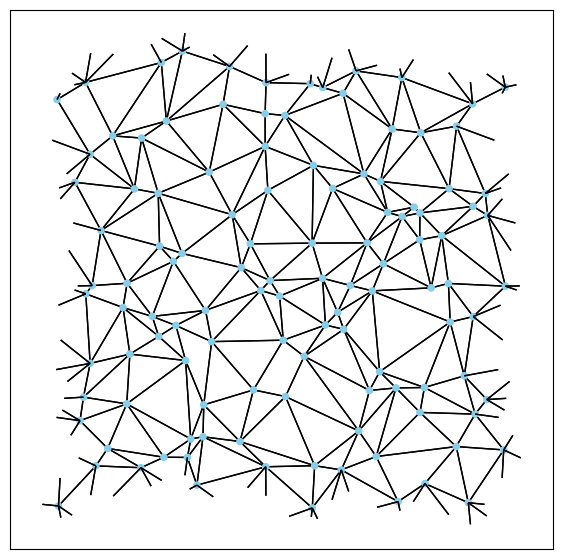

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.085e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.794e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.906e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.916e-05 | angle loss: 1.253e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.204e-05 | angle loss: 2.710e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.090e-04 | rmsd: 0.265 | rmsd loss: 0.000

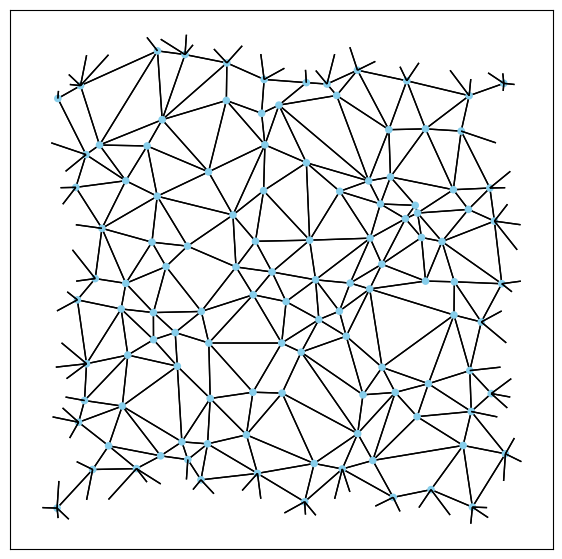

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.166e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.843e-02 | dist loss: 2.775e-05 | angle loss: 7.579e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.367e-04 | angle loss: 3.101e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.191e-02 | dist loss: 1.150e-03 | angle loss: 4.097e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.640e-02 | dist loss: 5.630e-03 | angle loss: 2.845e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.310e-02 | dist loss: 7.008e-03 | angle loss: 8.130e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.155e-02 | dist loss: 3.853e-03 | angle loss: 2.580e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.215e-02 | dist loss: 2.393e-03 | angle loss: 1.076e-03 | rmsd: 0.243 | rmsd loss:

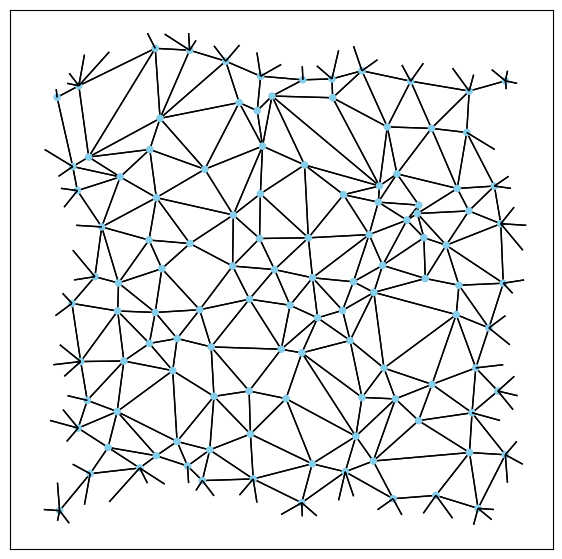

Epoch:  31 | p loss: 6.150e-02 | dist loss: 5.776e-03 | angle loss: 1.024e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.718e-02 | dist loss: 1.008e-02 | angle loss: 3.105e-03 | rmsd: 0.252 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.579e-02 | dist loss: 8.304e-03 | angle loss: 1.292e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.848e-02 | dist loss: 3.055e-03 | angle loss: 4.960e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.111e-02 | dist loss: 8.867e-04 | angle loss: 1.390e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.807e-02 | dist loss: 1.383e-03 | angle loss: 4.775e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.088e-02 | dist loss: 4.720e-03 | angle loss: 3.962e-04 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.509e-02 | dist loss: 9.706e-03 | angle loss: 4.311e-04 | rmsd: 0.266 | rmsd loss:

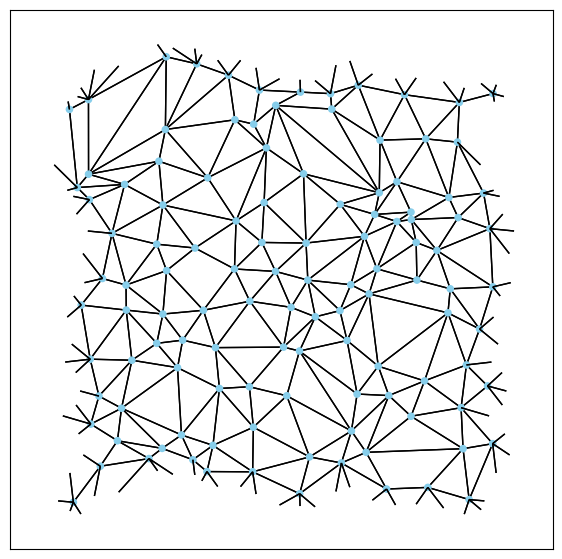

Epoch:  41 | p loss: 4.609e-02 | dist loss: 2.751e-03 | angle loss: 1.298e-03 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: -0.085
Epoch:  42 | p loss: 4.515e-02 | dist loss: 2.400e-03 | angle loss: 2.553e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.088
Epoch:  43 | p loss: 4.093e-02 | dist loss: 4.259e-03 | angle loss: 1.514e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.098
Epoch:  44 | p loss: 3.450e-02 | dist loss: 8.959e-03 | angle loss: 9.439e-04 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  45 | p loss: 3.133e-02 | dist loss: 1.218e-02 | angle loss: 2.418e-03 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.123
Epoch:  46 | p loss: 3.136e-02 | dist loss: 1.127e-02 | angle loss: 2.996e-04 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.123
Epoch:  47 | p loss: 3.546e-02 | dist loss: 6.140e-03 | angle loss: 8.580e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.112
Epoch:  48 | p loss: 3.783e-02 | dist loss: 4.222e-03 | angle loss: 5.385e-04 | rmsd: 0.291 | rmsd loss:

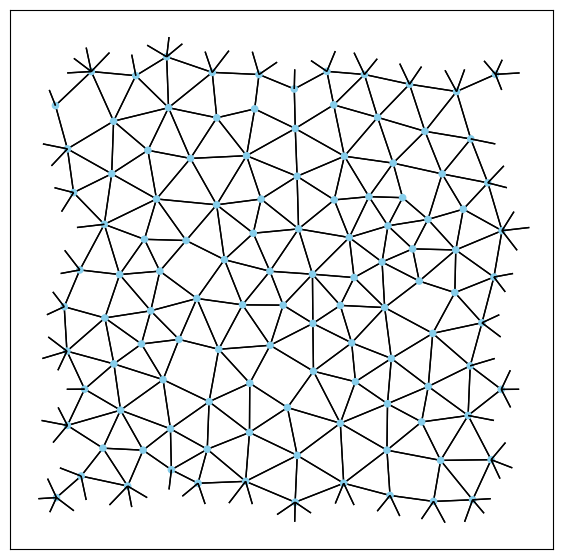

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

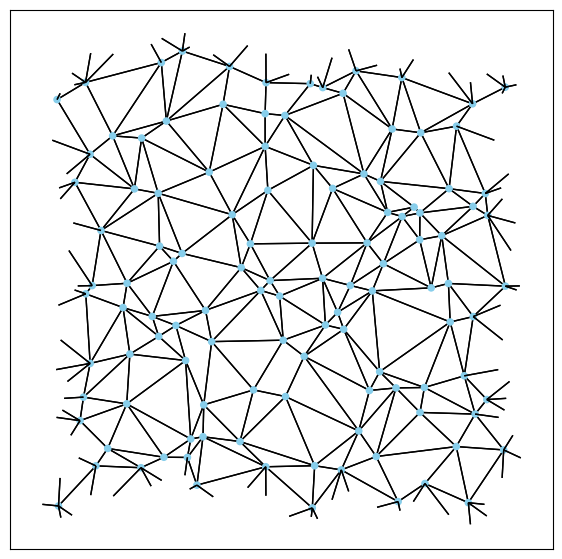

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.085e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.794e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.906e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.916e-05 | angle loss: 1.253e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.205e-05 | angle loss: 2.710e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.091e-04 | rmsd: 0.265 | rmsd loss: 0.000

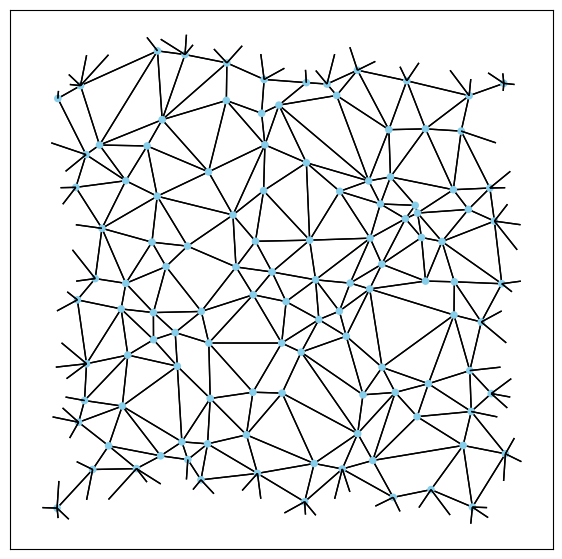

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.167e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.843e-02 | dist loss: 2.778e-05 | angle loss: 7.581e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.364e-04 | angle loss: 3.100e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.191e-02 | dist loss: 1.150e-03 | angle loss: 4.099e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.640e-02 | dist loss: 5.630e-03 | angle loss: 2.847e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.310e-02 | dist loss: 7.007e-03 | angle loss: 8.133e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.155e-02 | dist loss: 3.853e-03 | angle loss: 2.583e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.215e-02 | dist loss: 2.393e-03 | angle loss: 1.077e-03 | rmsd: 0.243 | rmsd loss:

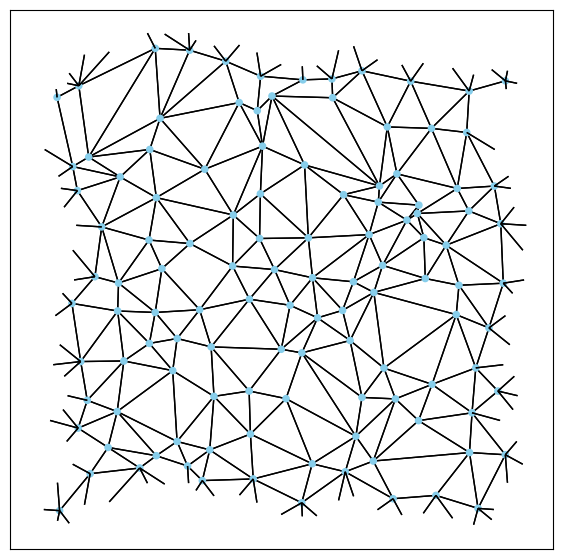

Epoch:  31 | p loss: 6.150e-02 | dist loss: 5.775e-03 | angle loss: 1.025e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.719e-02 | dist loss: 1.008e-02 | angle loss: 3.110e-03 | rmsd: 0.252 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.579e-02 | dist loss: 8.311e-03 | angle loss: 1.285e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.847e-02 | dist loss: 3.061e-03 | angle loss: 4.938e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.110e-02 | dist loss: 8.899e-04 | angle loss: 1.394e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.806e-02 | dist loss: 1.386e-03 | angle loss: 4.770e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.088e-02 | dist loss: 4.725e-03 | angle loss: 3.948e-04 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.509e-02 | dist loss: 9.709e-03 | angle loss: 4.295e-04 | rmsd: 0.266 | rmsd loss:

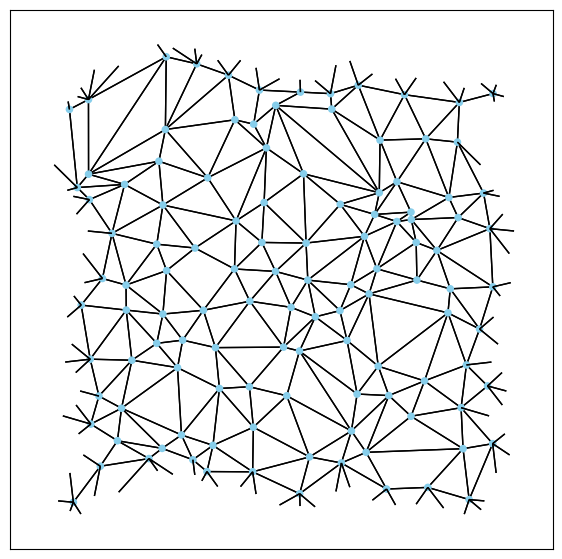

Epoch:  41 | p loss: 4.611e-02 | dist loss: 2.748e-03 | angle loss: 1.280e-03 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: -0.085
Epoch:  42 | p loss: 4.515e-02 | dist loss: 2.397e-03 | angle loss: 2.583e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.088
Epoch:  43 | p loss: 4.094e-02 | dist loss: 4.257e-03 | angle loss: 1.511e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.098
Epoch:  44 | p loss: 3.451e-02 | dist loss: 8.960e-03 | angle loss: 9.415e-04 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  45 | p loss: 3.135e-02 | dist loss: 1.219e-02 | angle loss: 2.367e-03 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.123
Epoch:  46 | p loss: 3.143e-02 | dist loss: 1.118e-02 | angle loss: 2.899e-04 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.123
Epoch:  47 | p loss: 3.342e-02 | dist loss: 7.727e-03 | angle loss: 8.044e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.117
Epoch:  48 | p loss: 3.485e-02 | dist loss: 6.328e-03 | angle loss: 5.960e-04 | rmsd: 0.291 | rmsd loss:

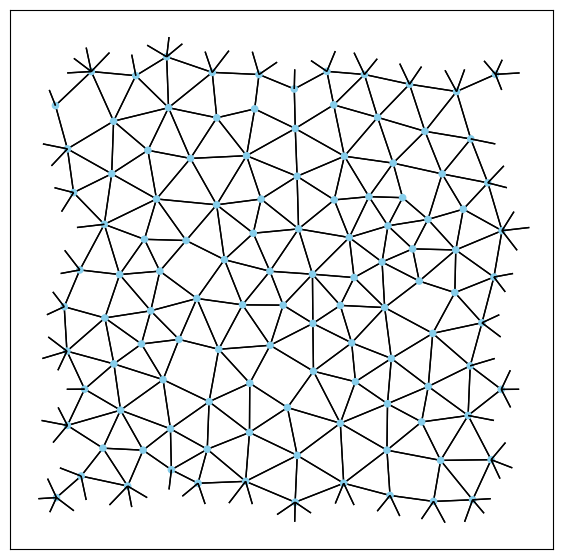

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.627e-01 | rmsd: 0.253 | rmsd loss: 0.000 

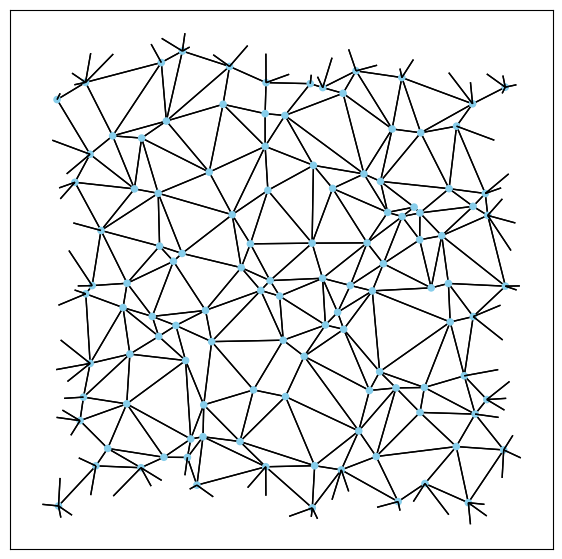

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.413e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.081e-04 | angle loss: 8.589e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.794e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.369e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.987e-02 | dist loss: 3.902e-03 | angle loss: 3.523e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.914e-05 | angle loss: 1.252e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.205e-05 | angle loss: 2.709e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.404e-03 | angle loss: 3.084e-04 | rmsd: 0.265 | rmsd loss: 0.000

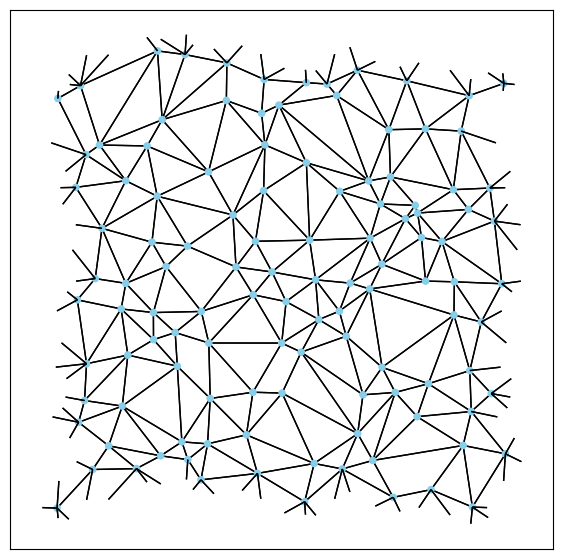

Epoch:  21 | p loss: 8.660e-02 | dist loss: 1.508e-03 | angle loss: 2.173e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.843e-02 | dist loss: 2.882e-05 | angle loss: 7.622e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.267e-04 | angle loss: 3.043e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.189e-02 | dist loss: 1.150e-03 | angle loss: 4.150e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.637e-02 | dist loss: 5.630e-03 | angle loss: 2.915e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.305e-02 | dist loss: 7.006e-03 | angle loss: 8.317e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.149e-02 | dist loss: 3.851e-03 | angle loss: 2.701e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.210e-02 | dist loss: 2.402e-03 | angle loss: 1.114e-03 | rmsd: 0.243 | rmsd loss:

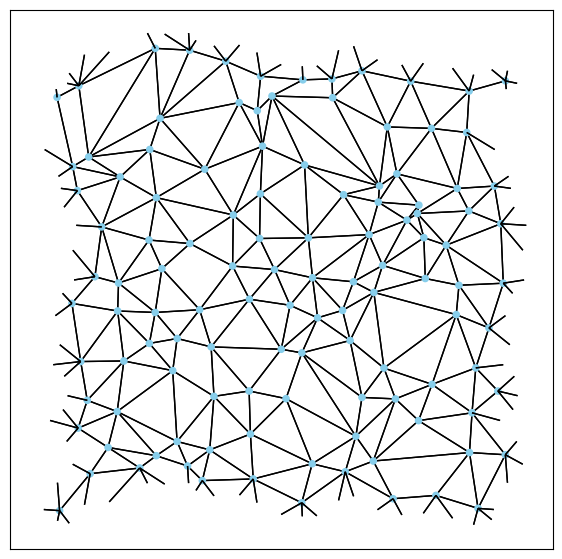

Epoch:  31 | p loss: 6.162e-02 | dist loss: 5.720e-03 | angle loss: 1.001e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.725e-02 | dist loss: 1.010e-02 | angle loss: 3.007e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.588e-02 | dist loss: 8.267e-03 | angle loss: 1.047e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: -0.064
Epoch:  34 | p loss: 5.859e-02 | dist loss: 3.019e-03 | angle loss: 4.208e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.116e-02 | dist loss: 8.689e-04 | angle loss: 1.580e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.816e-02 | dist loss: 1.364e-03 | angle loss: 4.765e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.107e-02 | dist loss: 4.691e-03 | angle loss: 3.979e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.533e-02 | dist loss: 9.691e-03 | angle loss: 4.123e-04 | rmsd: 0.266 | rmsd loss:

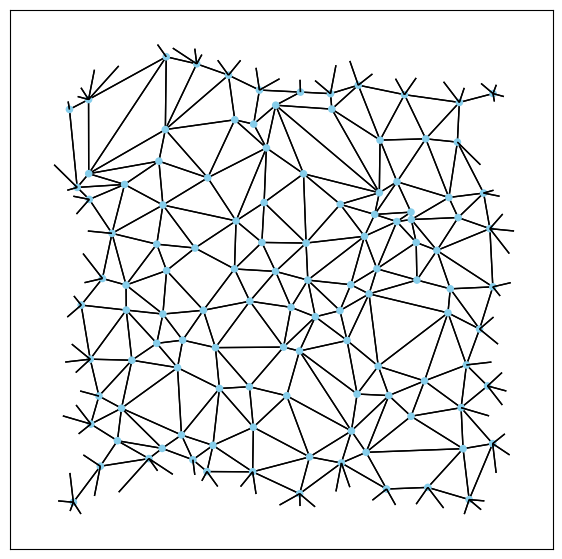

Epoch:  41 | p loss: 4.646e-02 | dist loss: 2.818e-03 | angle loss: 8.150e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.084
Epoch:  42 | p loss: 4.509e-02 | dist loss: 2.495e-03 | angle loss: 3.252e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.088
Epoch:  43 | p loss: 4.087e-02 | dist loss: 4.491e-03 | angle loss: 1.531e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: -0.098
Epoch:  44 | p loss: 3.446e-02 | dist loss: 9.795e-03 | angle loss: 9.440e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  45 | p loss: 3.153e-02 | dist loss: 1.367e-02 | angle loss: 4.423e-04 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: -0.122
Epoch:  46 | p loss: 3.150e-02 | dist loss: 1.108e-02 | angle loss: 6.010e-01 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.123
Epoch:  47 | p loss: 3.287e-02 | dist loss: 8.946e-03 | angle loss: 2.495e-04 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: -0.119
Epoch:  48 | p loss: 3.642e-02 | dist loss: 5.469e-03 | angle loss: 2.811e-04 | rmsd: 0.290 | rmsd loss:

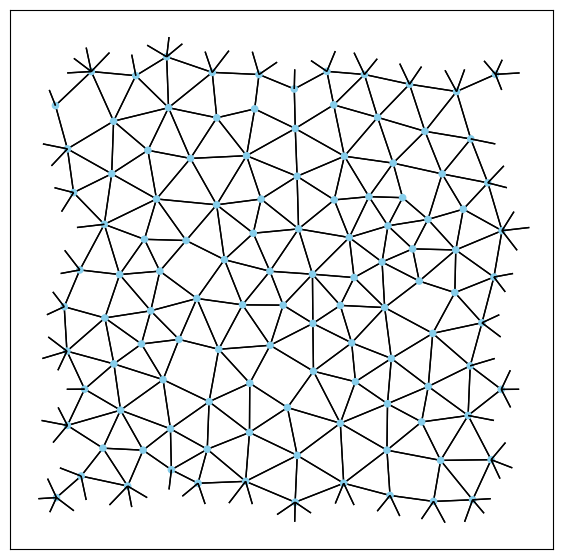

Epoch:   1 | p loss: 3.110e-01 | dist loss: 0.000e+00 | angle loss: 2.188e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.258
Epoch:   2 | p loss: 2.420e-01 | dist loss: 0.000e+00 | angle loss: 5.496e-15 | rmsd: 0.086 | rmsd loss: 0.000 | curr p: 0.192
Epoch:   3 | p loss: 2.295e-01 | dist loss: 0.000e+00 | angle loss: 6.403e-10 | rmsd: 0.120 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.086e-01 | dist loss: 0.000e+00 | angle loss: 4.681e-06 | rmsd: 0.151 | rmsd loss: 0.000 | curr p: 0.157
Epoch:   5 | p loss: 1.834e-01 | dist loss: 0.000e+00 | angle loss: 7.118e-02 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.128
Epoch:   6 | p loss: 1.674e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-02 | rmsd: 0.209 | rmsd loss: 0.000 | curr p: 0.109
Epoch:   7 | p loss: 1.514e-01 | dist loss: 3.592e-03 | angle loss: 3.626e-02 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.089
Epoch:   8 | p loss: 1.388e-01 | dist loss: 1.450e-02 | angle loss: 5.626e-01 | rmsd: 0.253 | rmsd loss: 0.000 

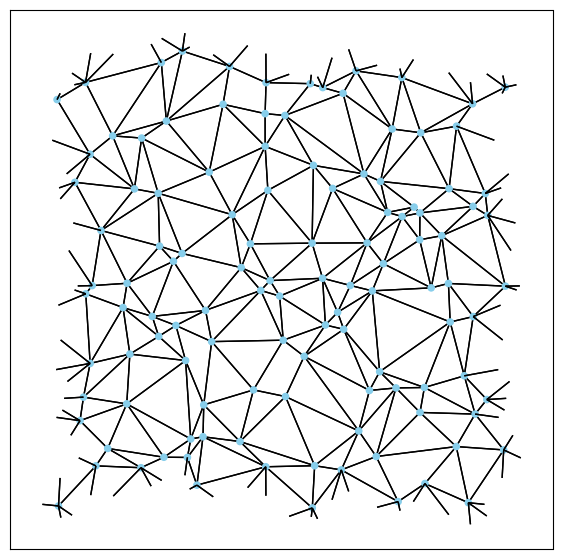

Epoch:  11 | p loss: 1.141e-01 | dist loss: 0.000e+00 | angle loss: 5.412e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.038
Epoch:  12 | p loss: 1.097e-01 | dist loss: 5.075e-04 | angle loss: 8.588e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.031
Epoch:  13 | p loss: 1.016e-01 | dist loss: 6.799e-04 | angle loss: 1.312e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.019
Epoch:  14 | p loss: 9.522e-02 | dist loss: 4.150e-03 | angle loss: 2.368e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.009
Epoch:  15 | p loss: 8.986e-02 | dist loss: 3.896e-03 | angle loss: 3.522e-03 | rmsd: 0.301 | rmsd loss: 0.009 | curr p: -0.000
Epoch:  16 | p loss: 9.342e-02 | dist loss: 1.903e-05 | angle loss: 1.253e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  17 | p loss: 9.348e-02 | dist loss: 2.200e-05 | angle loss: 2.708e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.006
Epoch:  18 | p loss: 8.975e-02 | dist loss: 1.403e-03 | angle loss: 3.073e-04 | rmsd: 0.265 | rmsd loss: 0.000

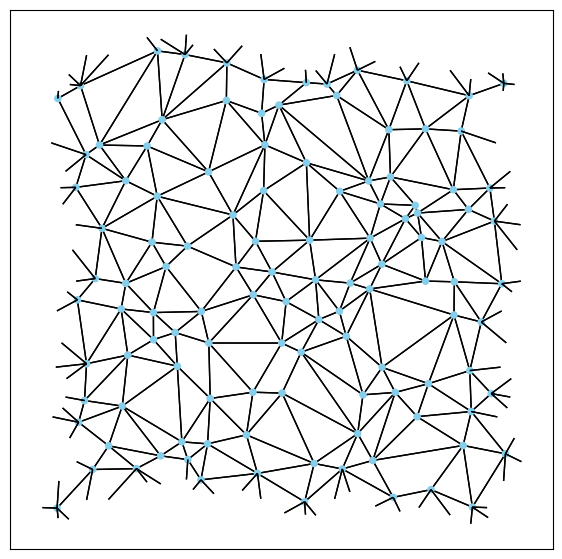

Epoch:  21 | p loss: 8.659e-02 | dist loss: 1.509e-03 | angle loss: 2.202e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: -0.006
Epoch:  22 | p loss: 8.841e-02 | dist loss: 3.154e-05 | angle loss: 7.781e-05 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: -0.003
Epoch:  23 | p loss: 8.707e-02 | dist loss: 4.009e-04 | angle loss: 2.923e-04 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.005
Epoch:  24 | p loss: 8.185e-02 | dist loss: 1.150e-03 | angle loss: 4.289e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.014
Epoch:  25 | p loss: 7.629e-02 | dist loss: 5.627e-03 | angle loss: 3.097e-05 | rmsd: 0.239 | rmsd loss: 0.000 | curr p: -0.024
Epoch:  26 | p loss: 7.293e-02 | dist loss: 7.003e-03 | angle loss: 8.799e-05 | rmsd: 0.240 | rmsd loss: 0.000 | curr p: -0.030
Epoch:  27 | p loss: 7.136e-02 | dist loss: 3.848e-03 | angle loss: 3.026e-04 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: -0.033
Epoch:  28 | p loss: 7.198e-02 | dist loss: 2.410e-03 | angle loss: 1.172e-03 | rmsd: 0.243 | rmsd loss:

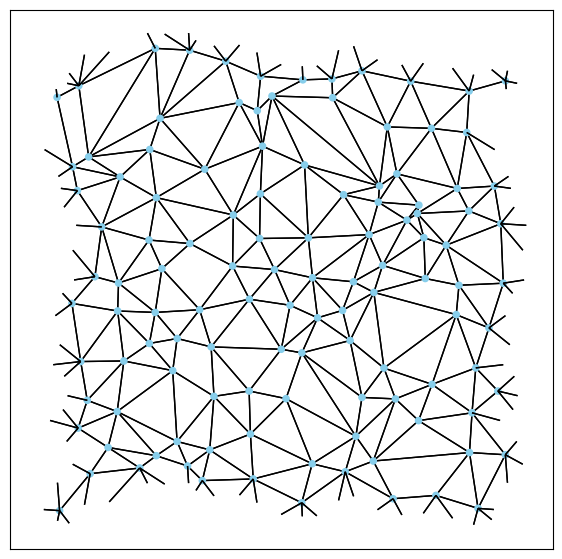

Epoch:  31 | p loss: 6.164e-02 | dist loss: 5.759e-03 | angle loss: 1.006e-03 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: -0.052
Epoch:  32 | p loss: 5.734e-02 | dist loss: 1.019e-02 | angle loss: 3.035e-03 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: -0.061
Epoch:  33 | p loss: 5.601e-02 | dist loss: 8.370e-03 | angle loss: 7.140e-05 | rmsd: 0.253 | rmsd loss: 0.000 | curr p: -0.063
Epoch:  34 | p loss: 5.868e-02 | dist loss: 3.070e-03 | angle loss: 2.530e-04 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: -0.058
Epoch:  35 | p loss: 6.111e-02 | dist loss: 8.879e-04 | angle loss: 1.703e-03 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: -0.053
Epoch:  36 | p loss: 5.817e-02 | dist loss: 1.369e-03 | angle loss: 5.317e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: -0.059
Epoch:  37 | p loss: 5.116e-02 | dist loss: 4.665e-03 | angle loss: 3.922e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: -0.074
Epoch:  38 | p loss: 4.550e-02 | dist loss: 9.560e-03 | angle loss: 3.875e-04 | rmsd: 0.266 | rmsd loss:

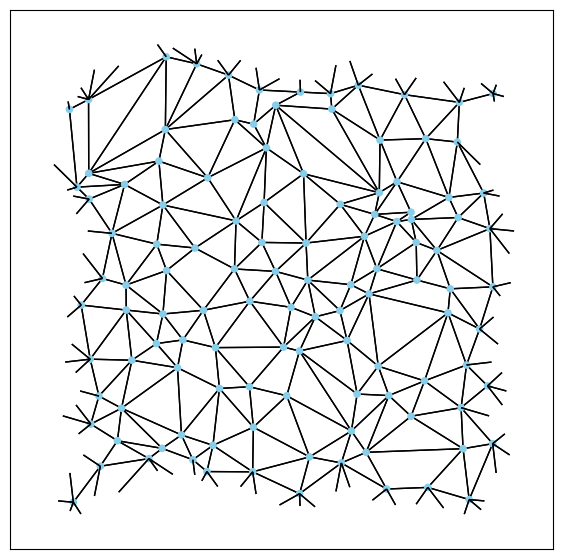

Epoch:  41 | p loss: 4.441e-02 | dist loss: 4.109e-03 | angle loss: 7.632e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: -0.089
Epoch:  42 | p loss: 4.255e-02 | dist loss: 4.065e-03 | angle loss: 2.650e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: -0.094
Epoch:  43 | p loss: 3.768e-02 | dist loss: 6.711e-03 | angle loss: 1.588e-03 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: -0.106
Epoch:  44 | p loss: 3.538e-02 | dist loss: 8.372e-03 | angle loss: 8.876e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: -0.112
Epoch:  45 | p loss: 3.444e-02 | dist loss: 8.132e-03 | angle loss: 4.012e-04 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: -0.114
Epoch:  46 | p loss: 3.544e-02 | dist loss: 6.222e-03 | angle loss: 2.980e-01 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: -0.112
Epoch:  47 | p loss: 3.738e-02 | dist loss: 4.716e-03 | angle loss: 2.483e-04 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: -0.107
Epoch:  48 | p loss: 3.620e-02 | dist loss: 5.297e-03 | angle loss: 4.625e-04 | rmsd: 0.290 | rmsd loss:

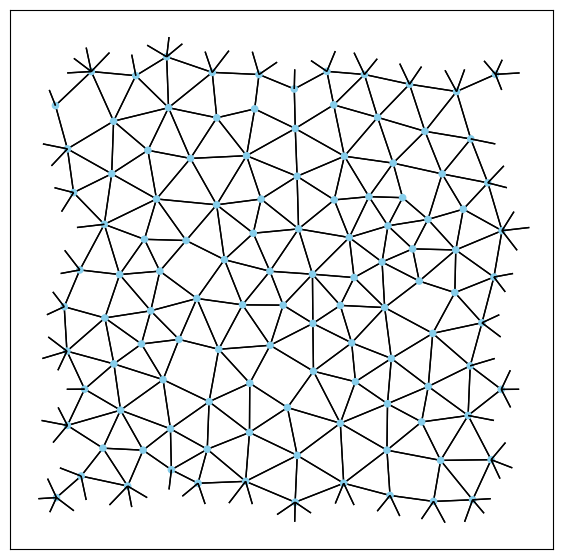

Epoch:   1 | p loss: 3.321e-01 | dist loss: 0.000e+00 | angle loss: 6.904e-16 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.276
Epoch:   2 | p loss: 2.415e-01 | dist loss: 0.000e+00 | angle loss: 1.307e-09 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.191
Epoch:   3 | p loss: 2.178e-01 | dist loss: 0.000e+00 | angle loss: 2.094e-04 | rmsd: 0.143 | rmsd loss: 0.000 | curr p: 0.167
Epoch:   4 | p loss: 1.864e-01 | dist loss: 0.000e+00 | angle loss: 8.276e-01 | rmsd: 0.184 | rmsd loss: 0.000 | curr p: 0.132
Epoch:   5 | p loss: 1.688e-01 | dist loss: 0.000e+00 | angle loss: 2.079e+00 | rmsd: 0.216 | rmsd loss: 0.000 | curr p: 0.111
Epoch:   6 | p loss: 1.560e-01 | dist loss: 0.000e+00 | angle loss: 2.148e+00 | rmsd: 0.242 | rmsd loss: 0.000 | curr p: 0.095
Epoch:   7 | p loss: 1.492e-01 | dist loss: 0.000e+00 | angle loss: 4.349e-01 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: 0.086
Epoch:   8 | p loss: 1.424e-01 | dist loss: 0.000e+00 | angle loss: 4.715e-01 | rmsd: 0.282 | rmsd loss: 0.000 

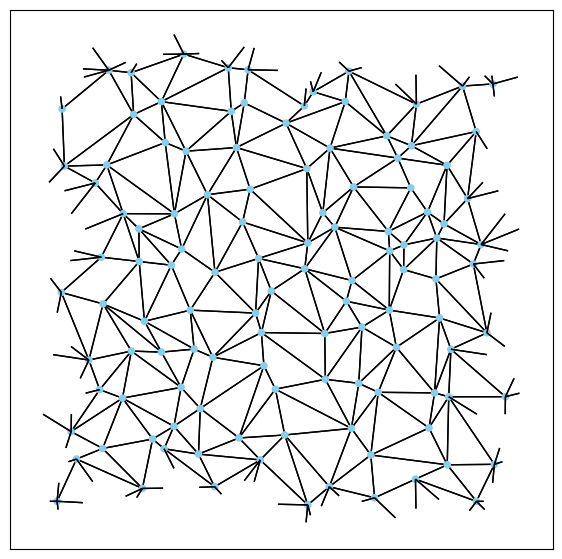

Epoch:  11 | p loss: 1.427e-01 | dist loss: 0.000e+00 | angle loss: 2.004e-03 | rmsd: 0.301 | rmsd loss: 0.014 | curr p: 0.078
Epoch:  12 | p loss: 1.538e-01 | dist loss: 0.000e+00 | angle loss: 1.233e-04 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: 0.092
Epoch:  13 | p loss: 1.618e-01 | dist loss: 0.000e+00 | angle loss: 2.751e-05 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.102
Epoch:  14 | p loss: 1.675e-01 | dist loss: 0.000e+00 | angle loss: 1.429e-05 | rmsd: 0.271 | rmsd loss: 0.000 | curr p: 0.109
Epoch:  15 | p loss: 1.710e-01 | dist loss: 0.000e+00 | angle loss: 1.527e-05 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.113
Epoch:  16 | p loss: 1.730e-01 | dist loss: 0.000e+00 | angle loss: 3.817e-05 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.116
Epoch:  17 | p loss: 1.733e-01 | dist loss: 0.000e+00 | angle loss: 2.516e-04 | rmsd: 0.269 | rmsd loss: 0.000 | curr p: 0.116
Epoch:  18 | p loss: 1.700e-01 | dist loss: 0.000e+00 | angle loss: 2.332e-03 | rmsd: 0.274 | rmsd loss: 0.000 

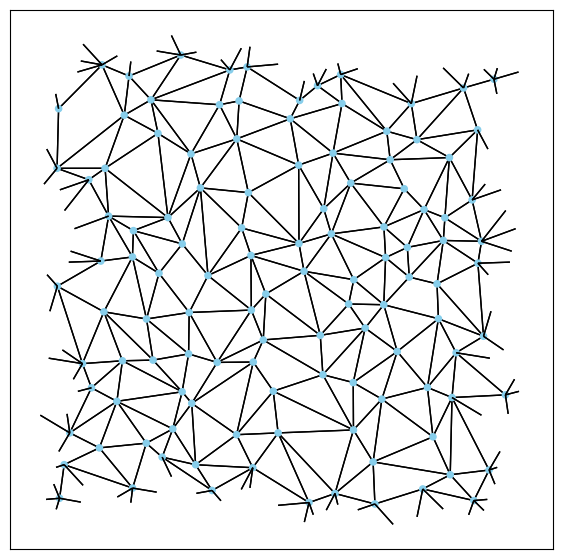

Epoch:  21 | p loss: 1.416e-01 | dist loss: 5.435e-03 | angle loss: 1.606e-03 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.076
Epoch:  22 | p loss: 1.479e-01 | dist loss: 9.961e-05 | angle loss: 1.026e-02 | rmsd: 0.310 | rmsd loss: 0.097 | curr p: 0.085
Epoch:  23 | p loss: 1.539e-01 | dist loss: 0.000e+00 | angle loss: 1.595e-03 | rmsd: 0.314 | rmsd loss: 0.137 | curr p: 0.092
Epoch:  24 | p loss: 1.595e-01 | dist loss: 0.000e+00 | angle loss: 3.445e-04 | rmsd: 0.308 | rmsd loss: 0.077 | curr p: 0.099
Epoch:  25 | p loss: 1.644e-01 | dist loss: 0.000e+00 | angle loss: 6.379e-05 | rmsd: 0.295 | rmsd loss: 0.000 | curr p: 0.105
Epoch:  26 | p loss: 1.662e-01 | dist loss: 0.000e+00 | angle loss: 2.381e-05 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.108
Epoch:  27 | p loss: 1.660e-01 | dist loss: 0.000e+00 | angle loss: 1.419e-05 | rmsd: 0.278 | rmsd loss: 0.000 | curr p: 0.107
Epoch:  28 | p loss: 1.643e-01 | dist loss: 0.000e+00 | angle loss: 1.301e-05 | rmsd: 0.275 | rmsd loss: 0.000 

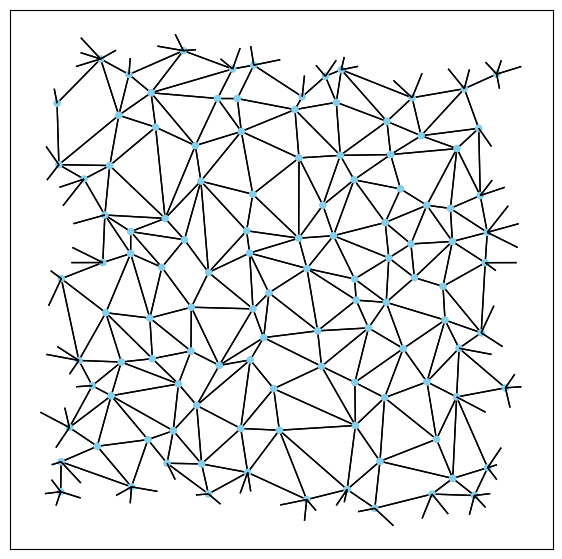

Epoch:  31 | p loss: 1.491e-01 | dist loss: 0.000e+00 | angle loss: 1.137e-03 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.086
Epoch:  32 | p loss: 1.416e-01 | dist loss: 0.000e+00 | angle loss: 5.268e-03 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.076
Epoch:  33 | p loss: 1.338e-01 | dist loss: 0.000e+00 | angle loss: 1.223e-02 | rmsd: 0.301 | rmsd loss: 0.011 | curr p: 0.066
Epoch:  34 | p loss: 1.312e-01 | dist loss: 9.379e-05 | angle loss: 7.145e-03 | rmsd: 0.304 | rmsd loss: 0.039 | curr p: 0.062
Epoch:  35 | p loss: 1.326e-01 | dist loss: 6.697e-05 | angle loss: 1.573e-03 | rmsd: 0.300 | rmsd loss: 0.001 | curr p: 0.064
Epoch:  36 | p loss: 1.375e-01 | dist loss: 0.000e+00 | angle loss: 2.215e-04 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.071
Epoch:  37 | p loss: 1.422e-01 | dist loss: 0.000e+00 | angle loss: 1.032e-04 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: 0.077
Epoch:  38 | p loss: 1.455e-01 | dist loss: 0.000e+00 | angle loss: 1.738e-04 | rmsd: 0.280 | rmsd loss: 0.000 

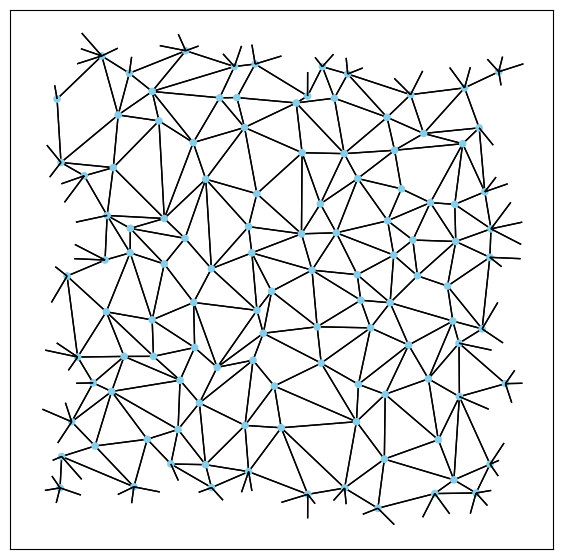

Epoch:  41 | p loss: 1.480e-01 | dist loss: 0.000e+00 | angle loss: 5.969e-03 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: 0.085
Epoch:  42 | p loss: 1.483e-01 | dist loss: 0.000e+00 | angle loss: 2.434e-01 | rmsd: 0.294 | rmsd loss: 0.000 | curr p: 0.085
Epoch:  43 | p loss: 1.425e-01 | dist loss: 0.000e+00 | angle loss: 2.550e-02 | rmsd: 0.300 | rmsd loss: 0.000 | curr p: 0.078
Epoch:  44 | p loss: 1.388e-01 | dist loss: 0.000e+00 | angle loss: 4.240e-03 | rmsd: 0.305 | rmsd loss: 0.046 | curr p: 0.073
Epoch:  45 | p loss: 1.390e-01 | dist loss: 0.000e+00 | angle loss: 2.464e-04 | rmsd: 0.304 | rmsd loss: 0.040 | curr p: 0.073
Epoch:  46 | p loss: 1.429e-01 | dist loss: 0.000e+00 | angle loss: 2.398e-04 | rmsd: 0.298 | rmsd loss: 0.000 | curr p: 0.078
Epoch:  47 | p loss: 1.463e-01 | dist loss: 0.000e+00 | angle loss: 4.930e-04 | rmsd: 0.295 | rmsd loss: 0.000 | curr p: 0.082
Epoch:  48 | p loss: 1.480e-01 | dist loss: 0.000e+00 | angle loss: 1.029e-03 | rmsd: 0.294 | rmsd loss: 0.000 

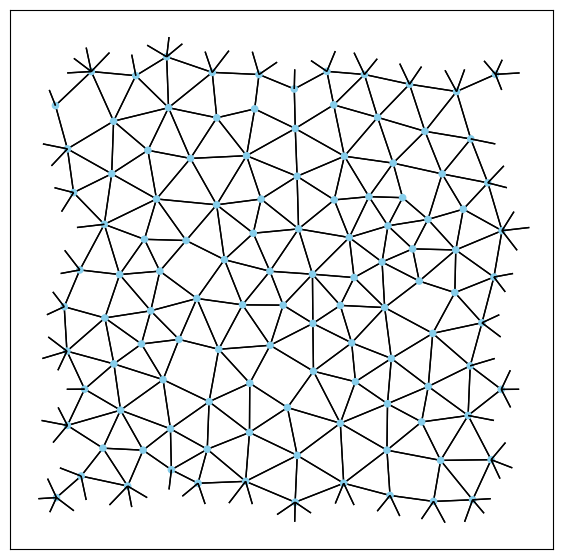

Epoch:   1 | p loss: 3.674e-01 | dist loss: 0.000e+00 | angle loss: 1.393e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.306
Epoch:   2 | p loss: 2.524e-01 | dist loss: 0.000e+00 | angle loss: 3.960e-13 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.202
Epoch:   3 | p loss: 2.275e-01 | dist loss: 0.000e+00 | angle loss: 1.420e-07 | rmsd: 0.146 | rmsd loss: 0.000 | curr p: 0.177
Epoch:   4 | p loss: 1.984e-01 | dist loss: 0.000e+00 | angle loss: 3.021e-02 | rmsd: 0.188 | rmsd loss: 0.000 | curr p: 0.145
Epoch:   5 | p loss: 1.827e-01 | dist loss: 0.000e+00 | angle loss: 1.676e+00 | rmsd: 0.223 | rmsd loss: 0.000 | curr p: 0.127
Epoch:   6 | p loss: 1.691e-01 | dist loss: 0.000e+00 | angle loss: 2.512e+00 | rmsd: 0.252 | rmsd loss: 0.000 | curr p: 0.111
Epoch:   7 | p loss: 1.566e-01 | dist loss: 0.000e+00 | angle loss: 3.794e+00 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.096
Epoch:   8 | p loss: 1.464e-01 | dist loss: 4.389e-06 | angle loss: 1.799e+00 | rmsd: 0.292 | rmsd loss: 0.000 

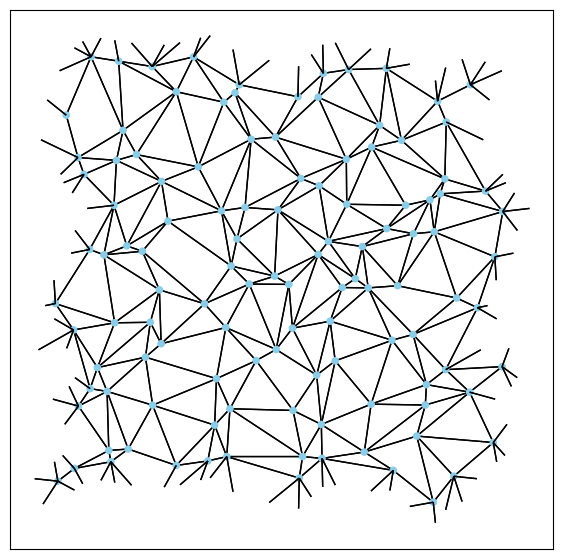

Epoch:  11 | p loss: 1.345e-01 | dist loss: 3.736e-03 | angle loss: 1.934e-01 | rmsd: 0.311 | rmsd loss: 0.114 | curr p: 0.067
Epoch:  12 | p loss: 1.339e-01 | dist loss: 4.176e-04 | angle loss: 1.337e-02 | rmsd: 0.312 | rmsd loss: 0.119 | curr p: 0.066
Epoch:  13 | p loss: 1.401e-01 | dist loss: 0.000e+00 | angle loss: 4.601e-04 | rmsd: 0.300 | rmsd loss: 0.003 | curr p: 0.074
Epoch:  14 | p loss: 1.553e-01 | dist loss: 0.000e+00 | angle loss: 1.667e-05 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.094
Epoch:  15 | p loss: 1.690e-01 | dist loss: 0.000e+00 | angle loss: 4.722e-06 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.111
Epoch:  16 | p loss: 1.760e-01 | dist loss: 0.000e+00 | angle loss: 1.023e-05 | rmsd: 0.258 | rmsd loss: 0.000 | curr p: 0.120
Epoch:  17 | p loss: 1.798e-01 | dist loss: 0.000e+00 | angle loss: 4.040e-05 | rmsd: 0.252 | rmsd loss: 0.000 | curr p: 0.124
Epoch:  18 | p loss: 1.807e-01 | dist loss: 0.000e+00 | angle loss: 1.694e-04 | rmsd: 0.251 | rmsd loss: 0.000 

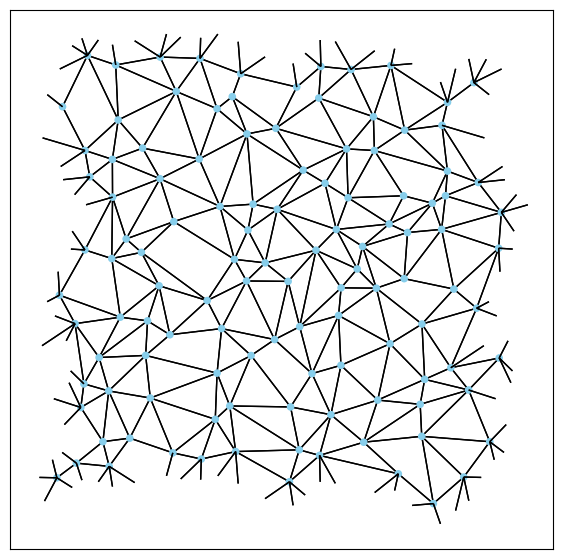

Epoch:  21 | p loss: 1.662e-01 | dist loss: 0.000e+00 | angle loss: 2.002e-03 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.108
Epoch:  22 | p loss: 1.607e-01 | dist loss: 0.000e+00 | angle loss: 5.174e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.101
Epoch:  23 | p loss: 1.585e-01 | dist loss: 0.000e+00 | angle loss: 1.349e-02 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: 0.098
Epoch:  24 | p loss: 1.532e-01 | dist loss: 0.000e+00 | angle loss: 1.714e-02 | rmsd: 0.299 | rmsd loss: 0.000 | curr p: 0.091
Epoch:  25 | p loss: 1.493e-01 | dist loss: 0.000e+00 | angle loss: 1.828e-02 | rmsd: 0.309 | rmsd loss: 0.086 | curr p: 0.086
Epoch:  26 | p loss: 1.482e-01 | dist loss: 0.000e+00 | angle loss: 6.865e-03 | rmsd: 0.313 | rmsd loss: 0.132 | curr p: 0.085
Epoch:  27 | p loss: 1.502e-01 | dist loss: 0.000e+00 | angle loss: 8.062e-04 | rmsd: 0.310 | rmsd loss: 0.102 | curr p: 0.088
Epoch:  28 | p loss: 1.552e-01 | dist loss: 0.000e+00 | angle loss: 2.098e-04 | rmsd: 0.300 | rmsd loss: 0.003 

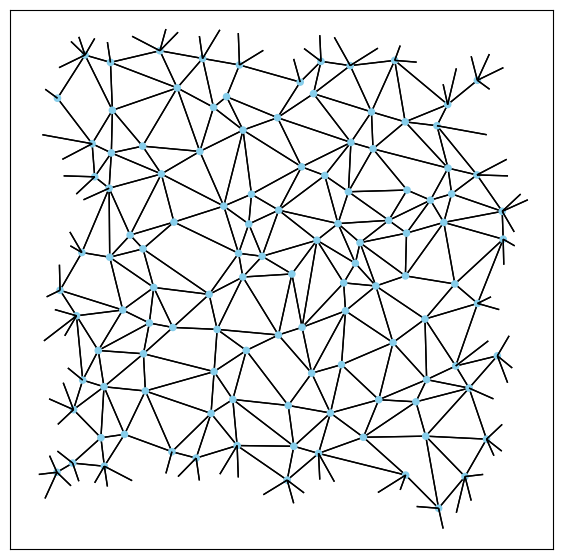

Epoch:  31 | p loss: 1.715e-01 | dist loss: 0.000e+00 | angle loss: 1.138e-04 | rmsd: 0.265 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  32 | p loss: 1.734e-01 | dist loss: 0.000e+00 | angle loss: 5.369e-05 | rmsd: 0.258 | rmsd loss: 0.000 | curr p: 0.116
Epoch:  33 | p loss: 1.720e-01 | dist loss: 0.000e+00 | angle loss: 2.917e-05 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: 0.115
Epoch:  34 | p loss: 1.684e-01 | dist loss: 0.000e+00 | angle loss: 2.342e-05 | rmsd: 0.253 | rmsd loss: 0.000 | curr p: 0.110
Epoch:  35 | p loss: 1.629e-01 | dist loss: 0.000e+00 | angle loss: 4.130e-05 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: 0.104
Epoch:  36 | p loss: 1.545e-01 | dist loss: 0.000e+00 | angle loss: 3.927e-04 | rmsd: 0.257 | rmsd loss: 0.000 | curr p: 0.093
Epoch:  37 | p loss: 1.462e-01 | dist loss: 0.000e+00 | angle loss: 5.131e-03 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: 0.082
Epoch:  38 | p loss: 1.525e-01 | dist loss: 0.000e+00 | angle loss: 3.036e-03 | rmsd: 0.271 | rmsd loss: 0.000 

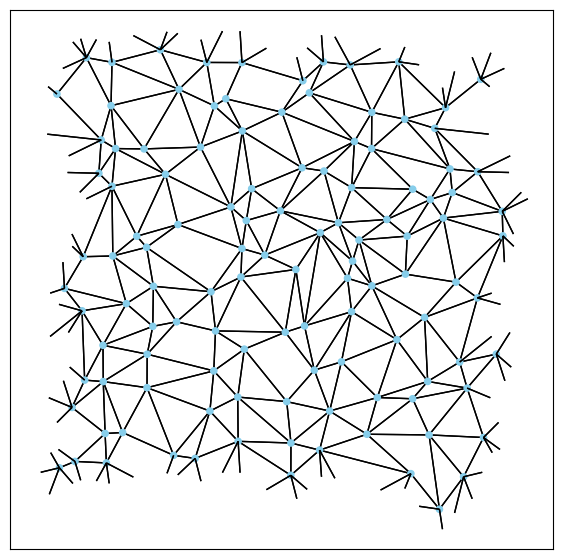

Epoch:  41 | p loss: 1.288e-01 | dist loss: 0.000e+00 | angle loss: 9.697e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.059
Epoch:  42 | p loss: 1.192e-01 | dist loss: 1.966e-05 | angle loss: 1.020e-02 | rmsd: 0.305 | rmsd loss: 0.046 | curr p: 0.045
Epoch:  43 | p loss: 1.218e-01 | dist loss: 1.104e-03 | angle loss: 2.137e-03 | rmsd: 0.308 | rmsd loss: 0.079 | curr p: 0.049
Epoch:  44 | p loss: 1.296e-01 | dist loss: 0.000e+00 | angle loss: 3.631e-04 | rmsd: 0.305 | rmsd loss: 0.053 | curr p: 0.060
Epoch:  45 | p loss: 1.391e-01 | dist loss: 0.000e+00 | angle loss: 8.155e-05 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.073
Epoch:  46 | p loss: 1.452e-01 | dist loss: 0.000e+00 | angle loss: 4.655e-05 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.081
Epoch:  47 | p loss: 1.493e-01 | dist loss: 0.000e+00 | angle loss: 4.469e-05 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: 0.086
Epoch:  48 | p loss: 1.515e-01 | dist loss: 0.000e+00 | angle loss: 6.166e-05 | rmsd: 0.286 | rmsd loss: 0.000 

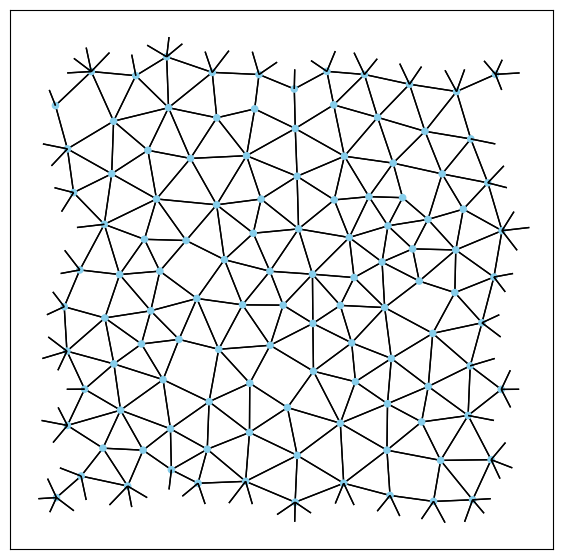

Epoch:   1 | p loss: 3.715e-01 | dist loss: 0.000e+00 | angle loss: 6.567e-20 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.309
Epoch:   2 | p loss: 2.770e-01 | dist loss: 0.000e+00 | angle loss: 7.861e-17 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.226
Epoch:   3 | p loss: 2.312e-01 | dist loss: 0.000e+00 | angle loss: 5.916e-11 | rmsd: 0.149 | rmsd loss: 0.000 | curr p: 0.181
Epoch:   4 | p loss: 1.895e-01 | dist loss: 0.000e+00 | angle loss: 3.643e-05 | rmsd: 0.192 | rmsd loss: 0.000 | curr p: 0.135
Epoch:   5 | p loss: 1.624e-01 | dist loss: 0.000e+00 | angle loss: 3.584e-01 | rmsd: 0.232 | rmsd loss: 0.000 | curr p: 0.103
Epoch:   6 | p loss: 1.488e-01 | dist loss: 0.000e+00 | angle loss: 2.247e+00 | rmsd: 0.265 | rmsd loss: 0.000 | curr p: 0.086
Epoch:   7 | p loss: 1.388e-01 | dist loss: 2.368e-03 | angle loss: 2.244e+00 | rmsd: 0.291 | rmsd loss: 0.000 | curr p: 0.073
Epoch:   8 | p loss: 1.282e-01 | dist loss: 2.351e-02 | angle loss: 2.711e+00 | rmsd: 0.311 | rmsd loss: 0.115 

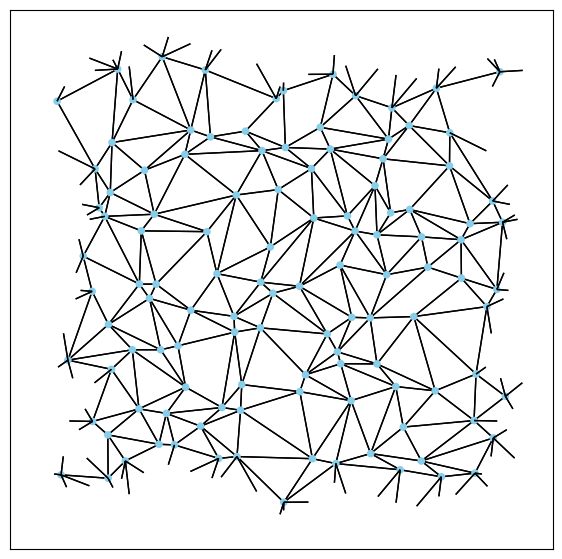

Epoch:  11 | p loss: 1.206e-01 | dist loss: 3.419e-04 | angle loss: 2.612e-01 | rmsd: 0.338 | rmsd loss: 0.380 | curr p: 0.047
Epoch:  12 | p loss: 1.248e-01 | dist loss: 0.000e+00 | angle loss: 6.248e-02 | rmsd: 0.340 | rmsd loss: 0.399 | curr p: 0.053
Epoch:  13 | p loss: 1.341e-01 | dist loss: 0.000e+00 | angle loss: 3.100e-03 | rmsd: 0.334 | rmsd loss: 0.341 | curr p: 0.066
Epoch:  14 | p loss: 1.469e-01 | dist loss: 0.000e+00 | angle loss: 9.466e-05 | rmsd: 0.319 | rmsd loss: 0.189 | curr p: 0.083
Epoch:  15 | p loss: 1.611e-01 | dist loss: 0.000e+00 | angle loss: 6.140e-06 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.101
Epoch:  16 | p loss: 1.727e-01 | dist loss: 0.000e+00 | angle loss: 3.861e-06 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.116
Epoch:  17 | p loss: 1.803e-01 | dist loss: 0.000e+00 | angle loss: 4.354e-06 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.125
Epoch:  18 | p loss: 1.861e-01 | dist loss: 0.000e+00 | angle loss: 9.169e-06 | rmsd: 0.257 | rmsd loss: 0.000 

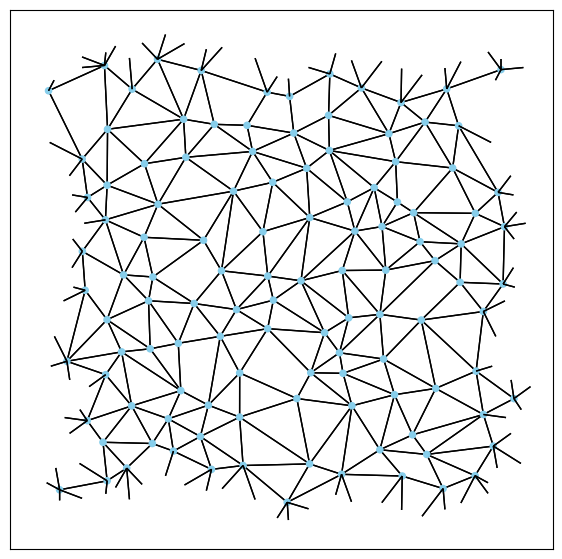

Epoch:  21 | p loss: 1.910e-01 | dist loss: 0.000e+00 | angle loss: 1.614e-03 | rmsd: 0.244 | rmsd loss: 0.000 | curr p: 0.137
Epoch:  22 | p loss: 1.891e-01 | dist loss: 0.000e+00 | angle loss: 1.051e-03 | rmsd: 0.244 | rmsd loss: 0.000 | curr p: 0.135
Epoch:  23 | p loss: 1.859e-01 | dist loss: 0.000e+00 | angle loss: 7.361e-04 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: 0.131
Epoch:  24 | p loss: 1.814e-01 | dist loss: 0.000e+00 | angle loss: 9.248e-04 | rmsd: 0.249 | rmsd loss: 0.000 | curr p: 0.126
Epoch:  25 | p loss: 1.753e-01 | dist loss: 0.000e+00 | angle loss: 2.070e-04 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: 0.119
Epoch:  26 | p loss: 1.685e-01 | dist loss: 0.000e+00 | angle loss: 2.794e-04 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: 0.111
Epoch:  27 | p loss: 1.612e-01 | dist loss: 0.000e+00 | angle loss: 4.706e-04 | rmsd: 0.270 | rmsd loss: 0.000 | curr p: 0.101
Epoch:  28 | p loss: 1.539e-01 | dist loss: 0.000e+00 | angle loss: 3.087e-03 | rmsd: 0.281 | rmsd loss: 0.000 

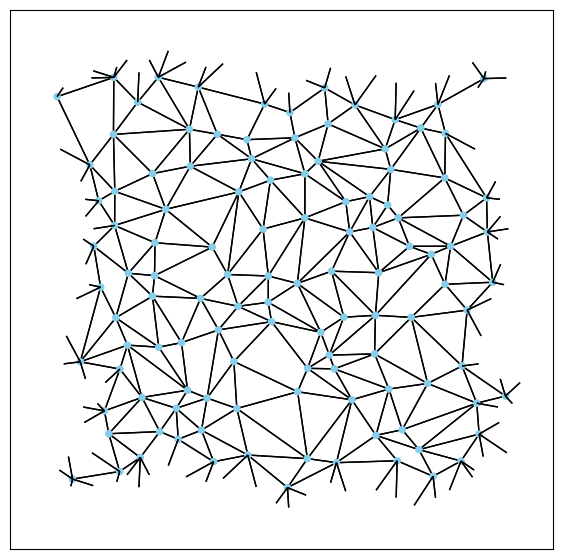

Epoch:  31 | p loss: 1.449e-01 | dist loss: 0.000e+00 | angle loss: 6.235e-03 | rmsd: 0.310 | rmsd loss: 0.096 | curr p: 0.081
Epoch:  32 | p loss: 1.483e-01 | dist loss: 0.000e+00 | angle loss: 8.466e-04 | rmsd: 0.307 | rmsd loss: 0.069 | curr p: 0.085
Epoch:  33 | p loss: 1.562e-01 | dist loss: 0.000e+00 | angle loss: 1.859e-04 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.095
Epoch:  34 | p loss: 1.620e-01 | dist loss: 0.000e+00 | angle loss: 9.533e-05 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.103
Epoch:  35 | p loss: 1.658e-01 | dist loss: 0.000e+00 | angle loss: 7.324e-05 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.107
Epoch:  36 | p loss: 1.681e-01 | dist loss: 0.000e+00 | angle loss: 7.375e-05 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: 0.110
Epoch:  37 | p loss: 1.695e-01 | dist loss: 0.000e+00 | angle loss: 9.312e-05 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.112
Epoch:  38 | p loss: 1.694e-01 | dist loss: 0.000e+00 | angle loss: 1.574e-04 | rmsd: 0.282 | rmsd loss: 0.000 

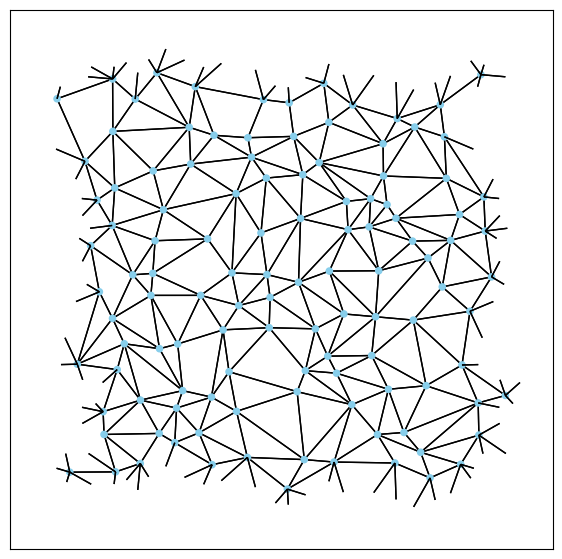

Epoch:  41 | p loss: 1.596e-01 | dist loss: 0.000e+00 | angle loss: 9.089e-04 | rmsd: 0.293 | rmsd loss: 0.000 | curr p: 0.100
Epoch:  42 | p loss: 1.546e-01 | dist loss: 0.000e+00 | angle loss: 1.391e-03 | rmsd: 0.300 | rmsd loss: 0.000 | curr p: 0.093
Epoch:  43 | p loss: 1.485e-01 | dist loss: 0.000e+00 | angle loss: 1.287e-03 | rmsd: 0.307 | rmsd loss: 0.072 | curr p: 0.085
Epoch:  44 | p loss: 1.481e-01 | dist loss: 0.000e+00 | angle loss: 6.004e-04 | rmsd: 0.306 | rmsd loss: 0.061 | curr p: 0.085
Epoch:  45 | p loss: 1.527e-01 | dist loss: 0.000e+00 | angle loss: 6.464e-04 | rmsd: 0.298 | rmsd loss: 0.000 | curr p: 0.091
Epoch:  46 | p loss: 1.552e-01 | dist loss: 0.000e+00 | angle loss: 5.681e-04 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.094
Epoch:  47 | p loss: 1.559e-01 | dist loss: 0.000e+00 | angle loss: 2.280e-04 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.095
Epoch:  48 | p loss: 1.549e-01 | dist loss: 0.000e+00 | angle loss: 1.736e-04 | rmsd: 0.290 | rmsd loss: 0.000 

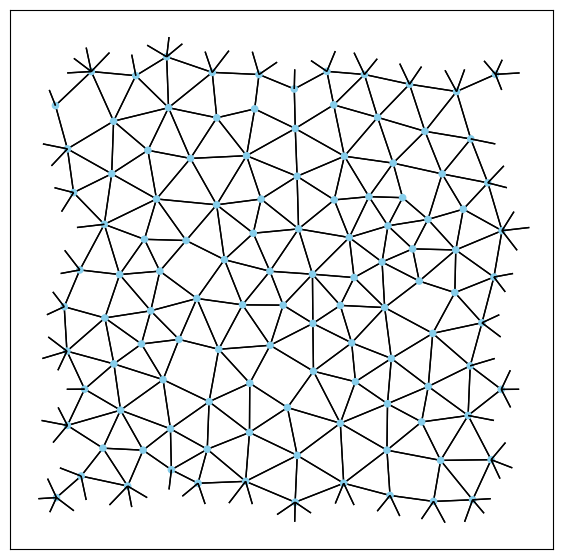

Epoch:   1 | p loss: 4.035e-01 | dist loss: 0.000e+00 | angle loss: 8.379e-19 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.335
Epoch:   2 | p loss: 2.919e-01 | dist loss: 0.000e+00 | angle loss: 6.166e-15 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.240
Epoch:   3 | p loss: 2.346e-01 | dist loss: 0.000e+00 | angle loss: 1.250e-10 | rmsd: 0.150 | rmsd loss: 0.000 | curr p: 0.184
Epoch:   4 | p loss: 2.048e-01 | dist loss: 0.000e+00 | angle loss: 2.329e-06 | rmsd: 0.193 | rmsd loss: 0.000 | curr p: 0.153
Epoch:   5 | p loss: 1.731e-01 | dist loss: 0.000e+00 | angle loss: 2.662e-01 | rmsd: 0.234 | rmsd loss: 0.000 | curr p: 0.116
Epoch:   6 | p loss: 1.492e-01 | dist loss: 0.000e+00 | angle loss: 2.916e+00 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.086
Epoch:   7 | p loss: 1.350e-01 | dist loss: 4.825e-03 | angle loss: 6.603e+00 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.067
Epoch:   8 | p loss: 1.292e-01 | dist loss: 1.025e-02 | angle loss: 7.257e+00 | rmsd: 0.311 | rmsd loss: 0.110 

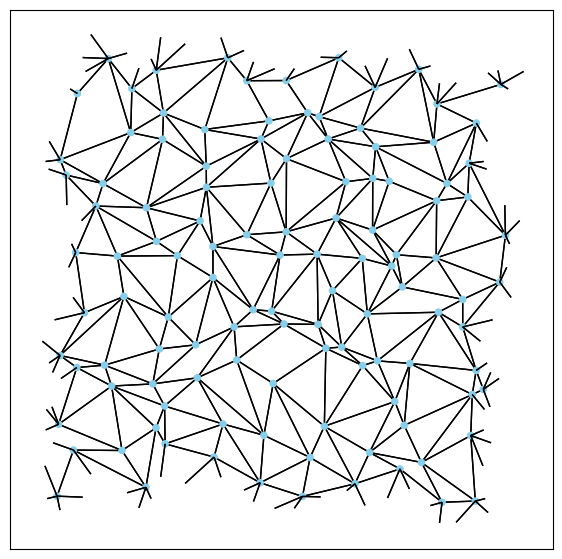

Epoch:  11 | p loss: 1.275e-01 | dist loss: 0.000e+00 | angle loss: 8.111e-01 | rmsd: 0.337 | rmsd loss: 0.369 | curr p: 0.057
Epoch:  12 | p loss: 1.316e-01 | dist loss: 0.000e+00 | angle loss: 6.631e-02 | rmsd: 0.340 | rmsd loss: 0.398 | curr p: 0.063
Epoch:  13 | p loss: 1.365e-01 | dist loss: 0.000e+00 | angle loss: 4.298e-03 | rmsd: 0.338 | rmsd loss: 0.379 | curr p: 0.069
Epoch:  14 | p loss: 1.450e-01 | dist loss: 0.000e+00 | angle loss: 1.450e-04 | rmsd: 0.325 | rmsd loss: 0.254 | curr p: 0.081
Epoch:  15 | p loss: 1.548e-01 | dist loss: 0.000e+00 | angle loss: 6.032e-06 | rmsd: 0.306 | rmsd loss: 0.058 | curr p: 0.094
Epoch:  16 | p loss: 1.665e-01 | dist loss: 0.000e+00 | angle loss: 2.886e-07 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.108
Epoch:  17 | p loss: 1.760e-01 | dist loss: 0.000e+00 | angle loss: 3.741e-08 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: 0.120
Epoch:  18 | p loss: 1.837e-01 | dist loss: 0.000e+00 | angle loss: 1.019e-08 | rmsd: 0.245 | rmsd loss: 0.000 

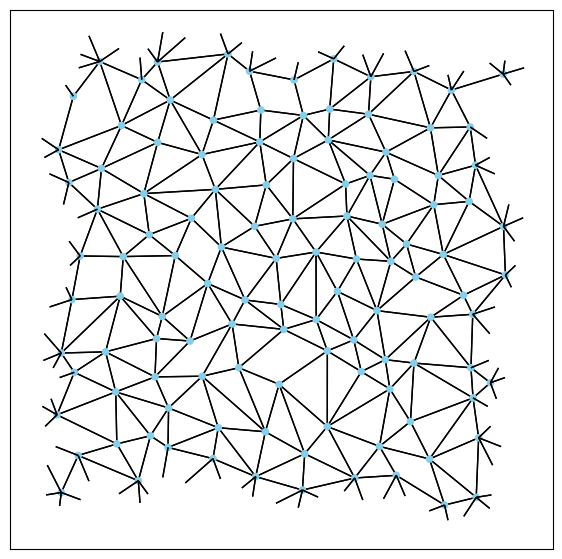

Epoch:  21 | p loss: 1.910e-01 | dist loss: 0.000e+00 | angle loss: 1.343e-07 | rmsd: 0.217 | rmsd loss: 0.000 | curr p: 0.137
Epoch:  22 | p loss: 1.892e-01 | dist loss: 0.000e+00 | angle loss: 1.439e-06 | rmsd: 0.214 | rmsd loss: 0.000 | curr p: 0.135
Epoch:  23 | p loss: 1.861e-01 | dist loss: 0.000e+00 | angle loss: 1.955e-05 | rmsd: 0.213 | rmsd loss: 0.000 | curr p: 0.131
Epoch:  24 | p loss: 1.810e-01 | dist loss: 0.000e+00 | angle loss: 2.923e-04 | rmsd: 0.215 | rmsd loss: 0.000 | curr p: 0.125
Epoch:  25 | p loss: 1.758e-01 | dist loss: 0.000e+00 | angle loss: 1.411e-03 | rmsd: 0.219 | rmsd loss: 0.000 | curr p: 0.119
Epoch:  26 | p loss: 1.753e-01 | dist loss: 0.000e+00 | angle loss: 4.921e-05 | rmsd: 0.225 | rmsd loss: 0.000 | curr p: 0.119
Epoch:  27 | p loss: 1.713e-01 | dist loss: 0.000e+00 | angle loss: 6.799e-05 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  28 | p loss: 1.637e-01 | dist loss: 0.000e+00 | angle loss: 1.266e-03 | rmsd: 0.241 | rmsd loss: 0.000 

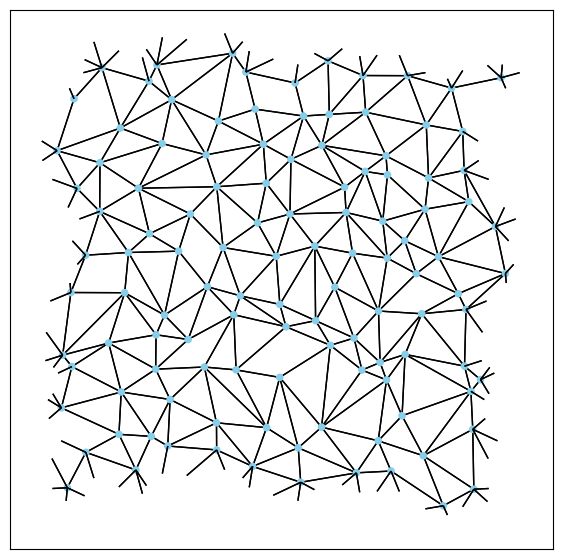

Epoch:  31 | p loss: 1.420e-01 | dist loss: 0.000e+00 | angle loss: 1.685e-03 | rmsd: 0.270 | rmsd loss: 0.000 | curr p: 0.077
Epoch:  32 | p loss: 1.349e-01 | dist loss: 0.000e+00 | angle loss: 2.553e-03 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.067
Epoch:  33 | p loss: 1.244e-01 | dist loss: 0.000e+00 | angle loss: 8.057e-03 | rmsd: 0.293 | rmsd loss: 0.000 | curr p: 0.053
Epoch:  34 | p loss: 1.156e-01 | dist loss: 8.553e-04 | angle loss: 5.390e-03 | rmsd: 0.306 | rmsd loss: 0.058 | curr p: 0.040
Epoch:  35 | p loss: 1.145e-01 | dist loss: 1.401e-03 | angle loss: 8.351e-03 | rmsd: 0.310 | rmsd loss: 0.100 | curr p: 0.038
Epoch:  36 | p loss: 1.166e-01 | dist loss: 4.260e-04 | angle loss: 3.174e-03 | rmsd: 0.312 | rmsd loss: 0.115 | curr p: 0.041
Epoch:  37 | p loss: 1.295e-01 | dist loss: 0.000e+00 | angle loss: 1.025e-03 | rmsd: 0.306 | rmsd loss: 0.060 | curr p: 0.060
Epoch:  38 | p loss: 1.441e-01 | dist loss: 0.000e+00 | angle loss: 2.770e-04 | rmsd: 0.294 | rmsd loss: 0.000 

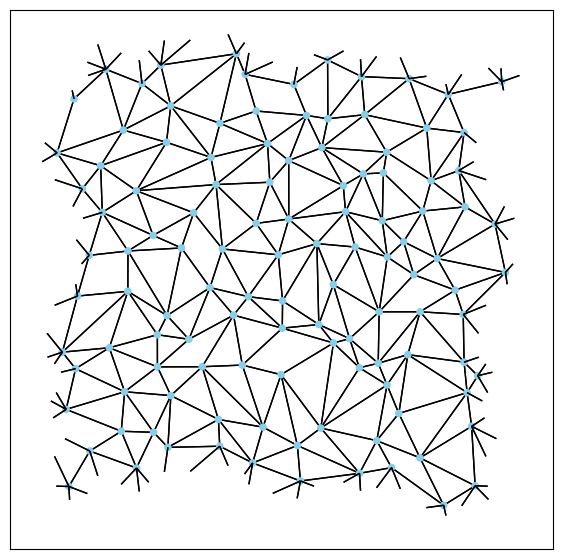

Epoch:  41 | p loss: 1.547e-01 | dist loss: 0.000e+00 | angle loss: 5.475e-05 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.093
Epoch:  42 | p loss: 1.535e-01 | dist loss: 0.000e+00 | angle loss: 8.740e-05 | rmsd: 0.273 | rmsd loss: 0.000 | curr p: 0.092
Epoch:  43 | p loss: 1.510e-01 | dist loss: 0.000e+00 | angle loss: 2.275e-04 | rmsd: 0.273 | rmsd loss: 0.000 | curr p: 0.089
Epoch:  44 | p loss: 1.467e-01 | dist loss: 0.000e+00 | angle loss: 8.494e-04 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.083
Epoch:  45 | p loss: 1.408e-01 | dist loss: 0.000e+00 | angle loss: 2.688e-03 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: 0.075
Epoch:  46 | p loss: 1.338e-01 | dist loss: 9.641e-04 | angle loss: 5.803e-03 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.066
Epoch:  47 | p loss: 1.359e-01 | dist loss: 0.000e+00 | angle loss: 5.359e-03 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.069
Epoch:  48 | p loss: 1.369e-01 | dist loss: 0.000e+00 | angle loss: 9.532e-03 | rmsd: 0.300 | rmsd loss: 0.000 

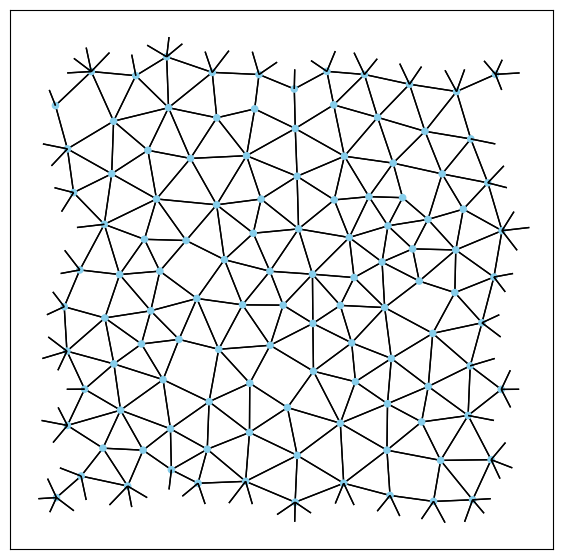

Epoch:   1 | p loss: 3.295e-01 | dist loss: 0.000e+00 | angle loss: 3.959e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.274
Epoch:   2 | p loss: 2.490e-01 | dist loss: 0.000e+00 | angle loss: 2.861e-12 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.199
Epoch:   3 | p loss: 2.283e-01 | dist loss: 0.000e+00 | angle loss: 6.088e-07 | rmsd: 0.148 | rmsd loss: 0.000 | curr p: 0.178
Epoch:   4 | p loss: 2.123e-01 | dist loss: 0.000e+00 | angle loss: 1.327e-02 | rmsd: 0.190 | rmsd loss: 0.000 | curr p: 0.161
Epoch:   5 | p loss: 1.934e-01 | dist loss: 0.000e+00 | angle loss: 1.965e-01 | rmsd: 0.225 | rmsd loss: 0.000 | curr p: 0.140
Epoch:   6 | p loss: 1.749e-01 | dist loss: 0.000e+00 | angle loss: 4.668e+00 | rmsd: 0.254 | rmsd loss: 0.000 | curr p: 0.118
Epoch:   7 | p loss: 1.570e-01 | dist loss: 0.000e+00 | angle loss: 7.044e+00 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.096
Epoch:   8 | p loss: 1.508e-01 | dist loss: 0.000e+00 | angle loss: 2.529e+00 | rmsd: 0.294 | rmsd loss: 0.000 

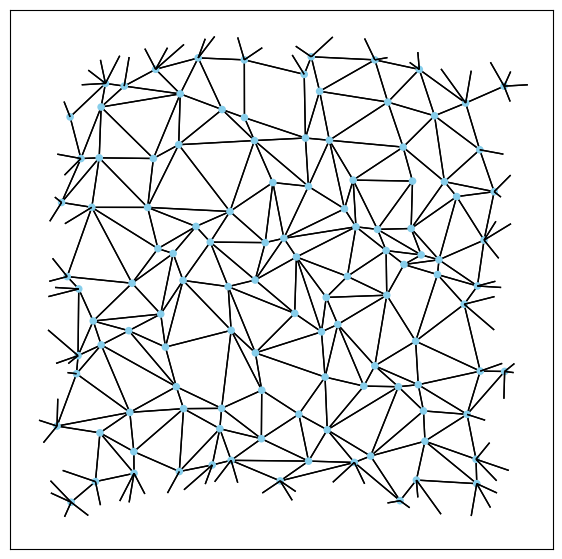

Epoch:  11 | p loss: 1.389e-01 | dist loss: 0.000e+00 | angle loss: 2.728e-01 | rmsd: 0.317 | rmsd loss: 0.175 | curr p: 0.073
Epoch:  12 | p loss: 1.405e-01 | dist loss: 0.000e+00 | angle loss: 4.957e-02 | rmsd: 0.319 | rmsd loss: 0.188 | curr p: 0.075
Epoch:  13 | p loss: 1.545e-01 | dist loss: 0.000e+00 | angle loss: 2.321e-03 | rmsd: 0.313 | rmsd loss: 0.129 | curr p: 0.093
Epoch:  14 | p loss: 1.684e-01 | dist loss: 0.000e+00 | angle loss: 2.479e-04 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.110
Epoch:  15 | p loss: 1.787e-01 | dist loss: 0.000e+00 | angle loss: 5.968e-05 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.123
Epoch:  16 | p loss: 1.849e-01 | dist loss: 0.000e+00 | angle loss: 1.865e-05 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.130
Epoch:  17 | p loss: 1.883e-01 | dist loss: 0.000e+00 | angle loss: 8.693e-06 | rmsd: 0.271 | rmsd loss: 0.000 | curr p: 0.134
Epoch:  18 | p loss: 1.898e-01 | dist loss: 0.000e+00 | angle loss: 1.539e-05 | rmsd: 0.268 | rmsd loss: 0.000 

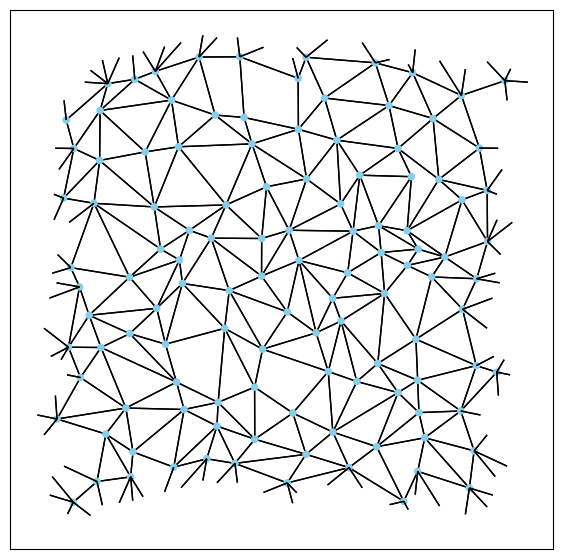

Epoch:  21 | p loss: 1.848e-01 | dist loss: 0.000e+00 | angle loss: 1.267e-02 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.130
Epoch:  22 | p loss: 1.847e-01 | dist loss: 0.000e+00 | angle loss: 3.072e-04 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.130
Epoch:  23 | p loss: 1.821e-01 | dist loss: 0.000e+00 | angle loss: 5.335e-04 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: 0.127
Epoch:  24 | p loss: 1.767e-01 | dist loss: 0.000e+00 | angle loss: 1.254e-03 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.120
Epoch:  25 | p loss: 1.696e-01 | dist loss: 0.000e+00 | angle loss: 4.129e-03 | rmsd: 0.298 | rmsd loss: 0.000 | curr p: 0.112
Epoch:  26 | p loss: 1.635e-01 | dist loss: 0.000e+00 | angle loss: 1.210e-02 | rmsd: 0.307 | rmsd loss: 0.069 | curr p: 0.104
Epoch:  27 | p loss: 1.612e-01 | dist loss: 0.000e+00 | angle loss: 3.389e-03 | rmsd: 0.310 | rmsd loss: 0.103 | curr p: 0.101
Epoch:  28 | p loss: 1.659e-01 | dist loss: 0.000e+00 | angle loss: 6.568e-04 | rmsd: 0.305 | rmsd loss: 0.049 

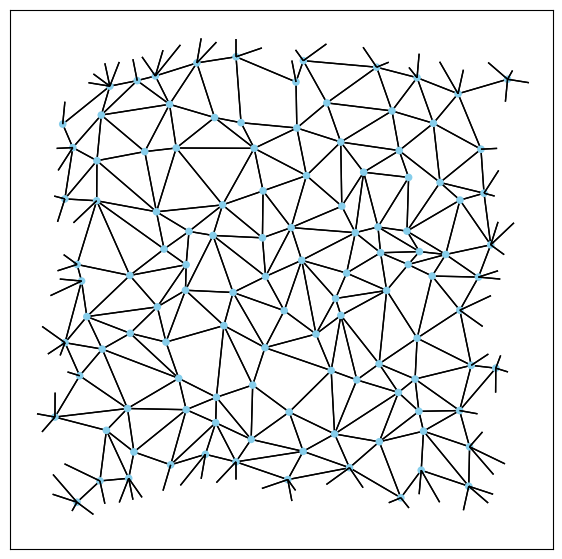

Epoch:  31 | p loss: 1.783e-01 | dist loss: 0.000e+00 | angle loss: 5.685e-05 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.122
Epoch:  32 | p loss: 1.785e-01 | dist loss: 0.000e+00 | angle loss: 8.372e-05 | rmsd: 0.271 | rmsd loss: 0.000 | curr p: 0.122
Epoch:  33 | p loss: 1.764e-01 | dist loss: 0.000e+00 | angle loss: 1.783e-04 | rmsd: 0.270 | rmsd loss: 0.000 | curr p: 0.120
Epoch:  34 | p loss: 1.722e-01 | dist loss: 0.000e+00 | angle loss: 5.320e-04 | rmsd: 0.272 | rmsd loss: 0.000 | curr p: 0.115
Epoch:  35 | p loss: 1.655e-01 | dist loss: 0.000e+00 | angle loss: 2.467e-03 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.107
Epoch:  36 | p loss: 1.584e-01 | dist loss: 0.000e+00 | angle loss: 6.696e-03 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.098
Epoch:  37 | p loss: 1.560e-01 | dist loss: 0.000e+00 | angle loss: 4.035e-03 | rmsd: 0.291 | rmsd loss: 0.000 | curr p: 0.095
Epoch:  38 | p loss: 1.544e-01 | dist loss: 0.000e+00 | angle loss: 6.523e-03 | rmsd: 0.298 | rmsd loss: 0.000 

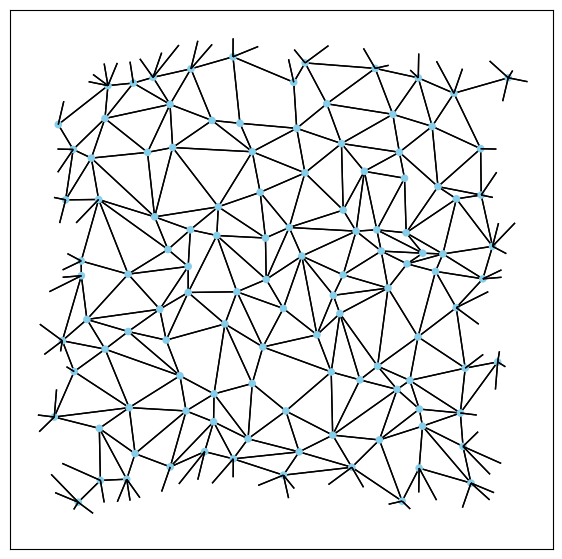

Epoch:  41 | p loss: 1.588e-01 | dist loss: 0.000e+00 | angle loss: 1.382e-03 | rmsd: 0.301 | rmsd loss: 0.008 | curr p: 0.099
Epoch:  42 | p loss: 1.665e-01 | dist loss: 0.000e+00 | angle loss: 6.219e-04 | rmsd: 0.290 | rmsd loss: 0.000 | curr p: 0.108
Epoch:  43 | p loss: 1.709e-01 | dist loss: 0.000e+00 | angle loss: 3.705e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: 0.113
Epoch:  44 | p loss: 1.696e-01 | dist loss: 0.000e+00 | angle loss: 7.722e-04 | rmsd: 0.277 | rmsd loss: 0.000 | curr p: 0.112
Epoch:  45 | p loss: 1.689e-01 | dist loss: 0.000e+00 | angle loss: 1.314e-03 | rmsd: 0.276 | rmsd loss: 0.000 | curr p: 0.111
Epoch:  46 | p loss: 1.714e-01 | dist loss: 0.000e+00 | angle loss: 1.593e-03 | rmsd: 0.276 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  47 | p loss: 1.718e-01 | dist loss: 0.000e+00 | angle loss: 3.657e-03 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  48 | p loss: 1.675e-01 | dist loss: 0.000e+00 | angle loss: 2.027e-03 | rmsd: 0.283 | rmsd loss: 0.000 

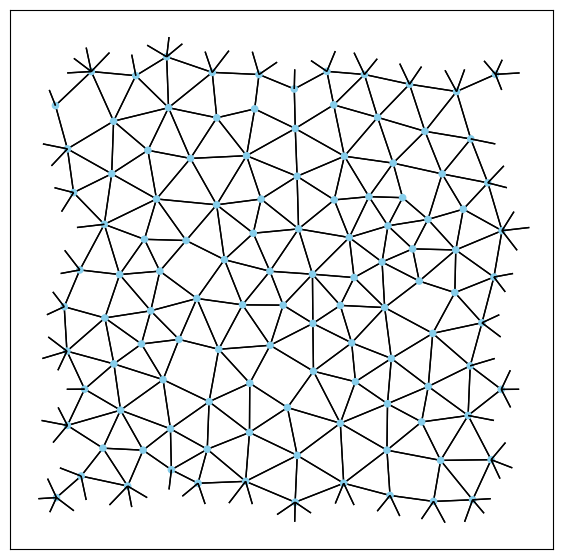

Epoch:   1 | p loss: 3.802e-01 | dist loss: 0.000e+00 | angle loss: 5.823e-20 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.317
Epoch:   2 | p loss: 2.577e-01 | dist loss: 0.000e+00 | angle loss: 1.312e-15 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.208
Epoch:   3 | p loss: 2.201e-01 | dist loss: 0.000e+00 | angle loss: 5.062e-10 | rmsd: 0.150 | rmsd loss: 0.000 | curr p: 0.169
Epoch:   4 | p loss: 1.888e-01 | dist loss: 0.000e+00 | angle loss: 7.863e-04 | rmsd: 0.194 | rmsd loss: 0.000 | curr p: 0.134
Epoch:   5 | p loss: 1.686e-01 | dist loss: 0.000e+00 | angle loss: 7.402e-01 | rmsd: 0.236 | rmsd loss: 0.000 | curr p: 0.111
Epoch:   6 | p loss: 1.492e-01 | dist loss: 1.894e-03 | angle loss: 1.587e+01 | rmsd: 0.269 | rmsd loss: 0.000 | curr p: 0.086
Epoch:   7 | p loss: 1.390e-01 | dist loss: 2.520e-02 | angle loss: 1.291e+01 | rmsd: 0.293 | rmsd loss: 0.000 | curr p: 0.073
Epoch:   8 | p loss: 1.363e-01 | dist loss: 6.447e-02 | angle loss: 5.335e+00 | rmsd: 0.311 | rmsd loss: 0.109 

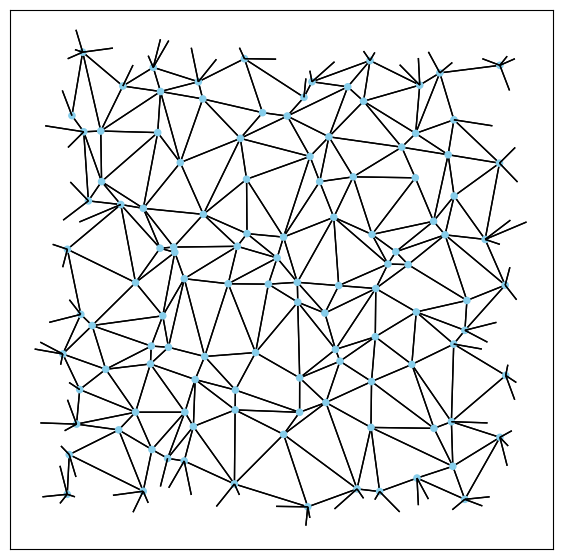

Epoch:  11 | p loss: 1.148e-01 | dist loss: 3.297e-02 | angle loss: 8.083e-01 | rmsd: 0.338 | rmsd loss: 0.380 | curr p: 0.039
Epoch:  12 | p loss: 1.161e-01 | dist loss: 1.622e-02 | angle loss: 9.218e-02 | rmsd: 0.341 | rmsd loss: 0.406 | curr p: 0.041
Epoch:  13 | p loss: 1.202e-01 | dist loss: 2.693e-03 | angle loss: 3.011e-03 | rmsd: 0.338 | rmsd loss: 0.377 | curr p: 0.047
Epoch:  14 | p loss: 1.343e-01 | dist loss: 0.000e+00 | angle loss: 3.309e-04 | rmsd: 0.324 | rmsd loss: 0.241 | curr p: 0.066
Epoch:  15 | p loss: 1.536e-01 | dist loss: 0.000e+00 | angle loss: 3.973e-05 | rmsd: 0.304 | rmsd loss: 0.044 | curr p: 0.092
Epoch:  16 | p loss: 1.693e-01 | dist loss: 0.000e+00 | angle loss: 4.455e-06 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: 0.112
Epoch:  17 | p loss: 1.803e-01 | dist loss: 0.000e+00 | angle loss: 1.035e-06 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: 0.125
Epoch:  18 | p loss: 1.890e-01 | dist loss: 0.000e+00 | angle loss: 3.595e-07 | rmsd: 0.245 | rmsd loss: 0.000 

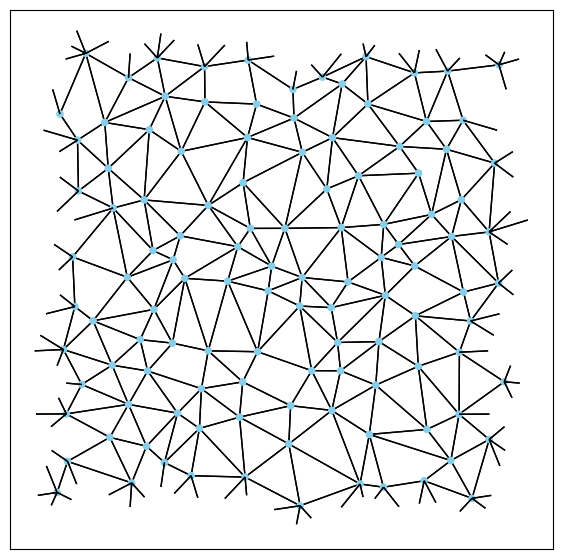

Epoch:  21 | p loss: 1.983e-01 | dist loss: 0.000e+00 | angle loss: 3.989e-07 | rmsd: 0.217 | rmsd loss: 0.000 | curr p: 0.145
Epoch:  22 | p loss: 1.942e-01 | dist loss: 0.000e+00 | angle loss: 6.266e-06 | rmsd: 0.213 | rmsd loss: 0.000 | curr p: 0.141
Epoch:  23 | p loss: 1.880e-01 | dist loss: 0.000e+00 | angle loss: 2.105e-04 | rmsd: 0.213 | rmsd loss: 0.000 | curr p: 0.134
Epoch:  24 | p loss: 1.822e-01 | dist loss: 0.000e+00 | angle loss: 3.202e-03 | rmsd: 0.215 | rmsd loss: 0.000 | curr p: 0.127
Epoch:  25 | p loss: 1.843e-01 | dist loss: 0.000e+00 | angle loss: 6.506e-03 | rmsd: 0.220 | rmsd loss: 0.000 | curr p: 0.129
Epoch:  26 | p loss: 1.888e-01 | dist loss: 0.000e+00 | angle loss: 8.832e-04 | rmsd: 0.226 | rmsd loss: 0.000 | curr p: 0.135
Epoch:  27 | p loss: 1.855e-01 | dist loss: 0.000e+00 | angle loss: 7.284e-03 | rmsd: 0.233 | rmsd loss: 0.000 | curr p: 0.131
Epoch:  28 | p loss: 1.852e-01 | dist loss: 0.000e+00 | angle loss: 1.521e-03 | rmsd: 0.240 | rmsd loss: 0.000 

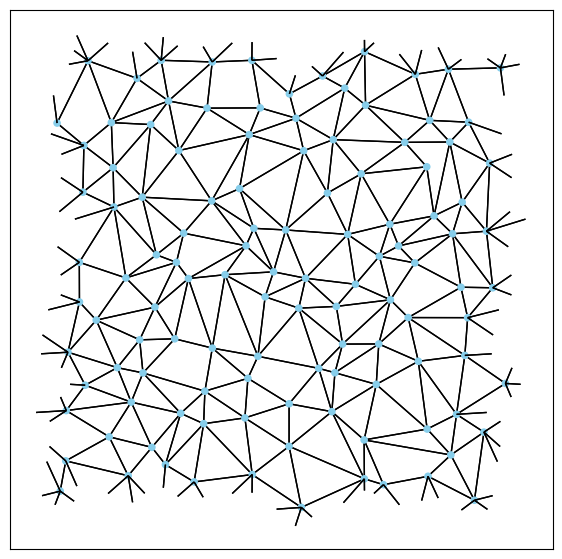

Epoch:  31 | p loss: 1.717e-01 | dist loss: 0.000e+00 | angle loss: 2.103e-03 | rmsd: 0.265 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  32 | p loss: 1.613e-01 | dist loss: 0.000e+00 | angle loss: 2.126e-03 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.102
Epoch:  33 | p loss: 1.575e-01 | dist loss: 0.000e+00 | angle loss: 1.499e-02 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: 0.097
Epoch:  34 | p loss: 1.552e-01 | dist loss: 0.000e+00 | angle loss: 1.183e-02 | rmsd: 0.298 | rmsd loss: 0.000 | curr p: 0.094
Epoch:  35 | p loss: 1.520e-01 | dist loss: 0.000e+00 | angle loss: 1.706e-02 | rmsd: 0.309 | rmsd loss: 0.091 | curr p: 0.090
Epoch:  36 | p loss: 1.518e-01 | dist loss: 0.000e+00 | angle loss: 1.084e-02 | rmsd: 0.315 | rmsd loss: 0.148 | curr p: 0.090
Epoch:  37 | p loss: 1.516e-01 | dist loss: 0.000e+00 | angle loss: 5.212e-03 | rmsd: 0.314 | rmsd loss: 0.140 | curr p: 0.089
Epoch:  38 | p loss: 1.555e-01 | dist loss: 0.000e+00 | angle loss: 1.109e-03 | rmsd: 0.307 | rmsd loss: 0.072 

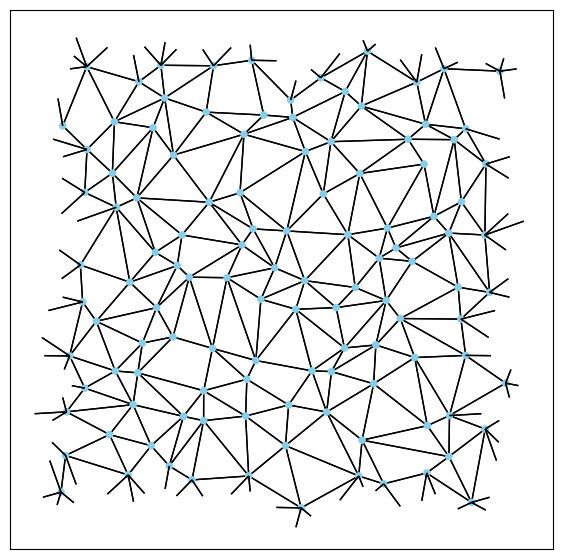

Epoch:  41 | p loss: 1.697e-01 | dist loss: 0.000e+00 | angle loss: 6.691e-05 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.112
Epoch:  42 | p loss: 1.708e-01 | dist loss: 0.000e+00 | angle loss: 1.216e-04 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.113
Epoch:  43 | p loss: 1.703e-01 | dist loss: 0.000e+00 | angle loss: 4.567e-04 | rmsd: 0.273 | rmsd loss: 0.000 | curr p: 0.113
Epoch:  44 | p loss: 1.688e-01 | dist loss: 0.000e+00 | angle loss: 2.579e-03 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.111
Epoch:  45 | p loss: 1.663e-01 | dist loss: 0.000e+00 | angle loss: 5.926e-03 | rmsd: 0.276 | rmsd loss: 0.000 | curr p: 0.108
Epoch:  46 | p loss: 1.634e-01 | dist loss: 0.000e+00 | angle loss: 2.318e-03 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.104
Epoch:  47 | p loss: 1.611e-01 | dist loss: 0.000e+00 | angle loss: 4.049e-03 | rmsd: 0.284 | rmsd loss: 0.000 | curr p: 0.101
Epoch:  48 | p loss: 1.595e-01 | dist loss: 0.000e+00 | angle loss: 7.313e-03 | rmsd: 0.291 | rmsd loss: 0.000 

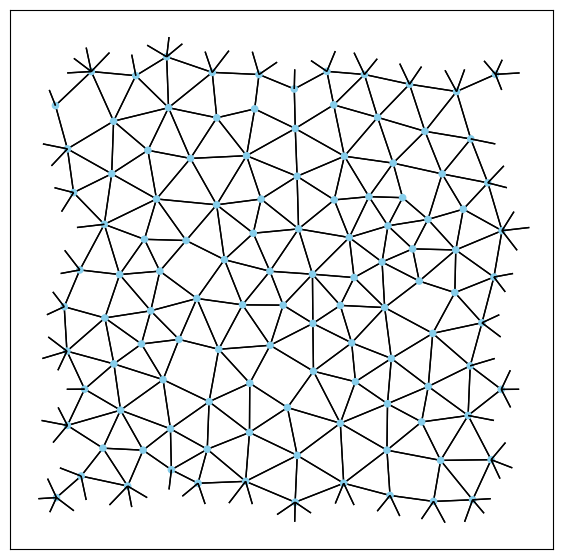

Epoch:   1 | p loss: 3.430e-01 | dist loss: 0.000e+00 | angle loss: 1.921e-16 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.286
Epoch:   2 | p loss: 2.412e-01 | dist loss: 0.000e+00 | angle loss: 2.523e-10 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.191
Epoch:   3 | p loss: 2.233e-01 | dist loss: 0.000e+00 | angle loss: 3.820e-05 | rmsd: 0.144 | rmsd loss: 0.000 | curr p: 0.173
Epoch:   4 | p loss: 2.013e-01 | dist loss: 0.000e+00 | angle loss: 3.118e-01 | rmsd: 0.183 | rmsd loss: 0.000 | curr p: 0.149
Epoch:   5 | p loss: 1.807e-01 | dist loss: 0.000e+00 | angle loss: 1.330e-02 | rmsd: 0.214 | rmsd loss: 0.000 | curr p: 0.125
Epoch:   6 | p loss: 1.697e-01 | dist loss: 0.000e+00 | angle loss: 5.417e-02 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: 0.112
Epoch:   7 | p loss: 1.704e-01 | dist loss: 0.000e+00 | angle loss: 1.471e-03 | rmsd: 0.262 | rmsd loss: 0.000 | curr p: 0.113
Epoch:   8 | p loss: 1.713e-01 | dist loss: 0.000e+00 | angle loss: 5.553e-02 | rmsd: 0.284 | rmsd loss: 0.000 

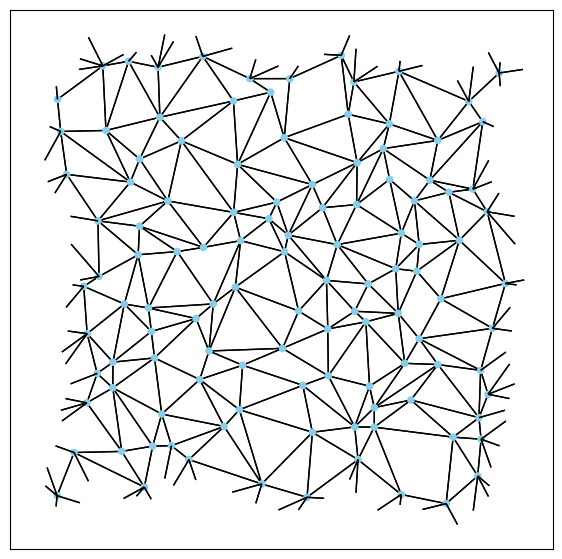

Epoch:  11 | p loss: 1.563e-01 | dist loss: 0.000e+00 | angle loss: 1.206e-01 | rmsd: 0.321 | rmsd loss: 0.210 | curr p: 0.095
Epoch:  12 | p loss: 1.587e-01 | dist loss: 0.000e+00 | angle loss: 3.355e-02 | rmsd: 0.326 | rmsd loss: 0.261 | curr p: 0.098
Epoch:  13 | p loss: 1.568e-01 | dist loss: 0.000e+00 | angle loss: 3.832e-03 | rmsd: 0.326 | rmsd loss: 0.260 | curr p: 0.096
Epoch:  14 | p loss: 1.615e-01 | dist loss: 0.000e+00 | angle loss: 4.865e-04 | rmsd: 0.314 | rmsd loss: 0.142 | curr p: 0.102
Epoch:  15 | p loss: 1.732e-01 | dist loss: 0.000e+00 | angle loss: 1.099e-04 | rmsd: 0.295 | rmsd loss: 0.000 | curr p: 0.116
Epoch:  16 | p loss: 1.816e-01 | dist loss: 0.000e+00 | angle loss: 7.712e-05 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.126
Epoch:  17 | p loss: 1.870e-01 | dist loss: 0.000e+00 | angle loss: 5.373e-05 | rmsd: 0.270 | rmsd loss: 0.000 | curr p: 0.132
Epoch:  18 | p loss: 1.894e-01 | dist loss: 0.000e+00 | angle loss: 3.828e-05 | rmsd: 0.264 | rmsd loss: 0.000 

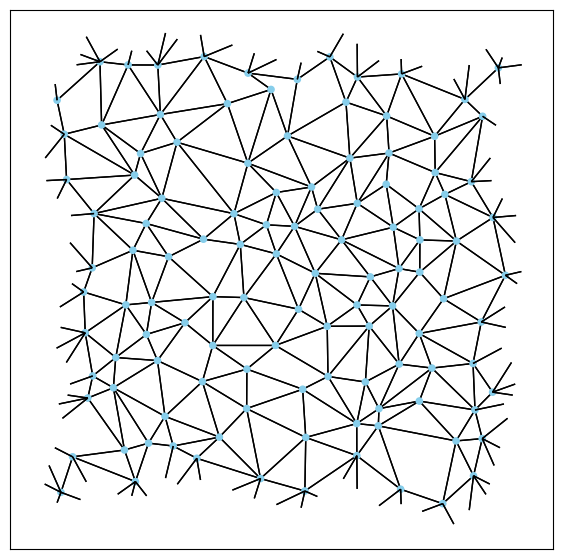

Epoch:  21 | p loss: 1.822e-01 | dist loss: 0.000e+00 | angle loss: 1.746e-04 | rmsd: 0.262 | rmsd loss: 0.000 | curr p: 0.127
Epoch:  22 | p loss: 1.747e-01 | dist loss: 0.000e+00 | angle loss: 1.472e-03 | rmsd: 0.268 | rmsd loss: 0.000 | curr p: 0.118
Epoch:  23 | p loss: 1.712e-01 | dist loss: 0.000e+00 | angle loss: 3.220e-03 | rmsd: 0.276 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  24 | p loss: 1.680e-01 | dist loss: 0.000e+00 | angle loss: 5.100e-03 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.110
Epoch:  25 | p loss: 1.639e-01 | dist loss: 0.000e+00 | angle loss: 5.004e-03 | rmsd: 0.298 | rmsd loss: 0.000 | curr p: 0.105
Epoch:  26 | p loss: 1.566e-01 | dist loss: 0.000e+00 | angle loss: 8.374e-03 | rmsd: 0.312 | rmsd loss: 0.116 | curr p: 0.096
Epoch:  27 | p loss: 1.552e-01 | dist loss: 0.000e+00 | angle loss: 4.593e-03 | rmsd: 0.316 | rmsd loss: 0.159 | curr p: 0.094
Epoch:  28 | p loss: 1.597e-01 | dist loss: 0.000e+00 | angle loss: 5.988e-04 | rmsd: 0.312 | rmsd loss: 0.119 

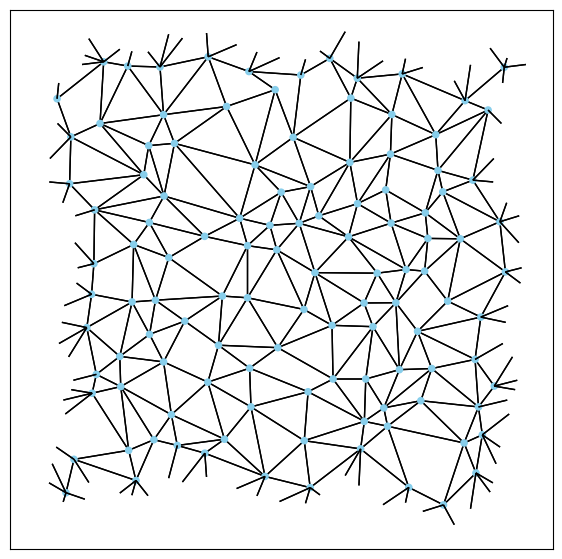

Epoch:  31 | p loss: 1.838e-01 | dist loss: 0.000e+00 | angle loss: 1.742e-05 | rmsd: 0.272 | rmsd loss: 0.000 | curr p: 0.129
Epoch:  32 | p loss: 1.891e-01 | dist loss: 0.000e+00 | angle loss: 1.350e-05 | rmsd: 0.261 | rmsd loss: 0.000 | curr p: 0.135
Epoch:  33 | p loss: 1.938e-01 | dist loss: 0.000e+00 | angle loss: 1.257e-05 | rmsd: 0.252 | rmsd loss: 0.000 | curr p: 0.140
Epoch:  34 | p loss: 1.967e-01 | dist loss: 0.000e+00 | angle loss: 1.380e-05 | rmsd: 0.246 | rmsd loss: 0.000 | curr p: 0.144
Epoch:  35 | p loss: 1.984e-01 | dist loss: 0.000e+00 | angle loss: 1.730e-05 | rmsd: 0.241 | rmsd loss: 0.000 | curr p: 0.145
Epoch:  36 | p loss: 1.992e-01 | dist loss: 0.000e+00 | angle loss: 2.380e-05 | rmsd: 0.238 | rmsd loss: 0.000 | curr p: 0.146
Epoch:  37 | p loss: 1.993e-01 | dist loss: 0.000e+00 | angle loss: 3.464e-05 | rmsd: 0.237 | rmsd loss: 0.000 | curr p: 0.146
Epoch:  38 | p loss: 1.989e-01 | dist loss: 0.000e+00 | angle loss: 5.058e-05 | rmsd: 0.237 | rmsd loss: 0.000 

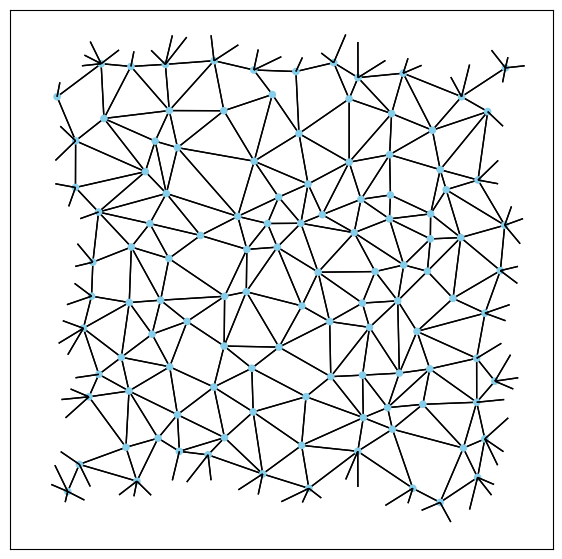

Epoch:  41 | p loss: 1.940e-01 | dist loss: 0.000e+00 | angle loss: 9.854e-05 | rmsd: 0.244 | rmsd loss: 0.000 | curr p: 0.140
Epoch:  42 | p loss: 1.912e-01 | dist loss: 0.000e+00 | angle loss: 1.642e-04 | rmsd: 0.248 | rmsd loss: 0.000 | curr p: 0.137
Epoch:  43 | p loss: 1.879e-01 | dist loss: 0.000e+00 | angle loss: 5.934e-04 | rmsd: 0.253 | rmsd loss: 0.000 | curr p: 0.133
Epoch:  44 | p loss: 1.845e-01 | dist loss: 0.000e+00 | angle loss: 6.004e-04 | rmsd: 0.259 | rmsd loss: 0.000 | curr p: 0.130
Epoch:  45 | p loss: 1.796e-01 | dist loss: 0.000e+00 | angle loss: 7.719e-04 | rmsd: 0.265 | rmsd loss: 0.000 | curr p: 0.124
Epoch:  46 | p loss: 1.725e-01 | dist loss: 0.000e+00 | angle loss: 2.643e-03 | rmsd: 0.272 | rmsd loss: 0.000 | curr p: 0.115
Epoch:  47 | p loss: 1.629e-01 | dist loss: 0.000e+00 | angle loss: 6.918e-04 | rmsd: 0.281 | rmsd loss: 0.000 | curr p: 0.104
Epoch:  48 | p loss: 1.497e-01 | dist loss: 0.000e+00 | angle loss: 1.199e-03 | rmsd: 0.291 | rmsd loss: 0.000 

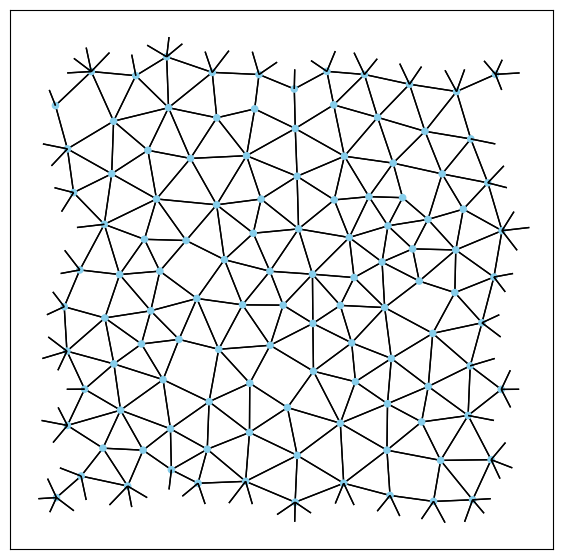

Epoch:   1 | p loss: 3.038e-01 | dist loss: 0.000e+00 | angle loss: 5.866e-17 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.251
Epoch:   2 | p loss: 2.428e-01 | dist loss: 0.000e+00 | angle loss: 4.371e-10 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.193
Epoch:   3 | p loss: 2.228e-01 | dist loss: 0.000e+00 | angle loss: 8.248e-04 | rmsd: 0.142 | rmsd loss: 0.000 | curr p: 0.172
Epoch:   4 | p loss: 2.021e-01 | dist loss: 0.000e+00 | angle loss: 1.263e-02 | rmsd: 0.179 | rmsd loss: 0.000 | curr p: 0.150
Epoch:   5 | p loss: 1.932e-01 | dist loss: 0.000e+00 | angle loss: 1.129e+00 | rmsd: 0.211 | rmsd loss: 0.000 | curr p: 0.140
Epoch:   6 | p loss: 1.816e-01 | dist loss: 0.000e+00 | angle loss: 1.336e+00 | rmsd: 0.237 | rmsd loss: 0.000 | curr p: 0.126
Epoch:   7 | p loss: 1.665e-01 | dist loss: 0.000e+00 | angle loss: 6.010e-01 | rmsd: 0.256 | rmsd loss: 0.000 | curr p: 0.108
Epoch:   8 | p loss: 1.512e-01 | dist loss: 0.000e+00 | angle loss: 2.647e-01 | rmsd: 0.273 | rmsd loss: 0.000 

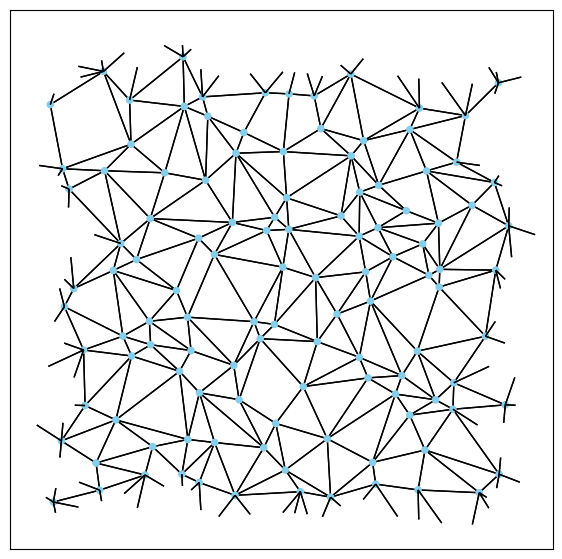

Epoch:  11 | p loss: 1.391e-01 | dist loss: 1.163e-03 | angle loss: 4.431e-03 | rmsd: 0.300 | rmsd loss: 0.000 | curr p: 0.073
Epoch:  12 | p loss: 1.444e-01 | dist loss: 0.000e+00 | angle loss: 5.456e-03 | rmsd: 0.309 | rmsd loss: 0.093 | curr p: 0.080
Epoch:  13 | p loss: 1.473e-01 | dist loss: 0.000e+00 | angle loss: 2.389e-03 | rmsd: 0.302 | rmsd loss: 0.017 | curr p: 0.084
Epoch:  14 | p loss: 1.543e-01 | dist loss: 0.000e+00 | angle loss: 5.134e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.093
Epoch:  15 | p loss: 1.591e-01 | dist loss: 0.000e+00 | angle loss: 1.008e-04 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.099
Epoch:  16 | p loss: 1.614e-01 | dist loss: 0.000e+00 | angle loss: 2.467e-05 | rmsd: 0.267 | rmsd loss: 0.000 | curr p: 0.102
Epoch:  17 | p loss: 1.621e-01 | dist loss: 0.000e+00 | angle loss: 8.623e-06 | rmsd: 0.264 | rmsd loss: 0.000 | curr p: 0.103
Epoch:  18 | p loss: 1.607e-01 | dist loss: 0.000e+00 | angle loss: 5.979e-06 | rmsd: 0.263 | rmsd loss: 0.000 

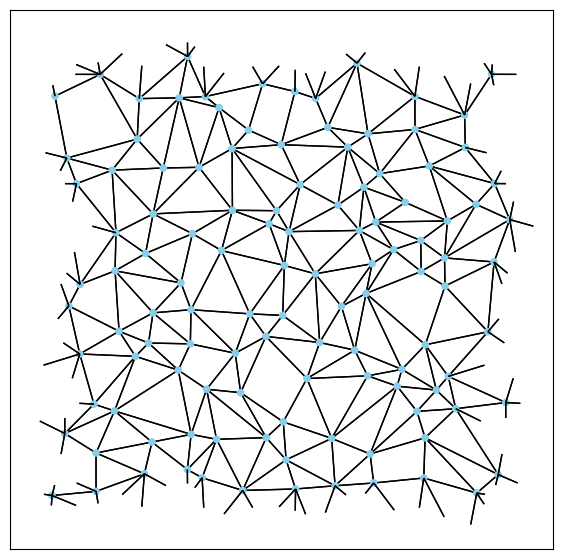

Epoch:  21 | p loss: 1.483e-01 | dist loss: 0.000e+00 | angle loss: 1.150e-03 | rmsd: 0.278 | rmsd loss: 0.000 | curr p: 0.085
Epoch:  22 | p loss: 1.445e-01 | dist loss: 0.000e+00 | angle loss: 4.374e-03 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.080
Epoch:  23 | p loss: 1.380e-01 | dist loss: 0.000e+00 | angle loss: 1.277e-02 | rmsd: 0.295 | rmsd loss: 0.000 | curr p: 0.071
Epoch:  24 | p loss: 1.322e-01 | dist loss: 0.000e+00 | angle loss: 9.753e-03 | rmsd: 0.303 | rmsd loss: 0.032 | curr p: 0.064
Epoch:  25 | p loss: 1.363e-01 | dist loss: 0.000e+00 | angle loss: 1.954e-03 | rmsd: 0.304 | rmsd loss: 0.035 | curr p: 0.069
Epoch:  26 | p loss: 1.430e-01 | dist loss: 0.000e+00 | angle loss: 2.137e-04 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.078
Epoch:  27 | p loss: 1.486e-01 | dist loss: 0.000e+00 | angle loss: 3.270e-04 | rmsd: 0.291 | rmsd loss: 0.000 | curr p: 0.085
Epoch:  28 | p loss: 1.511e-01 | dist loss: 0.000e+00 | angle loss: 1.050e-03 | rmsd: 0.289 | rmsd loss: 0.000 

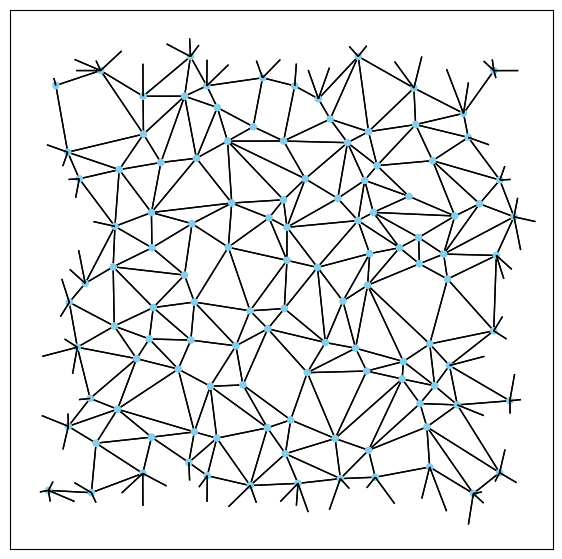

Epoch:  31 | p loss: 1.460e-01 | dist loss: 0.000e+00 | angle loss: 9.423e-04 | rmsd: 0.295 | rmsd loss: 0.000 | curr p: 0.082
Epoch:  32 | p loss: 1.450e-01 | dist loss: 0.000e+00 | angle loss: 2.450e-03 | rmsd: 0.302 | rmsd loss: 0.017 | curr p: 0.081
Epoch:  33 | p loss: 1.476e-01 | dist loss: 0.000e+00 | angle loss: 1.669e-03 | rmsd: 0.300 | rmsd loss: 0.002 | curr p: 0.084
Epoch:  34 | p loss: 1.525e-01 | dist loss: 0.000e+00 | angle loss: 4.854e-04 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.090
Epoch:  35 | p loss: 1.556e-01 | dist loss: 0.000e+00 | angle loss: 2.076e-04 | rmsd: 0.286 | rmsd loss: 0.000 | curr p: 0.094
Epoch:  36 | p loss: 1.574e-01 | dist loss: 0.000e+00 | angle loss: 1.494e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: 0.097
Epoch:  37 | p loss: 1.582e-01 | dist loss: 0.000e+00 | angle loss: 2.039e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.098
Epoch:  38 | p loss: 1.580e-01 | dist loss: 0.000e+00 | angle loss: 3.420e-04 | rmsd: 0.278 | rmsd loss: 0.000 

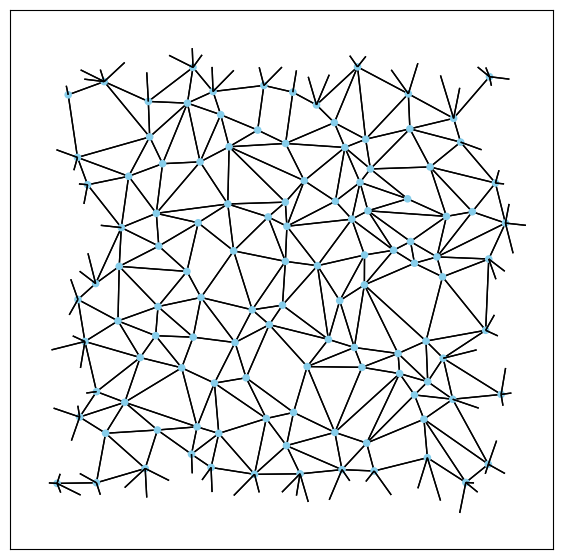

Epoch:  41 | p loss: 1.517e-01 | dist loss: 0.000e+00 | angle loss: 9.320e-04 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: 0.090
Epoch:  42 | p loss: 1.483e-01 | dist loss: 0.000e+00 | angle loss: 2.181e-03 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: 0.085
Epoch:  43 | p loss: 1.450e-01 | dist loss: 0.000e+00 | angle loss: 2.555e-03 | rmsd: 0.293 | rmsd loss: 0.000 | curr p: 0.081
Epoch:  44 | p loss: 1.409e-01 | dist loss: 0.000e+00 | angle loss: 4.174e-03 | rmsd: 0.299 | rmsd loss: 0.000 | curr p: 0.075
Epoch:  45 | p loss: 1.356e-01 | dist loss: 0.000e+00 | angle loss: 6.918e-03 | rmsd: 0.306 | rmsd loss: 0.059 | curr p: 0.068
Epoch:  46 | p loss: 1.360e-01 | dist loss: 0.000e+00 | angle loss: 2.185e-03 | rmsd: 0.306 | rmsd loss: 0.056 | curr p: 0.069
Epoch:  47 | p loss: 1.385e-01 | dist loss: 0.000e+00 | angle loss: 5.087e-04 | rmsd: 0.299 | rmsd loss: 0.000 | curr p: 0.072
Epoch:  48 | p loss: 1.398e-01 | dist loss: 0.000e+00 | angle loss: 3.594e-04 | rmsd: 0.294 | rmsd loss: 0.000 

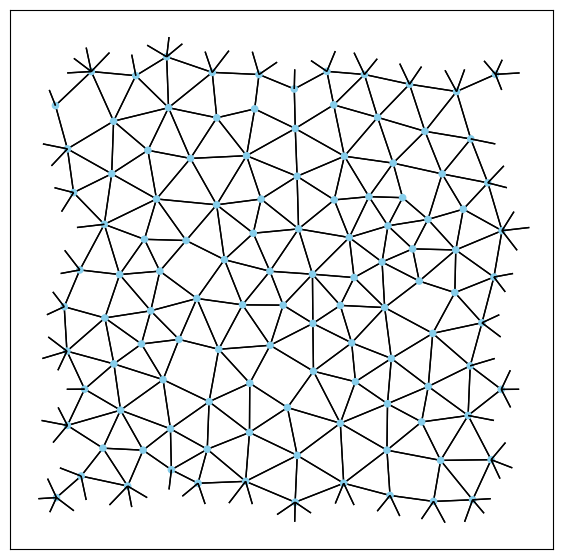

Epoch:   1 | p loss: 3.463e-01 | dist loss: 0.000e+00 | angle loss: 5.693e-21 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.288
Epoch:   2 | p loss: 2.446e-01 | dist loss: 0.000e+00 | angle loss: 5.682e-16 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.195
Epoch:   3 | p loss: 2.291e-01 | dist loss: 0.000e+00 | angle loss: 7.271e-11 | rmsd: 0.143 | rmsd loss: 0.000 | curr p: 0.179
Epoch:   4 | p loss: 2.014e-01 | dist loss: 0.000e+00 | angle loss: 1.512e-05 | rmsd: 0.182 | rmsd loss: 0.000 | curr p: 0.149
Epoch:   5 | p loss: 1.781e-01 | dist loss: 0.000e+00 | angle loss: 5.116e-01 | rmsd: 0.220 | rmsd loss: 0.000 | curr p: 0.122
Epoch:   6 | p loss: 1.709e-01 | dist loss: 0.000e+00 | angle loss: 2.240e-02 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: 0.113
Epoch:   7 | p loss: 1.568e-01 | dist loss: 0.000e+00 | angle loss: 1.358e+00 | rmsd: 0.278 | rmsd loss: 0.000 | curr p: 0.096
Epoch:   8 | p loss: 1.461e-01 | dist loss: 9.064e-04 | angle loss: 5.862e+00 | rmsd: 0.299 | rmsd loss: 0.000 

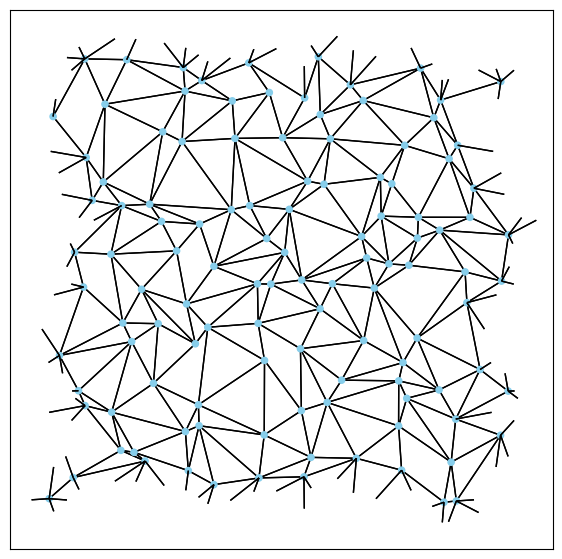

Epoch:  11 | p loss: 1.331e-01 | dist loss: 0.000e+00 | angle loss: 1.023e+00 | rmsd: 0.330 | rmsd loss: 0.296 | curr p: 0.065
Epoch:  12 | p loss: 1.365e-01 | dist loss: 0.000e+00 | angle loss: 1.715e-01 | rmsd: 0.332 | rmsd loss: 0.318 | curr p: 0.070
Epoch:  13 | p loss: 1.427e-01 | dist loss: 0.000e+00 | angle loss: 1.558e-02 | rmsd: 0.329 | rmsd loss: 0.295 | curr p: 0.078
Epoch:  14 | p loss: 1.535e-01 | dist loss: 0.000e+00 | angle loss: 9.118e-04 | rmsd: 0.317 | rmsd loss: 0.172 | curr p: 0.092
Epoch:  15 | p loss: 1.655e-01 | dist loss: 0.000e+00 | angle loss: 1.427e-04 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.107
Epoch:  16 | p loss: 1.740e-01 | dist loss: 0.000e+00 | angle loss: 7.995e-05 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: 0.117
Epoch:  17 | p loss: 1.801e-01 | dist loss: 0.000e+00 | angle loss: 7.626e-05 | rmsd: 0.272 | rmsd loss: 0.000 | curr p: 0.124
Epoch:  18 | p loss: 1.835e-01 | dist loss: 0.000e+00 | angle loss: 9.440e-05 | rmsd: 0.265 | rmsd loss: 0.000 

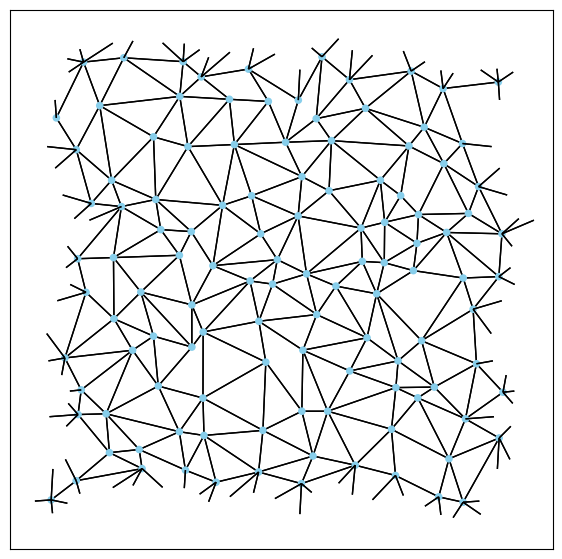

Epoch:  21 | p loss: 1.851e-01 | dist loss: 0.000e+00 | angle loss: 2.148e-04 | rmsd: 0.260 | rmsd loss: 0.000 | curr p: 0.130
Epoch:  22 | p loss: 1.817e-01 | dist loss: 0.000e+00 | angle loss: 2.650e-04 | rmsd: 0.263 | rmsd loss: 0.000 | curr p: 0.126
Epoch:  23 | p loss: 1.772e-01 | dist loss: 0.000e+00 | angle loss: 1.491e-03 | rmsd: 0.268 | rmsd loss: 0.000 | curr p: 0.121
Epoch:  24 | p loss: 1.745e-01 | dist loss: 0.000e+00 | angle loss: 1.893e-03 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.118
Epoch:  25 | p loss: 1.728e-01 | dist loss: 0.000e+00 | angle loss: 1.432e-03 | rmsd: 0.283 | rmsd loss: 0.000 | curr p: 0.116
Epoch:  26 | p loss: 1.700e-01 | dist loss: 0.000e+00 | angle loss: 1.865e-03 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.112
Epoch:  27 | p loss: 1.661e-01 | dist loss: 0.000e+00 | angle loss: 1.283e-03 | rmsd: 0.302 | rmsd loss: 0.021 | curr p: 0.108
Epoch:  28 | p loss: 1.673e-01 | dist loss: 0.000e+00 | angle loss: 5.749e-04 | rmsd: 0.301 | rmsd loss: 0.008 

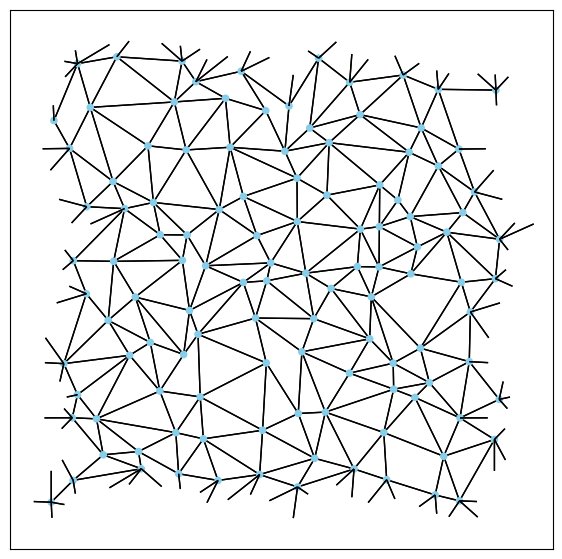

Epoch:  31 | p loss: 1.723e-01 | dist loss: 0.000e+00 | angle loss: 2.839e-05 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: 0.115
Epoch:  32 | p loss: 1.709e-01 | dist loss: 0.000e+00 | angle loss: 5.190e-05 | rmsd: 0.278 | rmsd loss: 0.000 | curr p: 0.113
Epoch:  33 | p loss: 1.682e-01 | dist loss: 0.000e+00 | angle loss: 1.858e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.110
Epoch:  34 | p loss: 1.637e-01 | dist loss: 0.000e+00 | angle loss: 7.363e-04 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: 0.105
Epoch:  35 | p loss: 1.575e-01 | dist loss: 0.000e+00 | angle loss: 1.542e-03 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: 0.097
Epoch:  36 | p loss: 1.494e-01 | dist loss: 0.000e+00 | angle loss: 7.996e-03 | rmsd: 0.296 | rmsd loss: 0.000 | curr p: 0.087
Epoch:  37 | p loss: 1.418e-01 | dist loss: 0.000e+00 | angle loss: 1.062e-02 | rmsd: 0.304 | rmsd loss: 0.045 | curr p: 0.077
Epoch:  38 | p loss: 1.417e-01 | dist loss: 0.000e+00 | angle loss: 4.287e-03 | rmsd: 0.306 | rmsd loss: 0.065 

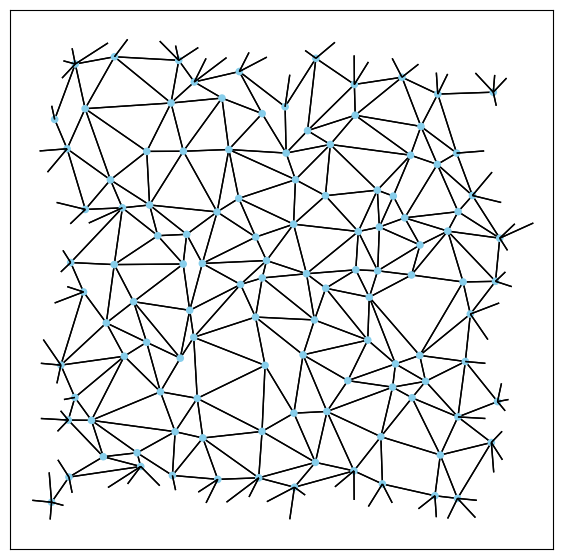

Epoch:  41 | p loss: 1.549e-01 | dist loss: 0.000e+00 | angle loss: 4.809e-04 | rmsd: 0.287 | rmsd loss: 0.000 | curr p: 0.094
Epoch:  42 | p loss: 1.561e-01 | dist loss: 0.000e+00 | angle loss: 8.767e-04 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.095
Epoch:  43 | p loss: 1.550e-01 | dist loss: 0.000e+00 | angle loss: 1.363e-03 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.094
Epoch:  44 | p loss: 1.523e-01 | dist loss: 0.000e+00 | angle loss: 1.885e-03 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: 0.090
Epoch:  45 | p loss: 1.488e-01 | dist loss: 0.000e+00 | angle loss: 2.651e-03 | rmsd: 0.294 | rmsd loss: 0.000 | curr p: 0.086
Epoch:  46 | p loss: 1.464e-01 | dist loss: 0.000e+00 | angle loss: 2.049e-03 | rmsd: 0.302 | rmsd loss: 0.022 | curr p: 0.083
Epoch:  47 | p loss: 1.468e-01 | dist loss: 0.000e+00 | angle loss: 9.221e-04 | rmsd: 0.302 | rmsd loss: 0.023 | curr p: 0.083
Epoch:  48 | p loss: 1.494e-01 | dist loss: 0.000e+00 | angle loss: 4.009e-04 | rmsd: 0.296 | rmsd loss: 0.000 

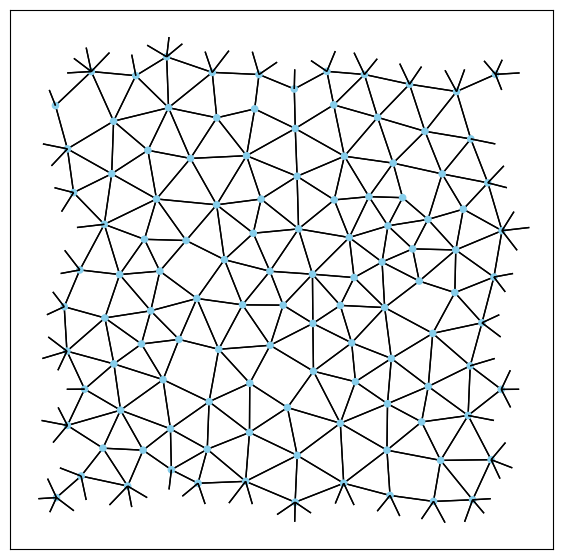

Epoch:   1 | p loss: 3.818e-01 | dist loss: 0.000e+00 | angle loss: 5.760e-18 | rmsd: 0.050 | rmsd loss: 0.000 | curr p: 0.318
Epoch:   2 | p loss: 2.403e-01 | dist loss: 0.000e+00 | angle loss: 8.135e-13 | rmsd: 0.100 | rmsd loss: 0.000 | curr p: 0.190
Epoch:   3 | p loss: 2.184e-01 | dist loss: 0.000e+00 | angle loss: 8.463e-08 | rmsd: 0.145 | rmsd loss: 0.000 | curr p: 0.167
Epoch:   4 | p loss: 1.941e-01 | dist loss: 0.000e+00 | angle loss: 2.629e-03 | rmsd: 0.186 | rmsd loss: 0.000 | curr p: 0.141
Epoch:   5 | p loss: 1.710e-01 | dist loss: 0.000e+00 | angle loss: 2.478e-01 | rmsd: 0.222 | rmsd loss: 0.000 | curr p: 0.114
Epoch:   6 | p loss: 1.628e-01 | dist loss: 0.000e+00 | angle loss: 7.907e+00 | rmsd: 0.251 | rmsd loss: 0.000 | curr p: 0.103
Epoch:   7 | p loss: 1.533e-01 | dist loss: 0.000e+00 | angle loss: 7.372e-01 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.091
Epoch:   8 | p loss: 1.484e-01 | dist loss: 0.000e+00 | angle loss: 9.547e-01 | rmsd: 0.291 | rmsd loss: 0.000 

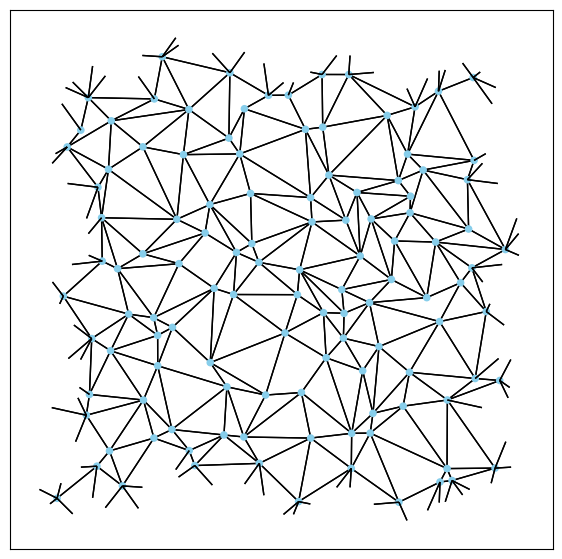

Epoch:  11 | p loss: 1.349e-01 | dist loss: 1.322e-04 | angle loss: 1.407e-01 | rmsd: 0.318 | rmsd loss: 0.183 | curr p: 0.067
Epoch:  12 | p loss: 1.363e-01 | dist loss: 0.000e+00 | angle loss: 1.803e-02 | rmsd: 0.319 | rmsd loss: 0.192 | curr p: 0.069
Epoch:  13 | p loss: 1.412e-01 | dist loss: 0.000e+00 | angle loss: 1.093e-03 | rmsd: 0.311 | rmsd loss: 0.107 | curr p: 0.076
Epoch:  14 | p loss: 1.523e-01 | dist loss: 0.000e+00 | angle loss: 1.369e-04 | rmsd: 0.294 | rmsd loss: 0.000 | curr p: 0.090
Epoch:  15 | p loss: 1.597e-01 | dist loss: 0.000e+00 | angle loss: 2.856e-05 | rmsd: 0.282 | rmsd loss: 0.000 | curr p: 0.100
Epoch:  16 | p loss: 1.622e-01 | dist loss: 0.000e+00 | angle loss: 7.570e-06 | rmsd: 0.273 | rmsd loss: 0.000 | curr p: 0.103
Epoch:  17 | p loss: 1.616e-01 | dist loss: 0.000e+00 | angle loss: 3.191e-06 | rmsd: 0.268 | rmsd loss: 0.000 | curr p: 0.102
Epoch:  18 | p loss: 1.595e-01 | dist loss: 0.000e+00 | angle loss: 3.526e-06 | rmsd: 0.266 | rmsd loss: 0.000 

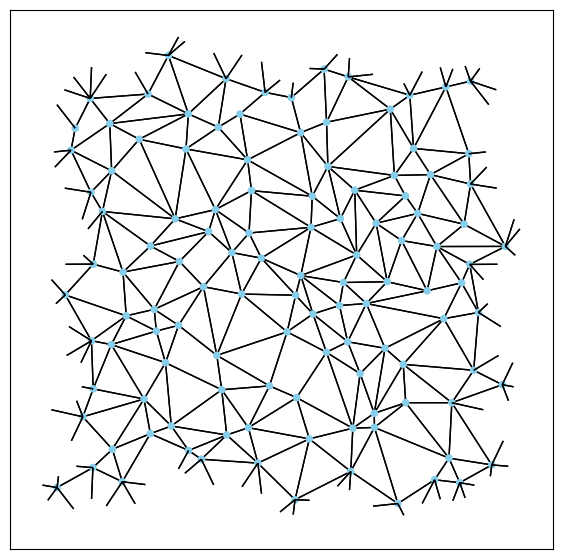

Epoch:  21 | p loss: 1.354e-01 | dist loss: 5.682e-04 | angle loss: 2.717e-03 | rmsd: 0.278 | rmsd loss: 0.000 | curr p: 0.068
Epoch:  22 | p loss: 1.407e-01 | dist loss: 0.000e+00 | angle loss: 1.173e-02 | rmsd: 0.288 | rmsd loss: 0.000 | curr p: 0.075
Epoch:  23 | p loss: 1.464e-01 | dist loss: 0.000e+00 | angle loss: 9.109e-03 | rmsd: 0.297 | rmsd loss: 0.000 | curr p: 0.083
Epoch:  24 | p loss: 1.497e-01 | dist loss: 0.000e+00 | angle loss: 1.626e-02 | rmsd: 0.306 | rmsd loss: 0.063 | curr p: 0.087
Epoch:  25 | p loss: 1.545e-01 | dist loss: 0.000e+00 | angle loss: 4.746e-03 | rmsd: 0.309 | rmsd loss: 0.092 | curr p: 0.093
Epoch:  26 | p loss: 1.608e-01 | dist loss: 0.000e+00 | angle loss: 5.047e-04 | rmsd: 0.304 | rmsd loss: 0.044 | curr p: 0.101
Epoch:  27 | p loss: 1.682e-01 | dist loss: 0.000e+00 | angle loss: 7.554e-05 | rmsd: 0.293 | rmsd loss: 0.000 | curr p: 0.110
Epoch:  28 | p loss: 1.746e-01 | dist loss: 0.000e+00 | angle loss: 2.256e-05 | rmsd: 0.284 | rmsd loss: 0.000 

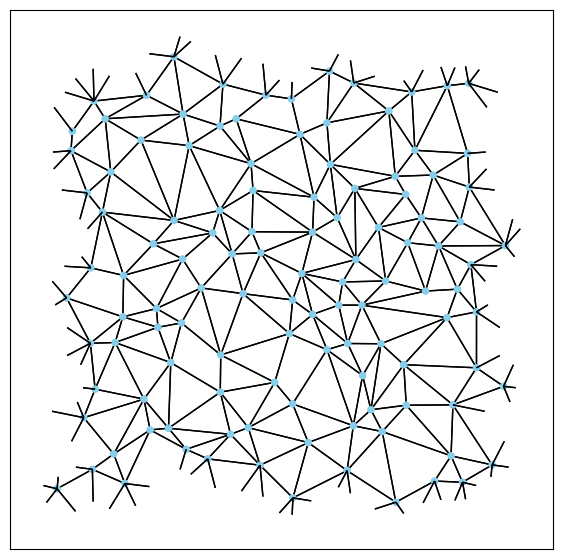

Epoch:  31 | p loss: 1.807e-01 | dist loss: 0.000e+00 | angle loss: 2.640e-05 | rmsd: 0.269 | rmsd loss: 0.000 | curr p: 0.125
Epoch:  32 | p loss: 1.792e-01 | dist loss: 0.000e+00 | angle loss: 1.257e-04 | rmsd: 0.269 | rmsd loss: 0.000 | curr p: 0.123
Epoch:  33 | p loss: 1.769e-01 | dist loss: 0.000e+00 | angle loss: 6.852e-04 | rmsd: 0.270 | rmsd loss: 0.000 | curr p: 0.121
Epoch:  34 | p loss: 1.750e-01 | dist loss: 0.000e+00 | angle loss: 1.644e-03 | rmsd: 0.274 | rmsd loss: 0.000 | curr p: 0.118
Epoch:  35 | p loss: 1.717e-01 | dist loss: 0.000e+00 | angle loss: 1.394e-03 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.114
Epoch:  36 | p loss: 1.641e-01 | dist loss: 0.000e+00 | angle loss: 2.845e-03 | rmsd: 0.285 | rmsd loss: 0.000 | curr p: 0.105
Epoch:  37 | p loss: 1.579e-01 | dist loss: 0.000e+00 | angle loss: 2.912e-03 | rmsd: 0.292 | rmsd loss: 0.000 | curr p: 0.097
Epoch:  38 | p loss: 1.524e-01 | dist loss: 0.000e+00 | angle loss: 2.811e-03 | rmsd: 0.300 | rmsd loss: 0.000 

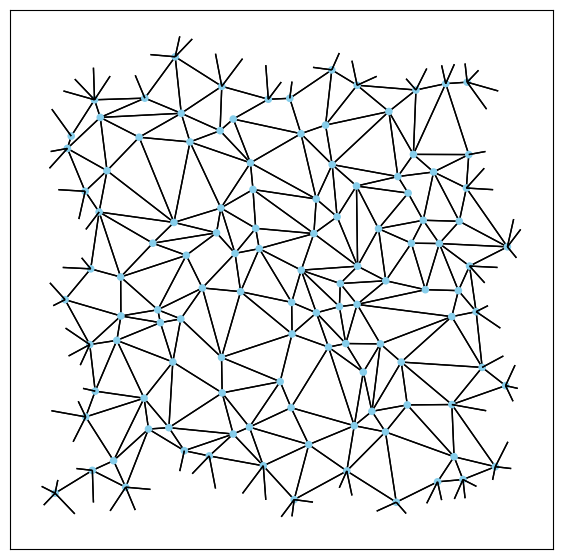

Epoch:  41 | p loss: 1.442e-01 | dist loss: 2.395e-07 | angle loss: 7.812e-05 | rmsd: 0.302 | rmsd loss: 0.017 | curr p: 0.080
Epoch:  42 | p loss: 1.518e-01 | dist loss: 0.000e+00 | angle loss: 2.163e-05 | rmsd: 0.289 | rmsd loss: 0.000 | curr p: 0.090
Epoch:  43 | p loss: 1.564e-01 | dist loss: 0.000e+00 | angle loss: 3.437e-05 | rmsd: 0.280 | rmsd loss: 0.000 | curr p: 0.095
Epoch:  44 | p loss: 1.578e-01 | dist loss: 0.000e+00 | angle loss: 1.447e-04 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.097
Epoch:  45 | p loss: 1.563e-01 | dist loss: 0.000e+00 | angle loss: 1.158e-03 | rmsd: 0.273 | rmsd loss: 0.000 | curr p: 0.095
Epoch:  46 | p loss: 1.526e-01 | dist loss: 6.262e-05 | angle loss: 3.196e-03 | rmsd: 0.275 | rmsd loss: 0.000 | curr p: 0.091
Epoch:  47 | p loss: 1.493e-01 | dist loss: 4.202e-04 | angle loss: 8.634e-04 | rmsd: 0.279 | rmsd loss: 0.000 | curr p: 0.086
Epoch:  48 | p loss: 1.496e-01 | dist loss: 5.917e-05 | angle loss: 8.782e-04 | rmsd: 0.285 | rmsd loss: 0.000 

In [ ]:
# Pick graph to optimize
initial_pratio = float("-inf")
while initial_pratio < 0.3:
    random_sim = random.sample(data["test"], k=1)[0]
    random_graph = random_sim[0]
    graph = deepcopy(random_graph)

    # Compute initial strain
    total_sim_strain = (random_sim[0].box_tensor[0] - random_sim[-1].box_tensor[0]) / random_sim[0].box_tensor[0]
    raw_index = int((target_strain / total_sim_strain) * len(random_sim))
    target_strain_index = min(max(raw_index, 0), len(random_sim) - 1)

    initial_pratio = calc_p_ratio_box_tensor(random_sim, target_strain_index).item()
print(f"Initial Poisson's ratio at {target_strain} strain: {initial_pratio}.")

# Pick mode
mode = 'gnn_guided'
epochs = 50
max_rmsd = 0.3
noise_multiplier = 10.0

def optimize_predictor(graph: Data, mode: str, epochs: int, max_rmsd: float, noise_multiplier: float = 20.0):

    results = {
        "loss": [],
        "p_loss": [],
        "ang_loss": [],
        "dist_loss": [],
        "rmsd_loss": [],
        "rmsd": [],
        "curr_p": [],
        "graphs": [],
    }

    angle_index = compute_angle_indices(graph.edge_index)
    with torch.no_grad():
        initial_angles = compute_angles(graph.x, angle_index, graph.box_tensor)

    # Init distance
    original_distances = graph.edge_attr[:, -2].to(device)
    d_min = original_distances * 0.3
    min_angles = torch.ones_like(initial_angles) * 15.0
    p_target = torch.tensor(-0.3, requires_grad=True, device=device, dtype=torch.float32)

    # Init torch simulator for bootstrapping
    simulator: DifferentiableCompression64 = DifferentiableCompression64(
        num_particles=graph.num_nodes,
        mass=1.0e6,
        dt=0.01,
        damp=10,
        ptemp=1e-4,
        pdamp=1000,
        target_p=0.0,
        srate=1e-5,
        temp_langevin=1e-7,
        factor_two=True,
    )

    # Initialize displacement and optimizer
    displacement = torch.nn.Parameter(torch.zeros_like(graph.x, requires_grad=True, device=device))
    optimizer = torch.optim.Adam([displacement], lr=0.05)

    if mode == "random_baseline":
        fixed_noise_direction = torch.randn_like(graph.x, device=device)

        # Normalize it so we control magnitude purely by statistics later
        fixed_noise_direction = fixed_noise_direction / fixed_noise_direction.norm()

    for epoch in range(epochs):
        optimizer.zero_grad()

        # 1. Create a fresh copy of the graph every
        curr_graph = graph.clone()

        # 2. Add the displacement to the node positions
        curr_graph.x = graph.x + displacement
        curr_graph.x = curr_graph.x - torch.mean(curr_graph.x, dim=0)

        # 3. Update edge attributes
        curr_graph.edge_attr = get_correct_edge_attr(curr_graph, recompute_stiff=True, lj_params=None, panic_at_nontensor_box=True)

        # 3.5. Move everything to cpu and save a graph
        to_save = curr_graph.clone().detach().cpu()

        def detach_to_cpu(x):
            if torch.is_tensor(x):
                return x.detach().cpu()
            return x

        to_save.apply(detach_to_cpu)
        results["graphs"].append(to_save)

        # 4. Forward (new pratio)
        md_steps = (history * 200) + 1
        r0 = curr_graph.edge_attr[:, -2]
        bootstrap, _ = simulator.run_simulator(curr_graph, md_steps, r0, False, device)
        bootstrap_cg = bootstrap[::200]
        bootstrap_cg = [to_f32(g) for g in bootstrap_cg]
        assert len(bootstrap_cg) == history + 1

        input_graph = build_velocity_graph_correction(bootstrap_cg, total_velocity).to(device)
        normalized_pratio = best_model(input_graph, is_training=False)
        pred_pratio = best_model.output_normalizer.inverse(normalized_pratio)
        results["curr_p"].append(pred_pratio.item())

        # 5. Compute distance constraint
        curr_dist = curr_graph.edge_attr[:, -2]
        distance_loss = torch.sum(torch.relu(d_min - curr_dist) ** 2)
        results["dist_loss"].append(distance_loss.item())

        # 6. Compute angle constraint
        curr_angles = compute_angles(curr_graph.x, angle_index, curr_graph.box_tensor)
        angle_loss = torch.sum(torch.nn.functional.softplus(min_angles - curr_angles, beta=2.0))
        results["ang_loss"].append(angle_loss.item())

        # 7. Add regularization constraint
        raw_rmsd = torch.sqrt(torch.mean(displacement ** 2))
        results["rmsd"].append(raw_rmsd.item())
        if max_rmsd is not None:
            threshold = max_rmsd
            rmsd_loss = 10.0 * torch.nn.functional.relu(raw_rmsd - threshold)
            results["rmsd_loss"].append(rmsd_loss.item())
            if rmsd_loss > 0:
                rmsd_loss.backward(retain_graph=True)

        constraint_loss = distance_loss + angle_loss
        constraint_loss.backward(retain_graph=True)

        # 8. Calculate Poisson's ratio loss
        p_loss = torch.nn.functional.mse_loss(pred_pratio, p_target)
        results["p_loss"].append(p_loss.item())
        real_p_grad = torch.autograd.grad(outputs=p_loss, inputs=displacement, retain_graph=False, create_graph=False)[0]

        if mode == "gnn_guided":
            displacement.grad = displacement.grad + real_p_grad

        elif mode == "random_baseline":
            with torch.no_grad():
                current_magnitude = real_p_grad.std()
                persistent_force = fixed_noise_direction * current_magnitude * noise_multiplier

                # Inject the fake gradient
                displacement.grad += persistent_force

        else:
            raise Exception(f"Unrecognized mode {mode}. Supported modes are 'gnn_guided' and 'random_baseline'.")  # noqa: TRY002

        # 10. Clip gradients (angles explosion)
        torch.nn.utils.clip_grad_norm_(displacement, max_norm=0.5)

        # 11. Update
        optimizer.step()

        print(f"Epoch: {epoch:>3} | "
            f"p loss: {p_loss.item():.3e} | "
            f"dist loss: {distance_loss.item():.3e} | "
            f"angle loss: {angle_loss.item():.3e} | "
            f"rmsd: {raw_rmsd.item():.3f} | "
            f"rmsd loss: {rmsd_loss.item():.3f} | "
            f"curr p: {pred_pratio.item():.3f}"
        )

        if epoch % 10 == 0:
            draw_graph(curr_graph)

    return results

n_attempts = 10

results_gnn = []
for _ in range(n_attempts):

    result = optimize_predictor(
        graph, "gnn_guided", epochs, max_rmsd, noise_multiplier
    )
    results_gnn.append(result)

results_random = []
for _ in range(n_attempts):
    result = optimize_predictor(
        graph, "random_baseline", epochs, max_rmsd, noise_multiplier
    )
    results_random.append(result)

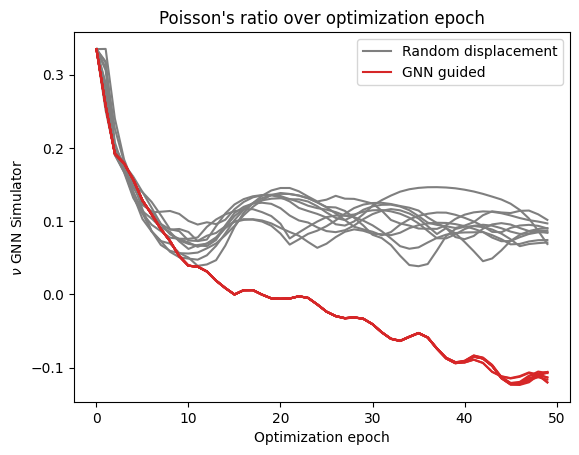

In [20]:
for result in results_random[:-1]:
    plt.plot(result["curr_p"], color="tab:gray")
plt.plot(results_random[-1]["curr_p"], color="tab:gray", label="Random displacement")

for result in results_gnn[:-1]:
    plt.plot(result["curr_p"], color="tab:red")
plt.plot(results_gnn[-1]["curr_p"], color="tab:red", label="GNN guided")

plt.legend()
plt.title("Poisson's ratio over optimization epoch")
plt.ylabel("$\\nu$ GNN Simulator")
plt.xlabel("Optimization epoch")
plt.show()

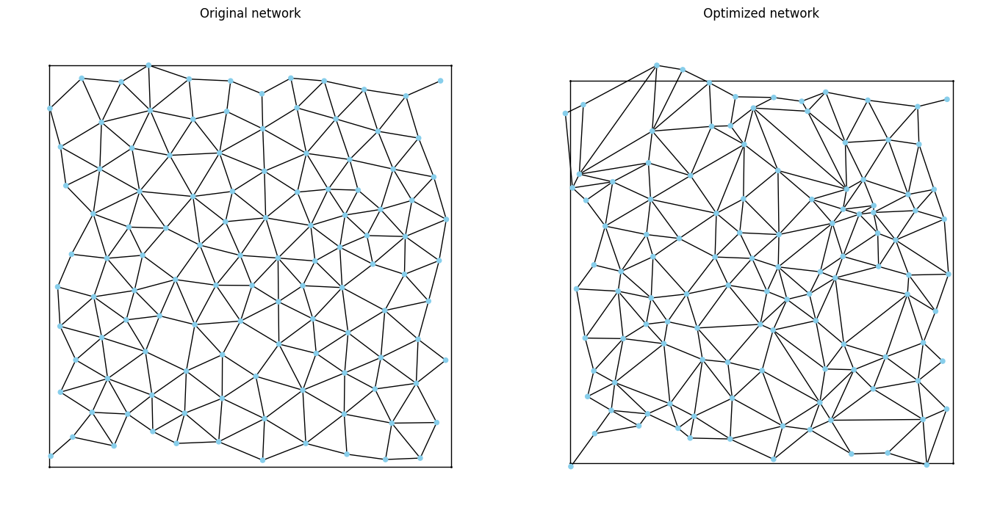

In [21]:
titles = ("Original network", " Optimized network")
draw_two_graphs(results_gnn[0]['graphs'][0], results_gnn[0]['graphs'][-1], box=True, titles=titles)


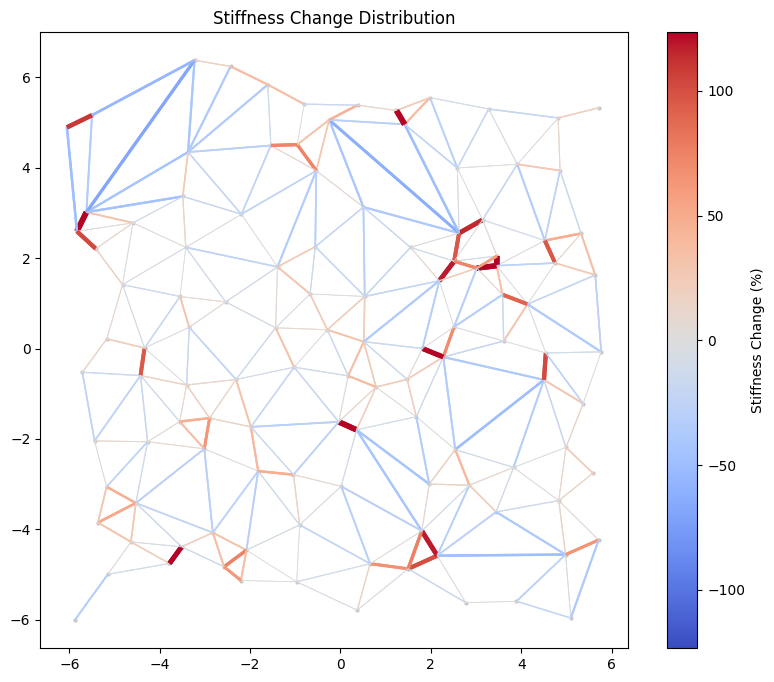

In [22]:
def visualize_stiffness_change(
    graph: Data,
    initial_stiff: Tensor,
    new_stiff: Tensor,
    box_tensor: Tensor | None = None,
    title="Stiffness Change Distribution"
):
    # 1. Prepare Data
    pos = graph.x.detach().cpu().numpy()
    edge_index = graph.edge_index.detach().cpu().numpy()
    
    k_init = initial_stiff.detach().cpu().numpy()
    k_new = new_stiff.detach().cpu().numpy()
    
    # Calculate % change
    delta = (k_new - k_init) / (k_init + 1e-9) * 100 

    # 2. Create Segments
    start_pos = pos[edge_index[0]]
    end_pos = pos[edge_index[1]]
    
    # --- NEW: Periodic Edge Filter ---
    # If we have a box, calculate vector length. If length > box/2, it's a wrap-around edge.
    mask = np.ones(len(edge_index[0]), dtype=bool)
    if box_tensor is not None:
        box = box_tensor.detach().cpu().numpy()
        # Calculate visual distance (dx, dy)
        diff = np.abs(start_pos - end_pos)
        # If dx > box_x/2 or dy > box_y/2, it wraps. Hide it.
        wrap_check = (diff[:, 0] > box[0] / 2.0) | (diff[:, 1] > box[1] / 2.0)
        mask = ~wrap_check # Keep only non-wrapping edges

    # Apply mask to data
    start_pos = start_pos[mask]
    end_pos = end_pos[mask]
    delta = delta[mask]
    
    segments = np.stack((start_pos, end_pos), axis=1)

    # 3. Setup Plot
    _fig, ax = plt.subplots(figsize=(10, 8), dpi=100)
    ax.scatter(pos[:, 0], pos[:, 1], c='gray', s=5, alpha=0.3, zorder=1)

    # 4. Color Mapping
    limit = np.percentile(np.abs(delta), 98) # Smart auto-scale (ignore top 2% outliers)
    norm = mcolors.TwoSlopeNorm(vmin=-limit, vcenter=0, vmax=limit)
    cmap = plt.cm.coolwarm 

    lc = LineCollection(segments, cmap=cmap, norm=norm)
    lc.set_array(delta)
    
    # Variable thickness based on magnitude of change
    linewidths = 0.5 + 3.0 * (np.abs(delta) / limit)
    lc.set_linewidth(np.clip(linewidths, 0.5, 4.0)) # Clip max width
    
    ax.add_collection(lc)
    
    cbar = plt.colorbar(lc, ax=ax)
    cbar.set_label('Stiffness Change (%)')
    ax.set_title(title)
    ax.set_aspect('equal')
    # ax.autoscale()
    
    plt.show()

opt_graph = results_gnn[0]['graphs'][-1]
orig_graph = results_gnn[0]['graphs'][0]

visualize_stiffness_change(opt_graph, orig_graph.edge_attr[:, -1], opt_graph.edge_attr[:, -1], opt_graph.box_tensor)

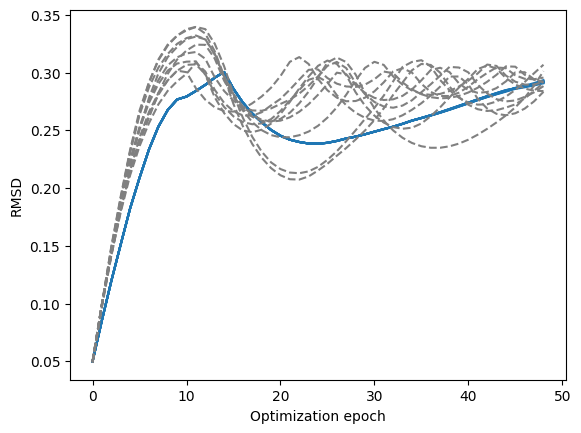

In [23]:
def rmsd(graph1: Data, graph2: Data) -> Tensor:
    return torch.sqrt(torch.nn.functional.mse_loss(graph1.x, graph2.x))

gnn_rmsd = []
for result in results_gnn:
    evo = [rmsd(result['graphs'][0], result['graphs'][i]).item() for i in range(1, len(result['graphs']))]
    gnn_rmsd.append(evo)
    plt.plot(evo, color='tab:blue')

random_rmsd = []
for result in results_random:
    evo = [rmsd(result['graphs'][0], result['graphs'][i]).item() for i in range(1, len(result['graphs']))]
    random_rmsd.append(evo)
    plt.plot(evo, color='gray', linestyle="--")


plt.ylabel('RMSD')
plt.xlabel('Optimization epoch')
plt.show()

In [ ]:
os.chdir("/home/sergey/work/gnn/GNNInverseDesign/")


%run lammps_scripts.py

In [ ]:
def to_directed(graph: Data) -> tuple[Tensor, Tensor]:
    """Converts a bidirected graph to a directed one.

    No native function exists in torch_geometric for some reason.

    Parameters
    ----------
    graph : Data
        Input bidirected graph

    Returns
    -------
    Tuple[Tensor, Tensor]
        Directed `edge_index` and `edge_attr`
    """
    seen = set()

    directed_edge_index = []
    directed_edge_attrs = []
    for edge, edge_attr in zip(graph.edge_index.T, graph.edge_attr):
        s, t = edge[0].item(), edge[1].item()
        edge_tuple = tuple(sorted([s, t]))

        if edge_tuple not in seen:
            seen.add(edge_tuple)
            directed_edge_index.append((s, t))
            directed_edge_attrs.append(edge_attr)
        else:
            continue
    return torch.tensor(directed_edge_index).T, torch.stack(directed_edge_attrs)

def to_network(graph: Data) -> network.Network:
    """Converts torch_geometric `Data` object into `Network` object from network.py.

    Parameters
    ----------
    graph : Data
        input graph

    Returns
    -------
    network.Network
        An object that represents an elastic network
    """
    # create atoms
    atoms = []
    for index, node in enumerate(graph.x):
        atom_id = index + 1
        x = float(node[0])
        y = float(node[1])
        atoms.append(network.Atom(atom_id=atom_id, atom_diameter=0.0, x=x, y=y, z=0.0))

    # update bonds
    bonds = []
    for index, ((source_id, target_id), (ux, uy, length, k)) in enumerate(zip(graph.edge_index.T, graph.edge_attr)):
        atom1 = atoms[int(source_id)]
        atom1.n_bonds += 1
        atom2 = atoms[int(target_id)]
        atom2.n_bonds += 1
        atom2.bonded.append(atom1.atom_id)
        atom1.bonded.append(atom2.atom_id)
        bond_coefficient = float(k.detach().cpu())
        length = float(length.cpu().detach())

        bond = network.Bond(atom1, atom2)
        bond.bond_coefficient = bond_coefficient
        bond.length = length

        bonds.append(bond)

    box_x, box_y = graph.box_tensor[0].item(), graph.box_tensor[1].item()
    box = network.Box(x1=box_x / 2, x2=-box_x / 2, y1=box_y / 2, y2=-box_y / 2, z1=-0.1, z2=0.1)

    header = network.Header(
        atoms,
        bonds,
        box,
    )

    return network.Network(atoms, bonds, box, header, masses={1: 100000.0})

def run_lammps_calc(calculation_directory: str, input_file: str = "lammps.in"):
    """
    A helper function which runs the external lammps code.
    """
    input_file_path = os.path.join(calculation_directory, input_file)
    command = f"lmp -in {input_file_path}".split()

    os.chdir(calculation_directory)
    os.environ["OMP_NUM_THREADS"] = str(1)
    subprocess.run(command, stdout=subprocess.DEVNULL, check=False)

def assemble_data(
    atoms: list[network.Atom],
    bonds: list[network.Bond],
    box: network.Box,
    node_features: str = "coord",
) -> Data:
    """Optimized helper function which assembles the PyTorch_Geometric `Data` object.
    
    Parameters
    ----------
    `atoms` : list
        list of `network.Atom` objects transformed into nodes
    `bonds` : list
        list of `network.Bond` objects transformed into edges
    `node_features` : str, optional
        which node features to include, by default "coord"
    
    Returns
    -------
    Data
        PyTorch_Geometric `Data` object
    """
    n_atoms = len(atoms)
    
    # Vectorized atom ID extraction and mapping
    atom_ids_np = np.array([atom.atom_id for atom in atoms], dtype=np.int64)
    atom_ids = torch.from_numpy(atom_ids_np)
    
    # Create efficient lookup using numpy
    max_id = atom_ids_np.max() + 1
    id_to_index = np.full(max_id, -1, dtype=np.int64)
    id_to_index[atom_ids_np] = np.arange(n_atoms)
    
    # Vectorized edge extraction
    edges_np = np.array([(bond.atom1.atom_id, bond.atom2.atom_id) for bond in bonds], dtype=np.int64)
    edges_with_indices = np.column_stack([
        id_to_index[edges_np[:, 0]],
        id_to_index[edges_np[:, 1]]
    ])
    edge_index = torch.from_numpy(edges_with_indices.T)
    
    # Vectorized edge attributes - build numpy arrays first
    edge_vectors_np = np.array([
        [bond.atom1.x - bond.atom2.x, bond.atom1.y - bond.atom2.y] 
        for bond in bonds
    ], dtype=np.float32)
    
    edge_lengths_np = np.array([bond.length for bond in bonds], dtype=np.float32)
    edge_coeffs_np = np.array([bond.bond_coefficient for bond in bonds], dtype=np.float32)
    
    # Convert to tensors once
    edge_vectors = torch.from_numpy(edge_vectors_np)
    edge_lengths = torch.from_numpy(edge_lengths_np).unsqueeze(1)
    edge_coeffs = torch.from_numpy(edge_coeffs_np).unsqueeze(1)
    
    # Concatenate efficiently
    edge_attr = torch.cat([edge_vectors, edge_lengths, edge_coeffs], dim=1)
    
    # Vectorized node features
    match node_features:
        case "dummy":
            node_features_tensor = torch.zeros((n_atoms, 1), dtype=torch.float32)
        case "vel":
            try:
                node_features_np = np.array([[atom.vx, atom.vy] for atom in atoms], dtype=np.float32)
                node_features_tensor = torch.from_numpy(node_features_np)
            except AttributeError:
                raise Exception("Atoms don't have velocity info")
        case "force":
            try:
                node_features_np = np.array([[atom.fx, atom.fy] for atom in atoms], dtype=np.float32)
                node_features_tensor = torch.from_numpy(node_features_np)
            except AttributeError:
                raise Exception("Atoms don't have forces info")
        case "coord":
            node_features_np = np.array([[atom.x, atom.y] for atom in atoms], dtype=np.float32)
            node_features_tensor = torch.from_numpy(node_features_np)
        case "full":
            node_features_np = np.array([
                [atom.x, atom.y, atom.vx, atom.vy, atom.fx, atom.fy] 
                for atom in atoms
            ], dtype=np.float32)
            node_features_tensor = torch.from_numpy(node_features_np)
        case _:
            raise Exception(f"{node_features} not recognized as feature!")
    
    # Create temporary Data object
    tmp = Data(
        x=node_features_tensor, 
        edge_index=edge_index, 
        edge_attr=edge_attr, 
        box=box, 
        atom_ids=atom_ids
    )
    
    # Get corrected edge vectors
    correct_edge_vectors = get_correct_edge_vec(tmp)
    
    # Update edge attributes efficiently
    updated_edge_attr = torch.cat([correct_edge_vectors, edge_lengths, edge_coeffs], dim=1)
    
    return Data(
        x=node_features_tensor,
        edge_index=edge_index,
        edge_attr=updated_edge_attr,
        box=box,
    )

def parse_dump(
    dump_filepath: str,
    original_network: network.Network,
    node_features: str = "full",
    skip: int = 1,
) -> list[Data]:
    """Optimized version that parses a lammps dump file using vectorization.

    Parameters
    ----------
    `dump_filepath` : str
        Path to the lammps trajectory files
    `original_network` : network.Network
        simulated network to get the accurate information about periodic bonds
    `node_features` : str, optional
        node features to include into Data object, by default "full".
    `skip` : int, optional
        load each n-th step starting from the first, by default 1 (skip none)

    Returns
    -------
    list[Data]
        list of pytorch_geometric Data objects
    """
    with open(dump_filepath, "r", encoding="utf8") as f:
        content = f.readlines()

    # Find all timesteps
    timesteps = [i for i, line in enumerate(content) if "ITEM: TIMESTEP" in line]

    # Pre-compute lookups
    atom_diameter_map = {atom.atom_id: atom.diameter for atom in original_network.atoms}
    original_edge_index = np.array([
        (bond.atom1.atom_id, bond.atom2.atom_id) for bond in original_network.bonds
    ])
    bond_stiffness_map = {
        (bond.atom1.atom_id, bond.atom2.atom_id): bond.bond_coefficient
        for bond in original_network.bonds
    }

    data_list = []
    for i in range(0, len(timesteps) - 1, skip):
        timestep_data = content[timesteps[i] : timesteps[i + 1]]

        # Parse box info
        box_data = [line.split() for line in timestep_data[5:8]]
        x1, x2 = float(box_data[0][0]), float(box_data[0][1])
        y1, y2 = float(box_data[1][0]), float(box_data[1][1])
        z1, z2 = float(box_data[2][0]), float(box_data[2][1])
        box = network.Box(x1, x2, y1, y2, z1, z2)
        box_x = x2 - x1
        box_y = y2 - y1

        # Vectorized atom parsing
        atom_lines = [line.split() for line in timestep_data[9:]]
        atom_data = np.array(atom_lines, dtype=float)
        
        atom_ids = atom_data[:, 0].astype(int)
        positions = atom_data[:, 1:4]  # x, y, z
        velocities = atom_data[:, 4:7]  # vx, vy, vz

        # Create atoms efficiently
        new_atoms = []
        atom_id_to_idx = {}
        for idx, atom_id in enumerate(atom_ids):
            atom = network.Atom(
                atom_id=atom_id,
                atom_diameter=atom_diameter_map[atom_id],
                x=positions[idx, 0],
                y=positions[idx, 1],
                z=positions[idx, 2],
            )
            try:
                atom.vx = velocities[idx, 0]
                atom.vy = velocities[idx, 1]
                atom.vz = velocities[idx, 2]
            except Exception:
                pass # silently eating the exceptions because we don't care if there are velocities
            new_atoms.append(atom)
            atom_id_to_idx[atom_id] = idx

        # Vectorized bond distance calculation
        atom_map = {atom.atom_id: atom for atom in new_atoms}
        
        # Get positions for all bonds
        idx1 = np.array([atom_id_to_idx[edge[0]] for edge in original_edge_index])
        idx2 = np.array([atom_id_to_idx[edge[1]] for edge in original_edge_index])
        
        pos1 = positions[idx1, :2]  # Only x, y for 2D
        pos2 = positions[idx2, :2]
        
        # Vectorized periodic distance calculation
        delta = pos2 - pos1
        
        # Apply periodic boundary conditions
        delta[:, 0] = np.where(np.abs(delta[:, 0]) > box_x / 2,
                               delta[:, 0] - np.sign(delta[:, 0]) * box_x,
                               delta[:, 0])
        delta[:, 1] = np.where(np.abs(delta[:, 1]) > box_y / 2,
                               delta[:, 1] - np.sign(delta[:, 1]) * box_y,
                               delta[:, 1])
        
        # Calculate distances
        distances = np.linalg.norm(delta, axis=1)
        
        # Create bonds
        new_bonds = []
        for bond_idx, (id1, id2) in enumerate(original_edge_index):
            new_bond = network.Bond(atom_map[id1], atom_map[id2])
            new_bond.length = distances[bond_idx]
            new_bond.bond_coefficient = bond_stiffness_map[(id1, id2)]
            new_bonds.append(new_bond)

        data_list.append(assemble_data(new_atoms, new_bonds, box, node_features=node_features))

    return data_list

def check_graph_with_lammps(
    graph: Data,
    lammps_calc_dir: str = "check",
    strain: float = 0.03,
    strain_rate: float = 1e-5,
    manual_dump_frequency: int | None = None
) -> list[Data]:
    edge_index, edge_attr = to_directed(graph)
    directed_graph = Data(x=graph.x, edge_index=edge_index, edge_attr=edge_attr, box_tensor=graph.box_tensor)
    net = to_network(directed_graph)
    net.write_to_file(os.path.join(lammps_calc_dir, "network.lmp"))

    comp_sim = CompressionSimulation(
        box_size=net.box.x,
        strain=strain,
        strain_rate=strain_rate,
        overwrite_dump_freq=manual_dump_frequency,
        lj_active=False,
        temperature_range=lammps_scripts.TemperatureRange(1e-7, 1e-7, 10)
    )

    comp_sim.write_to_file(lammps_calc_dir)
    run_lammps_calc(lammps_calc_dir, input_file="in.deformation")

    lammps_traj = parse_dump(os.path.join(lammps_calc_dir, "dump.lammpstrj"), net, node_features="coord")
    return lammps_traj

base_calc_dir = "/home/sergey/work/gnn/simulator_cascade/check"

original_ps = []
original_trajectories = []
optimized_ps = []
optimized_trajectories = []
for i, result in enumerate(results_random + results_gnn):
    # Create dir
    calc_dir = os.path.join(base_calc_dir, "original", f"graph_{i + 1}")
    os.makedirs(calc_dir, exist_ok=True)
    # Run LAMMPS
    original_graph = result["graphs"][0]
    lammps_traj = check_graph_with_lammps(original_graph, calc_dir, strain=0.01, manual_dump_frequency=200)
    # Collect traj and compute P
    original_trajectories.append(lammps_traj)
    original_p_ratio = calc_p_ratio_box(lammps_traj)
    original_ps.append(original_p_ratio)

    # Create dir
    calc_dir = os.path.join(base_calc_dir, "optimized", f"graph_{i + 1}")
    os.makedirs(calc_dir, exist_ok=True)
    # Run LAMMPS
    optimized_graph = result["graphs"][-1]
    lammps_traj = check_graph_with_lammps(optimized_graph, calc_dir, strain=0.01, manual_dump_frequency=200)
    # Collect traj and compute P
    optimized_trajectories.append(lammps_traj)
    optimized_p_ratio = calc_p_ratio_box(lammps_traj)
    optimized_ps.append(optimized_p_ratio)

print(f"Original LAMMPS P: {original_p_ratio:.3f}")
print(f"Optimized LAMMPS P: {optimized_p_ratio:.3f}")

Original LAMMPS P: 0.349
Optimized LAMMPS P: 0.312


In [28]:
gt_lammps_check = {
    "original_ps": original_ps,
    "optimized_ps": optimized_ps,
    "original_traj": original_trajectories,
    "optimized_traj": optimized_trajectories,
}

torch.save(gt_lammps_check, "/home/sergey/work/gnn/GNNInverseDesign/p_predictor_results/gt_lammps_check.pt")

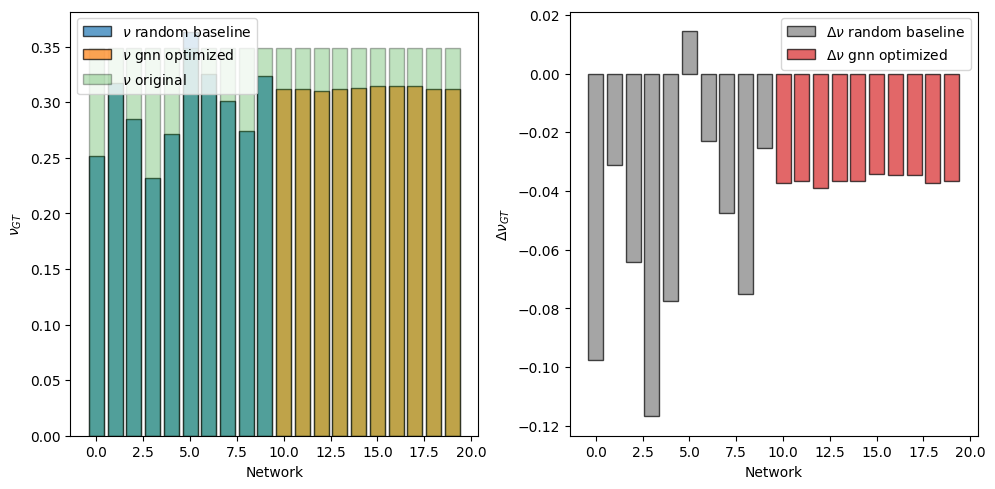

In [29]:
fig, ax = plt.subplots(1, 2, layout="tight", figsize=(10, 5))

ax[0].bar(range(len(results_gnn)), optimized_ps[:n_attempts], edgecolor="black", alpha=0.7, label="$\\nu$ random baseline")
ax[0].bar(range(len(results_gnn), len(results_gnn) * 2), optimized_ps[n_attempts:], edgecolor="black", alpha=0.7, label="$\\nu$ gnn optimized ")
# ax[0].bar(range(len(results_gnn), len(results_gnn)), optimized_ps[n_attempts:], edgecolor="black", alpha=0.7, label="$\\nu$ gnn optimized ")
ax[0].bar(range(len(results_gnn) * 2), original_ps, edgecolor="black", alpha=0.3, label="$\\nu$ original")
# ax[0].bar(range(len(results_gnn)), original_ps, edgecolor="black", alpha=0.3, label="$\\nu$ original")
ax[0].set_ylabel(r"$\nu_{GT}$")
ax[0].set_xlabel("Network")
ax[0].legend()

deltas_baseline = [opt - og for og, opt in zip(original_ps[:n_attempts], optimized_ps[:n_attempts])]
deltas_opt = [opt - og for og, opt in zip(original_ps[n_attempts:], optimized_ps[n_attempts:])]
ax[1].bar(range(len(results_gnn)), deltas_baseline, edgecolor="black", alpha=0.7, color="tab:gray", label="$\\Delta \\nu$ random baseline")
ax[1].bar(range(len(results_gnn), len(results_gnn) * 2), deltas_opt, edgecolor="black", alpha=0.7, color="tab:red", label="$\\Delta \\nu$ gnn optimized")
# ax[1].bar(range(len(results_gnn), len(results_gnn)), deltas_opt, edgecolor="black", alpha=0.7, color="tab:red", label="$\\Delta \\nu$ gnn optimized")
ax[1].set_ylabel(r"$\Delta \nu_{GT}$")
ax[1].set_xlabel("Network")
ax[1].legend()

plt.show()